In [1]:
import os
import numpy as np
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split,Dataset
import torch.optim as optim
import matplotlib.pyplot as plt
from torchvision.io import read_image
from torch.nn import Module, Sequential , ConvTranspose2d, ReLU, Tanh, BatchNorm2d
from torchvision.utils import save_image

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

batch_size=1

Using cuda device


In [ ]:
class CustomImageDataset(Dataset):
    def __init__(self, transform=None, target_transform=None, mode='GAN',folder_label = ''):
      #Mode can be train,test,generated
      #folder_label can be horse,cow for train/generated and Shape1,Shape2 for test
        self.path_to_train = os.path.join('/content/drive/MyDrive/Newdata', mode,folder_label)
        self.path_to_test = os.path.join('/content/drive/MyDrive/Newdata', mode,folder_label)
        self.path_to_fake = os.path.join('/content/drive/MyDrive/Newdata', mode,folder_label)
        self.path_to_train = [os.path.join(self.path_to_train, i) for i in os.listdir(self.path_to_train)]
        self.path_to_fake = [os.path.join(self.path_to_fake, i) for i in os.listdir(self.path_to_fake)]
        self.path_to_test = [os.path.join(self.path_to_test, i) for i in os.listdir(self.path_to_test)]
        self.img_dir = self.path_to_train
        self.nbre_images = len(self.img_dir)
        self.labels = np.ones(self.nbre_images)
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return self.nbre_images

    def __getitem__(self, idx):
        image = read_image(self.img_dir[idx])
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label
    
    
transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((64,64)),
            transforms.ToTensor()
            ])
switch = [transform]
trainset = CustomImageDataset(transform=switch[0]) # Creating an instance of  our class
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=4) # Creating our dataloader



def plot_images(imgs, grid_size = 5):
    fig = plt.figure(figsize = (8,8))
    columns = rows = grid_size
    plt.title("Training Images")

    for i in range(1, columns*rows +1):
        plt.axis("off")
        fig.add_subplot(rows, columns, i)
        plt.imshow(imgs)
    plt.show

FileNotFoundError: ignored

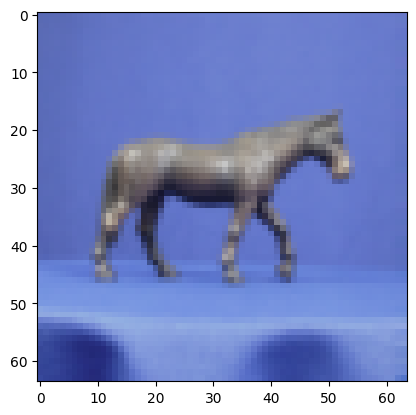

In [ ]:
# Display image and label.
%matplotlib inline
train_features, train_labels = next(iter(trainloader))
img = train_features[0].permute(1,2,0)
label = train_labels[0]
plt.imshow(img, cmap="gray")
plt.show()

In [3]:
nz = 10 # Size of z latent vector (i.e. size of generator input)
ngf = 64 # Size of feature maps in generator
ngpu = 16 # Number of GPUs available
ndf = 64 # Size of feature maps in discriminator
nc = 3   # Number of channels in the training images. For color images this is 3

In [4]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(

            nn.ConvTranspose2d( nz, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d( ngf * 4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),

            nn.ConvTranspose2d( ngf*2, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    def forward(self, input):
        return self.main(input)


myGenerator = Generator(ngpu).to(device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


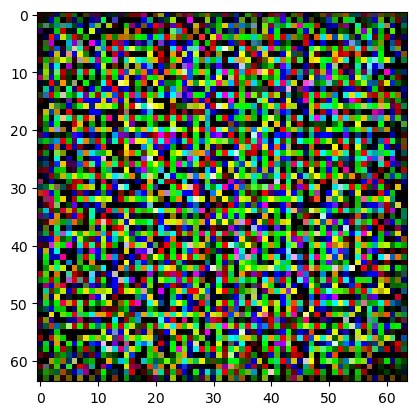

In [5]:
%matplotlib inline
noise = torch.randn(1, 10, 1,1) #random size 1x10x1x1
z = torch.randint(0, 255,(1,10), dtype=torch.float32) #return a random tensor filled with random float-32
z = myGenerator(noise.to(device)).cpu() #Generator generate an image
z = z.detach().squeeze().permute(1, 2, 0).numpy()
plt.imshow(z)
plt.show()

In [6]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(

            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)



myDiscriminator = Discriminator(ngpu).to(device)

In [13]:

fake_image = myGenerator(noise.to(device))
predicted = myDiscriminator(fake_image.detach())
predicted

tensor([[[[0.5087]]]], device='cuda:0', grad_fn=<SigmoidBackward0>)

In [7]:
def weights_init(m):  #custom weights initialization called on myGenerator and myDiscriminator
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

myGenerator.apply(weights_init)
myDiscriminator.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [ ]:
# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(myDiscriminator.parameters(), lr = 0.0002, betas = (0.5, 0.999))
optimizerG = optim.Adam(myGenerator.parameters(), lr = 0.0002, betas = (0.5, 0.999))
# Initialize BCELoss function
BCELoss = nn.BCELoss()

Starting Training Loop...


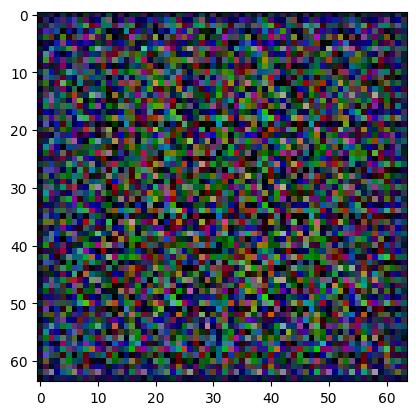

 Epoch 0 
 Completion: 0.000000 percent


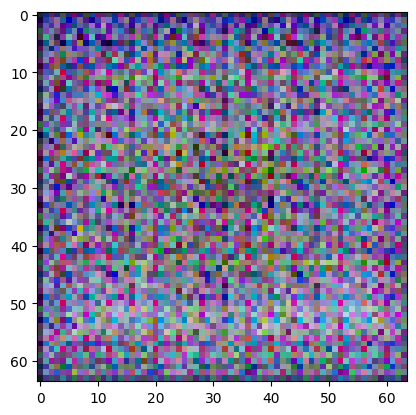

 Epoch 1 
 Completion: 0.250000 percent


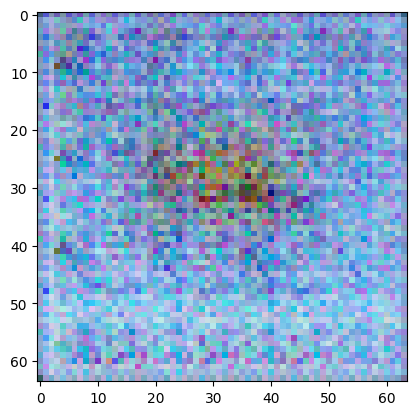

 Epoch 2 
 Completion: 0.500000 percent


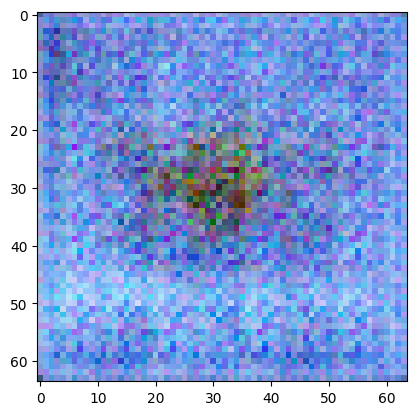

 Epoch 3 
 Completion: 0.750000 percent


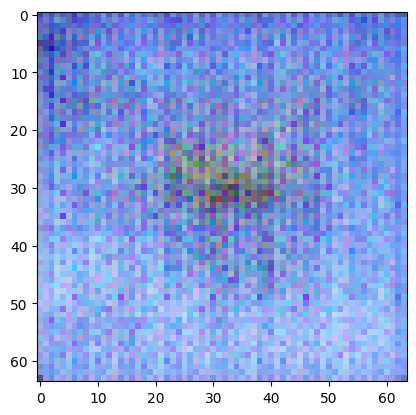

 Epoch 4 
 Completion: 1.000000 percent


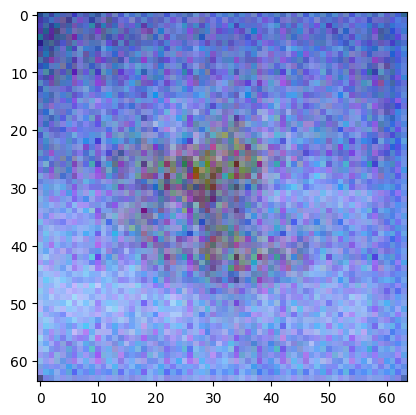

 Epoch 5 
 Completion: 1.250000 percent


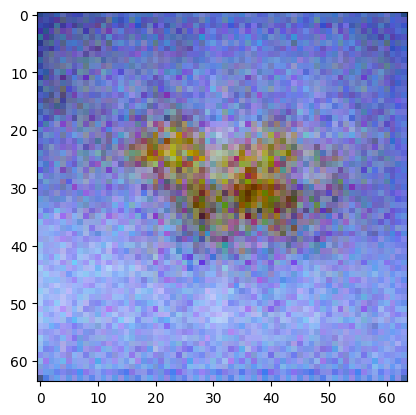

 Epoch 6 
 Completion: 1.500000 percent


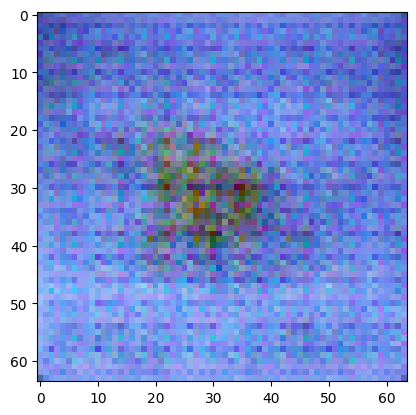

 Epoch 7 
 Completion: 1.750000 percent


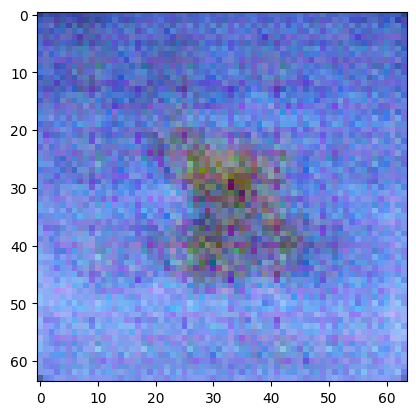

 Epoch 8 
 Completion: 2.000000 percent


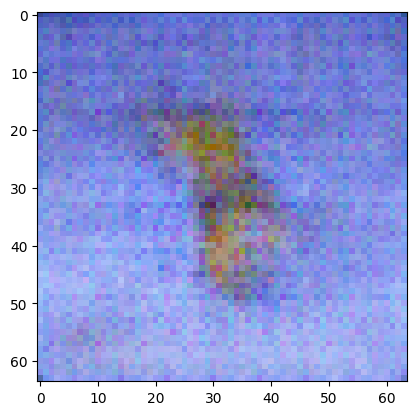

 Epoch 9 
 Completion: 2.250000 percent


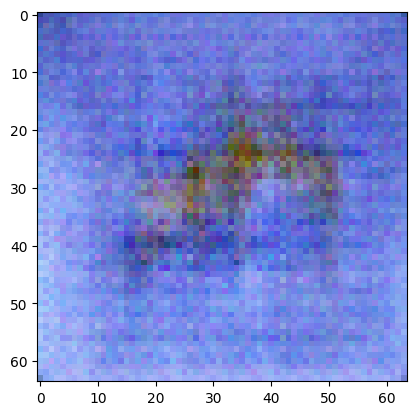

 Epoch 10 
 Completion: 2.500000 percent


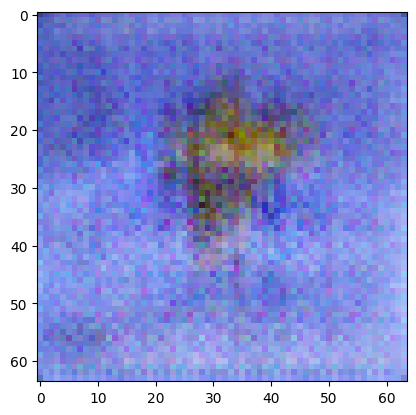

 Epoch 11 
 Completion: 2.750000 percent


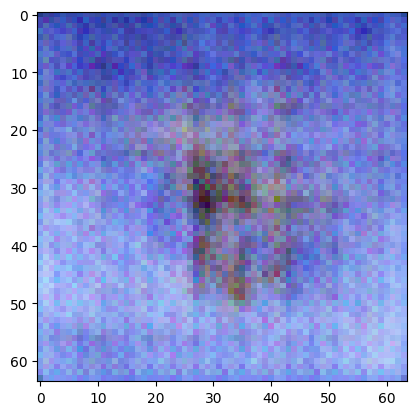

 Epoch 12 
 Completion: 3.000000 percent


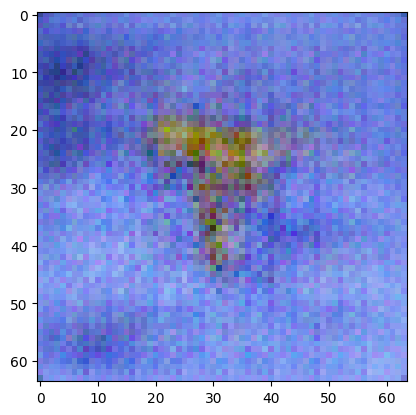

 Epoch 13 
 Completion: 3.250000 percent


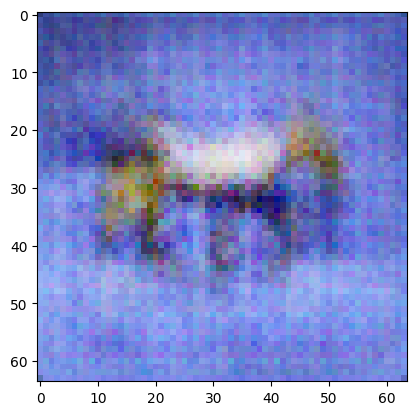

 Epoch 14 
 Completion: 3.500000 percent


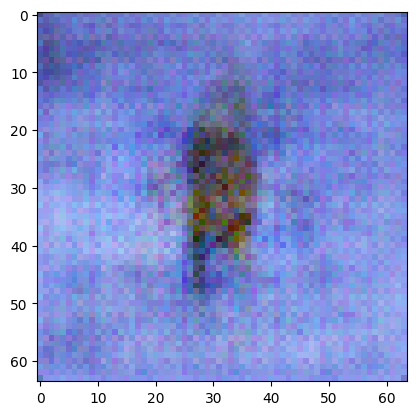

 Epoch 15 
 Completion: 3.750000 percent


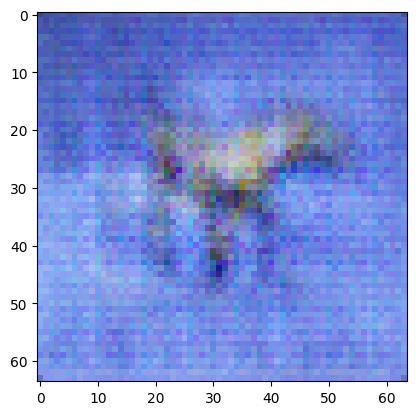

 Epoch 16 
 Completion: 4.000000 percent


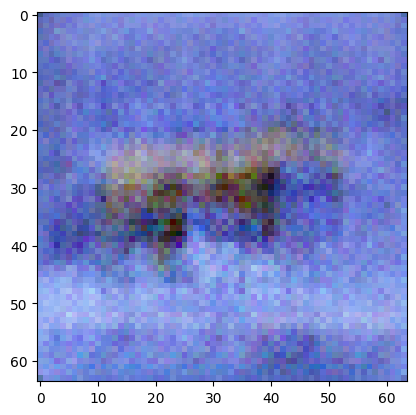

 Epoch 17 
 Completion: 4.250000 percent


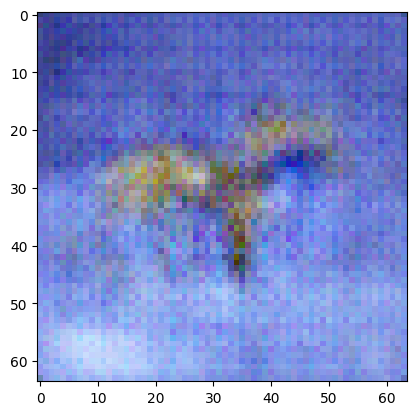

 Epoch 18 
 Completion: 4.500000 percent


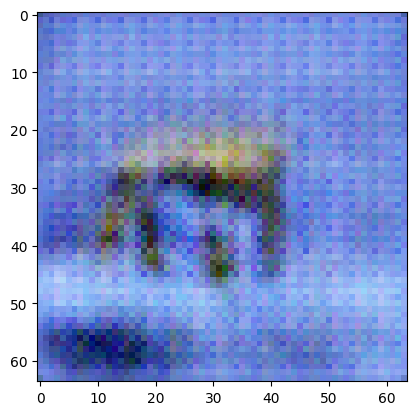

 Epoch 19 
 Completion: 4.750000 percent


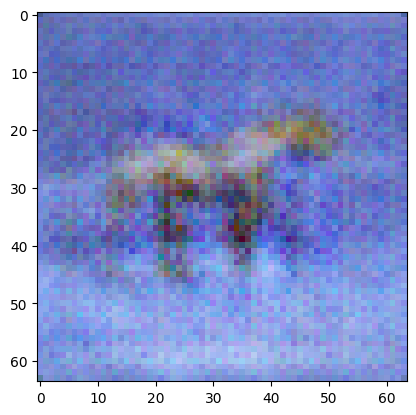

 Epoch 20 
 Completion: 5.000000 percent


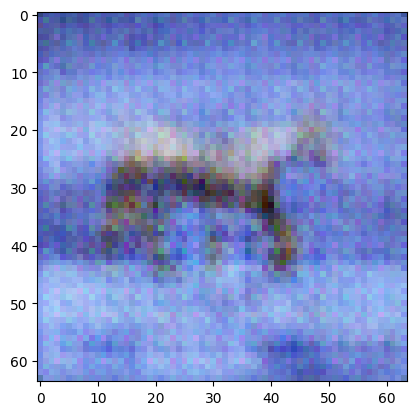

 Epoch 21 
 Completion: 5.250000 percent


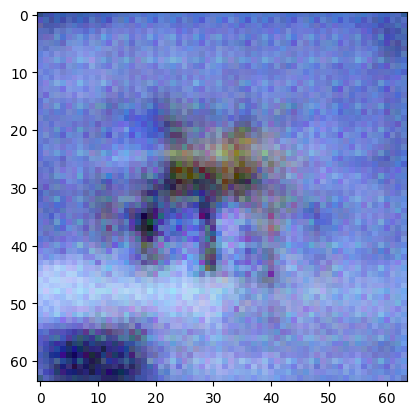

 Epoch 22 
 Completion: 5.500000 percent


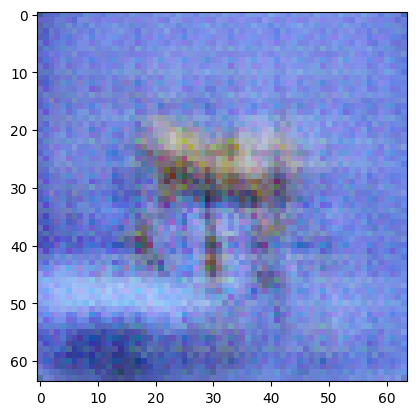

 Epoch 23 
 Completion: 5.750000 percent


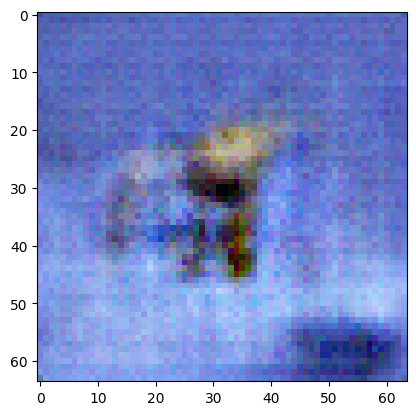

 Epoch 24 
 Completion: 6.000000 percent


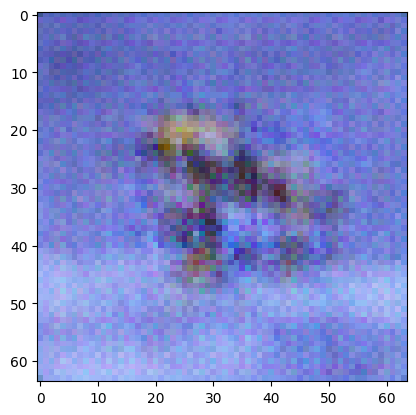

 Epoch 25 
 Completion: 6.250000 percent


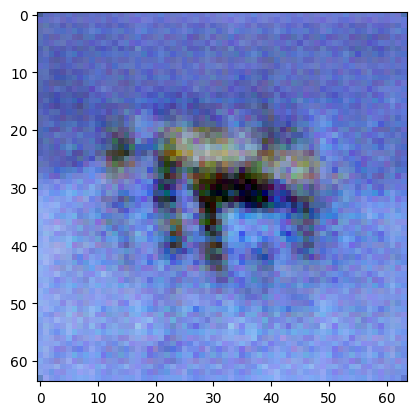

 Epoch 26 
 Completion: 6.500000 percent


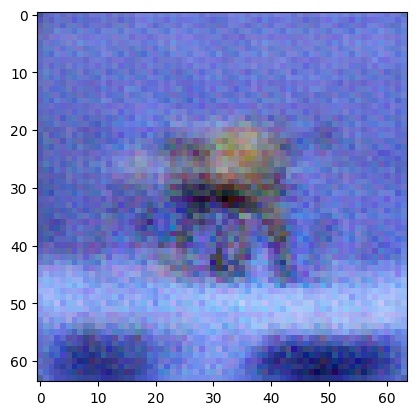

 Epoch 27 
 Completion: 6.750000 percent


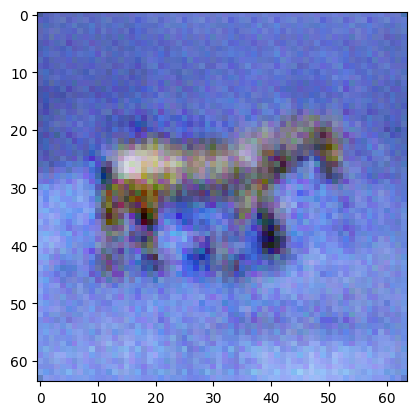

 Epoch 28 
 Completion: 7.000000 percent


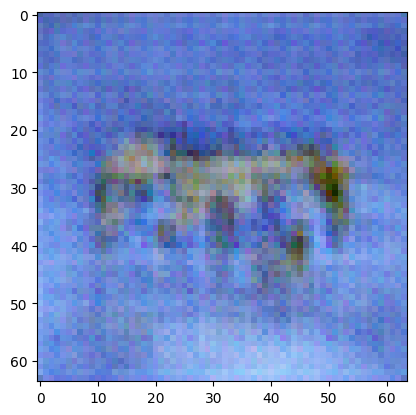

 Epoch 29 
 Completion: 7.250000 percent


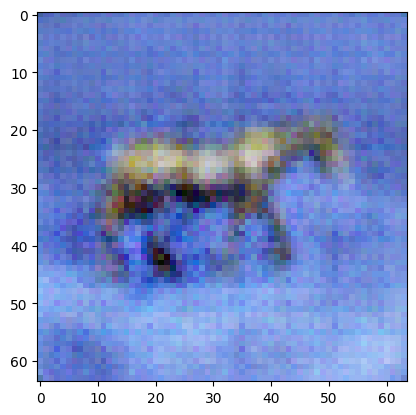

 Epoch 30 
 Completion: 7.500000 percent


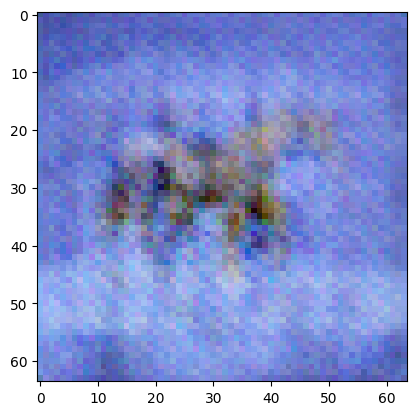

 Epoch 31 
 Completion: 7.750000 percent


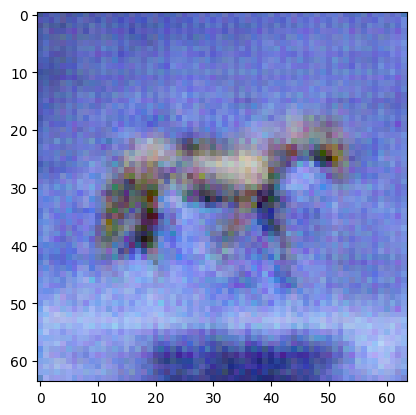

 Epoch 32 
 Completion: 8.000000 percent


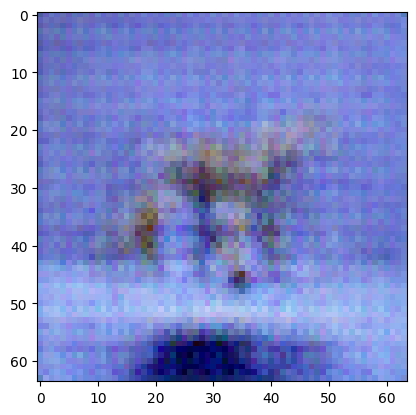

 Epoch 33 
 Completion: 8.250000 percent


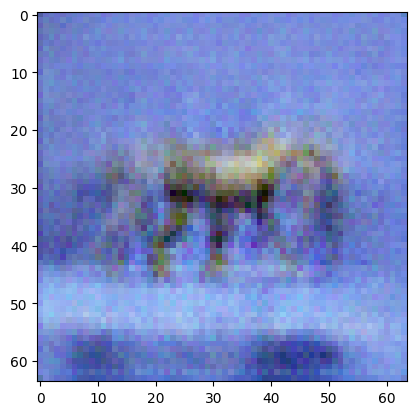

 Epoch 34 
 Completion: 8.500000 percent


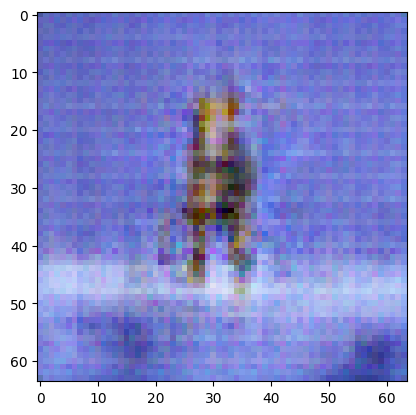

 Epoch 35 
 Completion: 8.750000 percent


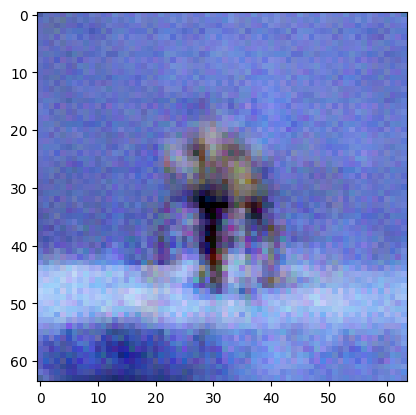

 Epoch 36 
 Completion: 9.000000 percent


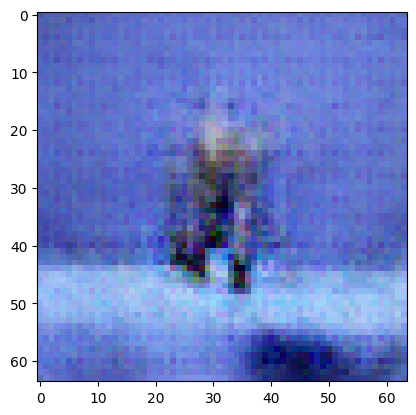

 Epoch 37 
 Completion: 9.250000 percent


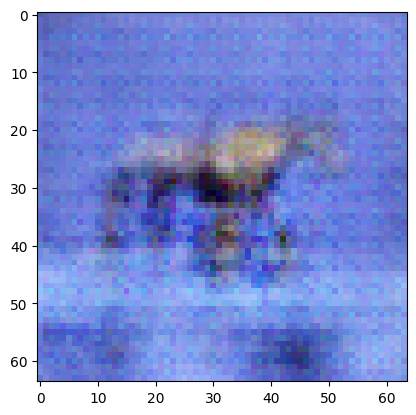

 Epoch 38 
 Completion: 9.500000 percent


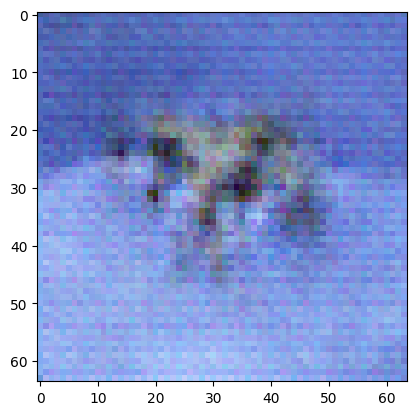

 Epoch 39 
 Completion: 9.750000 percent


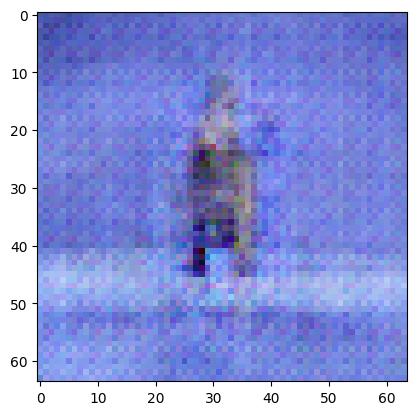

 Epoch 40 
 Completion: 10.000000 percent


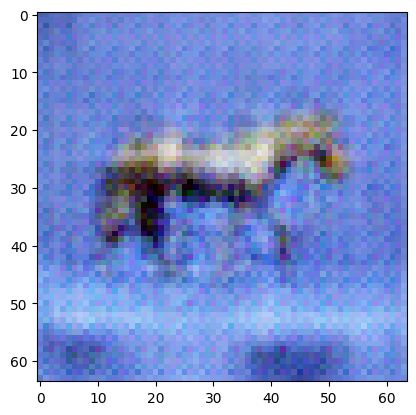

 Epoch 41 
 Completion: 10.250000 percent


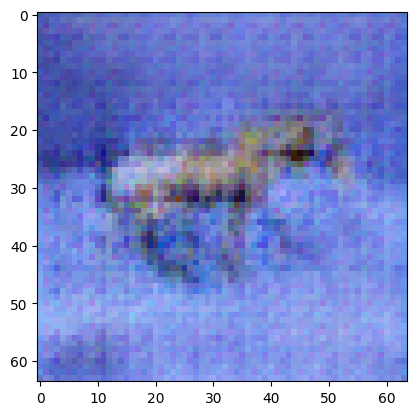

 Epoch 42 
 Completion: 10.500000 percent


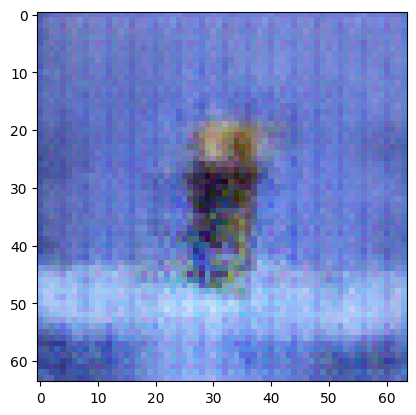

 Epoch 43 
 Completion: 10.750000 percent


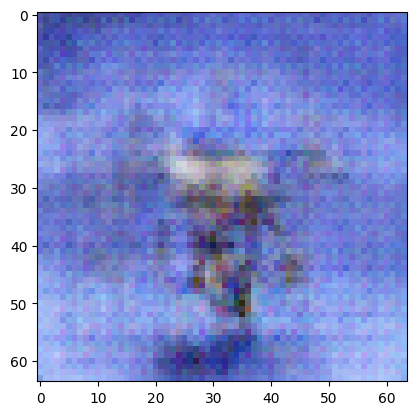

 Epoch 44 
 Completion: 11.000000 percent


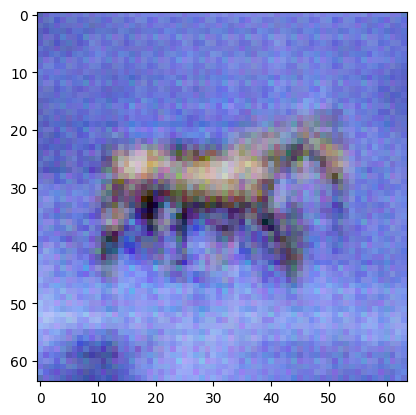

 Epoch 45 
 Completion: 11.250000 percent


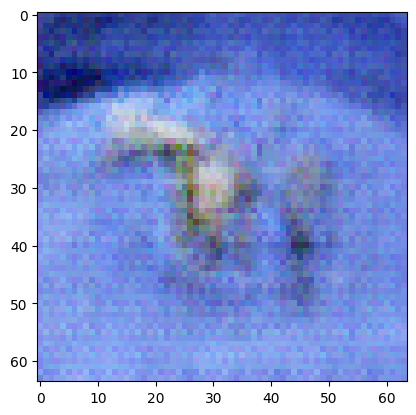

 Epoch 46 
 Completion: 11.500000 percent


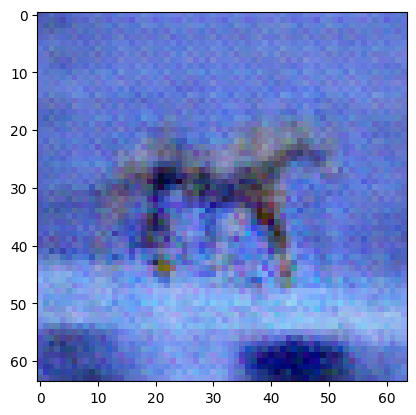

 Epoch 47 
 Completion: 11.750000 percent


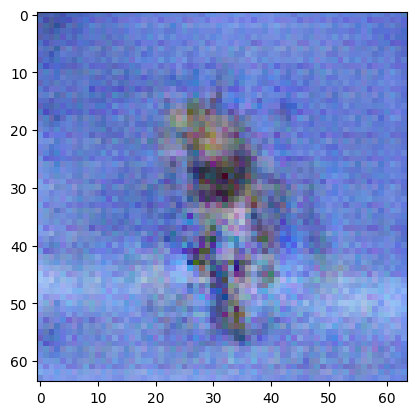

 Epoch 48 
 Completion: 12.000000 percent


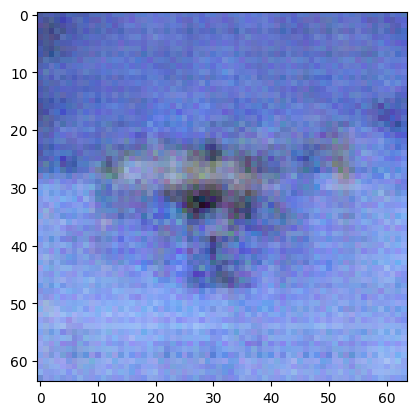

 Epoch 49 
 Completion: 12.250000 percent


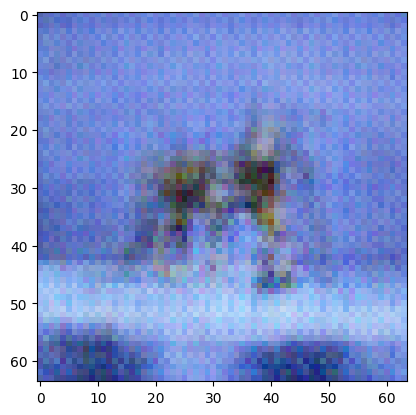

 Epoch 50 
 Completion: 12.500000 percent


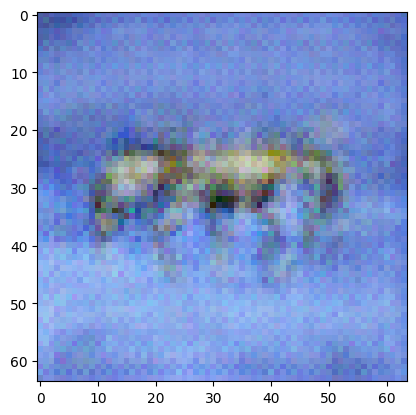

 Epoch 51 
 Completion: 12.750000 percent


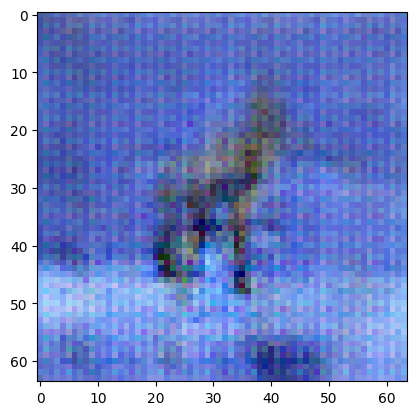

 Epoch 52 
 Completion: 13.000000 percent


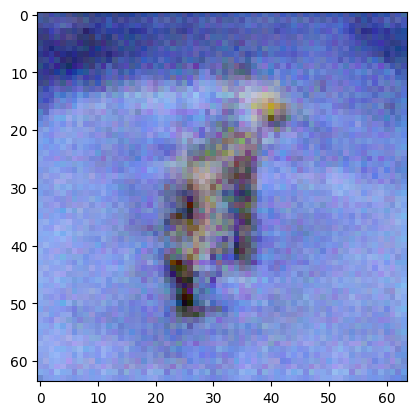

 Epoch 53 
 Completion: 13.250000 percent


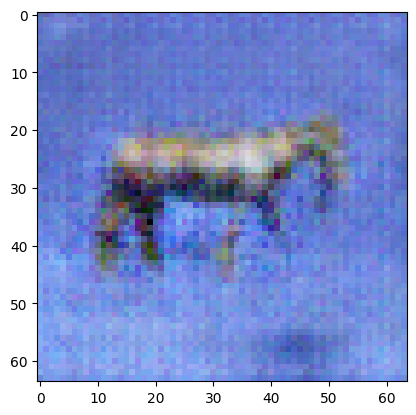

 Epoch 54 
 Completion: 13.500000 percent


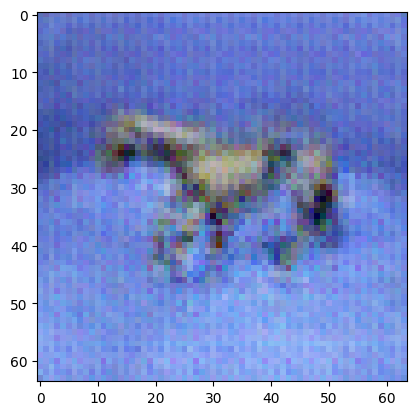

 Epoch 55 
 Completion: 13.750000 percent


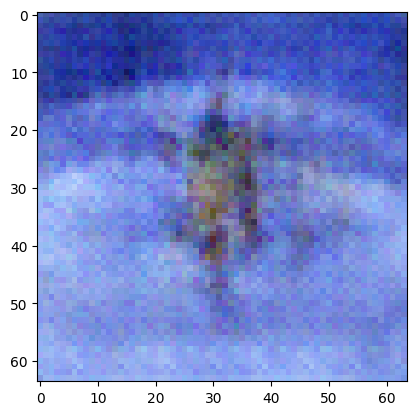

 Epoch 56 
 Completion: 14.000000 percent


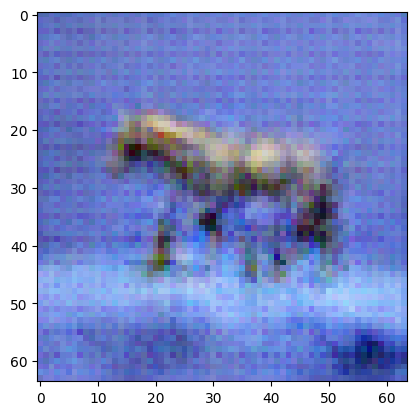

 Epoch 57 
 Completion: 14.250000 percent


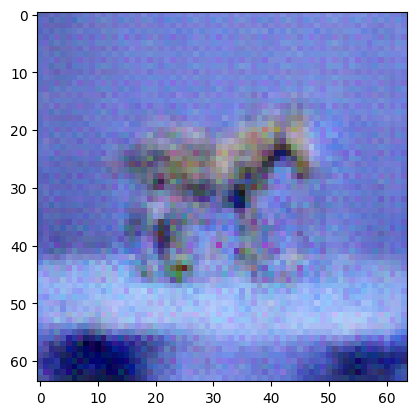

 Epoch 58 
 Completion: 14.500000 percent


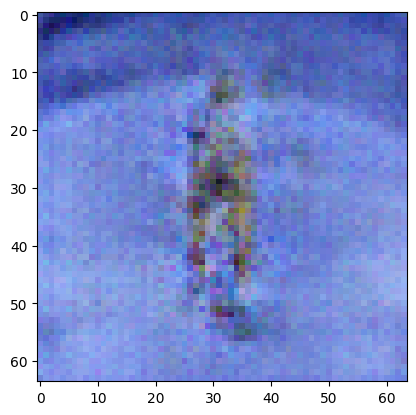

 Epoch 59 
 Completion: 14.750000 percent


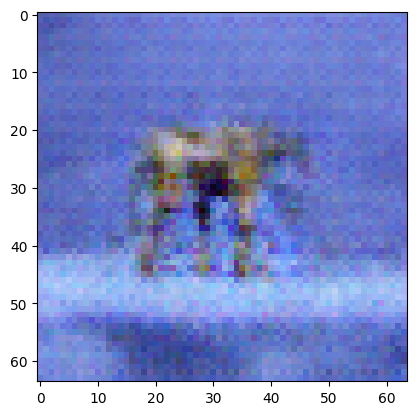

 Epoch 60 
 Completion: 15.000000 percent


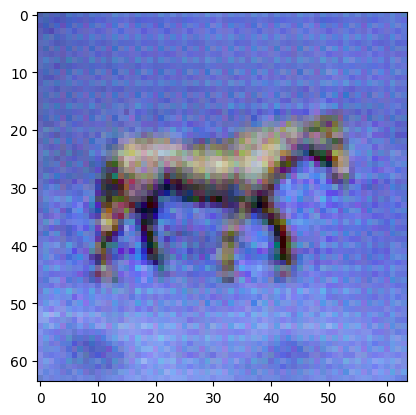

 Epoch 61 
 Completion: 15.250000 percent


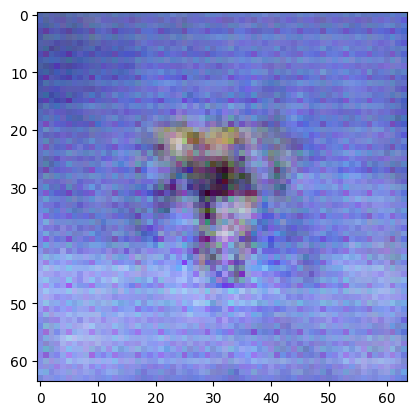

 Epoch 62 
 Completion: 15.500000 percent


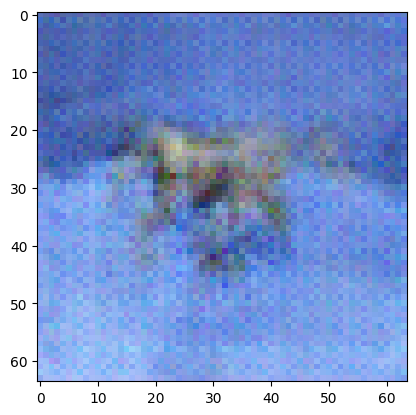

 Epoch 63 
 Completion: 15.750000 percent


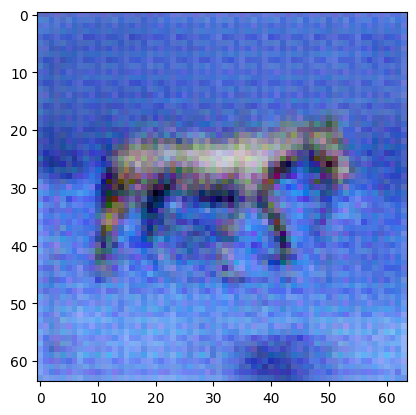

 Epoch 64 
 Completion: 16.000000 percent


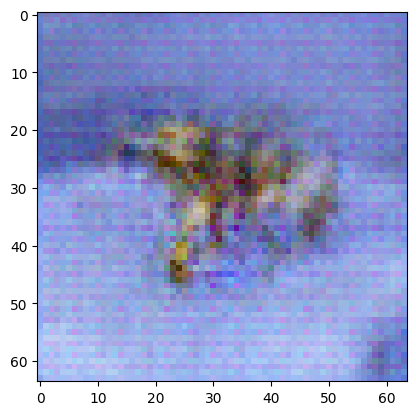

 Epoch 65 
 Completion: 16.250000 percent


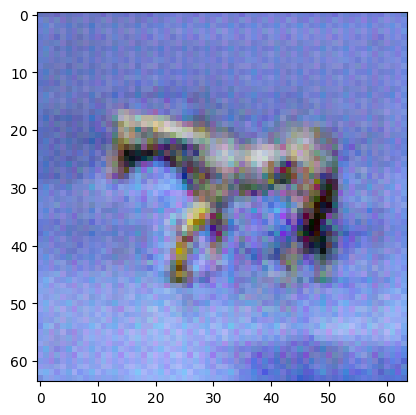

 Epoch 66 
 Completion: 16.500000 percent


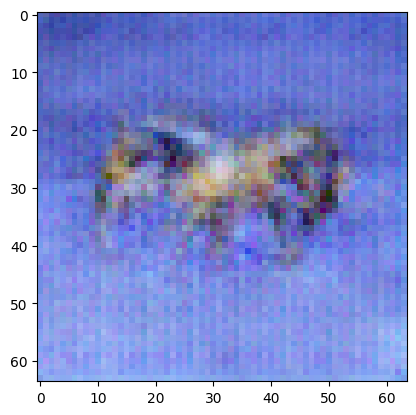

 Epoch 67 
 Completion: 16.750000 percent


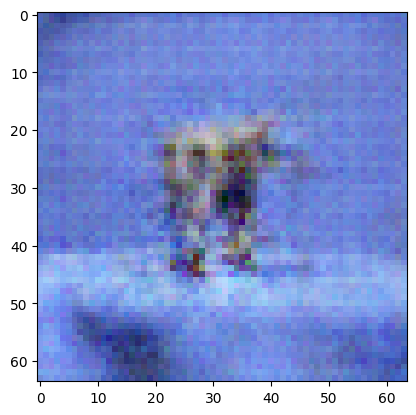

 Epoch 68 
 Completion: 17.000000 percent


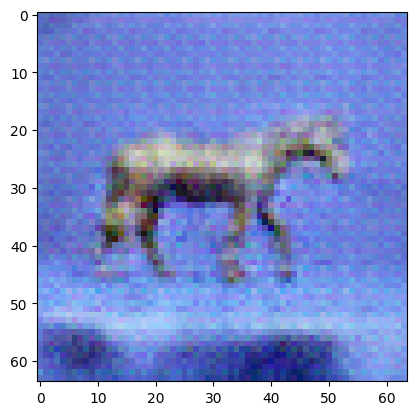

 Epoch 69 
 Completion: 17.250000 percent


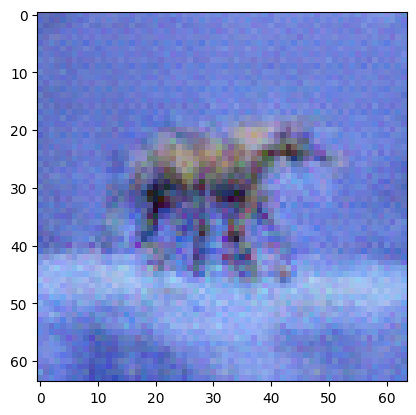

 Epoch 70 
 Completion: 17.500000 percent


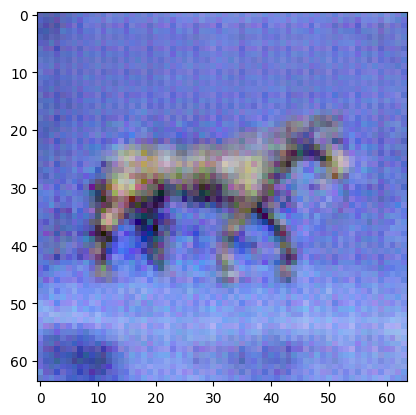

 Epoch 71 
 Completion: 17.750000 percent


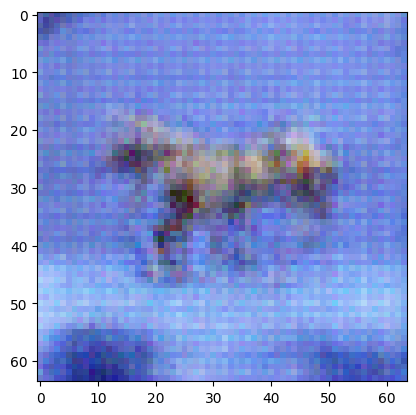

 Epoch 72 
 Completion: 18.000000 percent


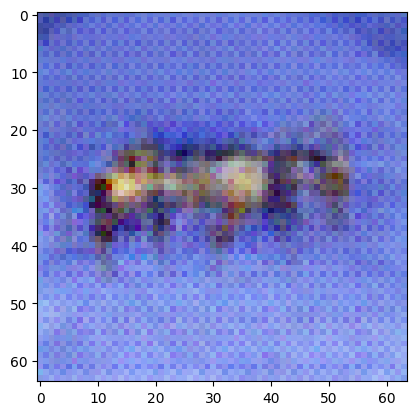

 Epoch 73 
 Completion: 18.250000 percent


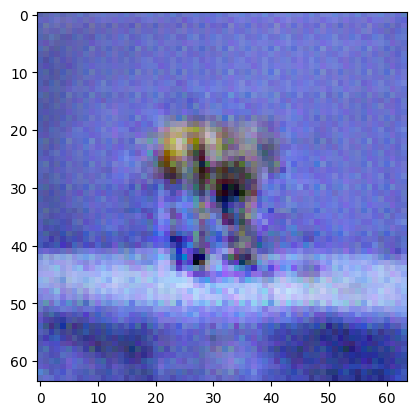

 Epoch 74 
 Completion: 18.500000 percent


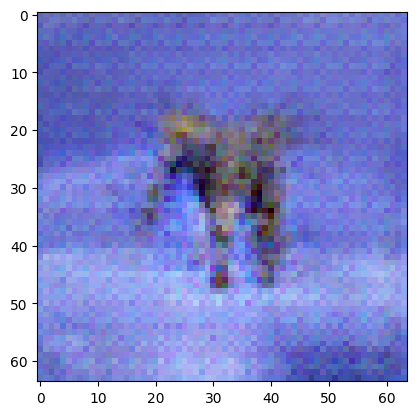

 Epoch 75 
 Completion: 18.750000 percent


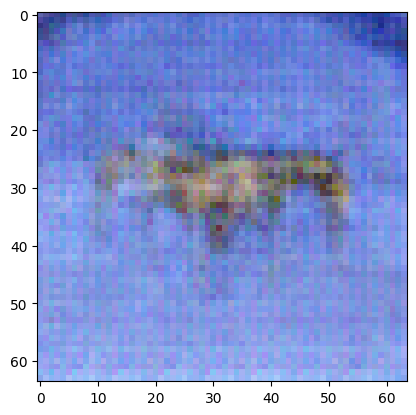

 Epoch 76 
 Completion: 19.000000 percent


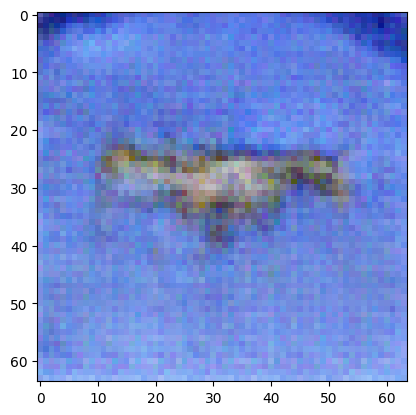

 Epoch 77 
 Completion: 19.250000 percent


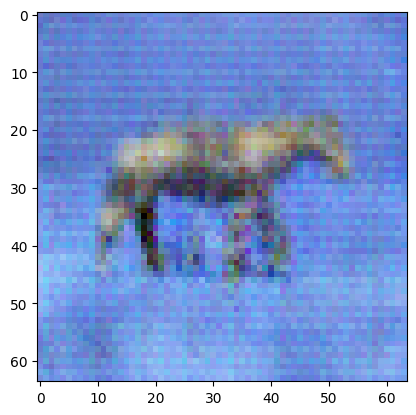

 Epoch 78 
 Completion: 19.500000 percent


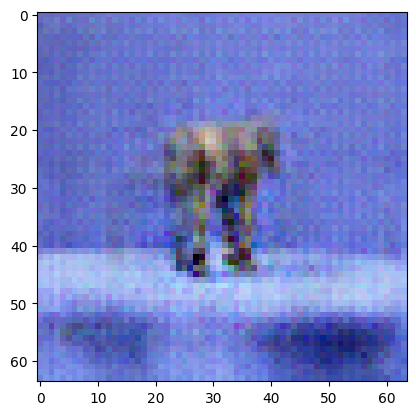

 Epoch 79 
 Completion: 19.750000 percent


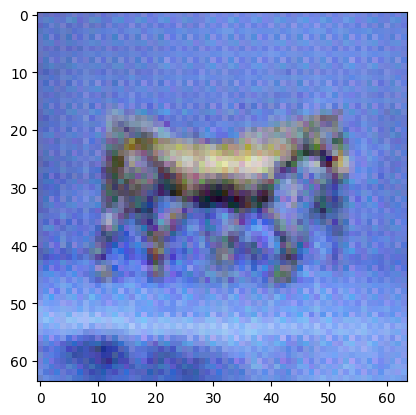

 Epoch 80 
 Completion: 20.000000 percent


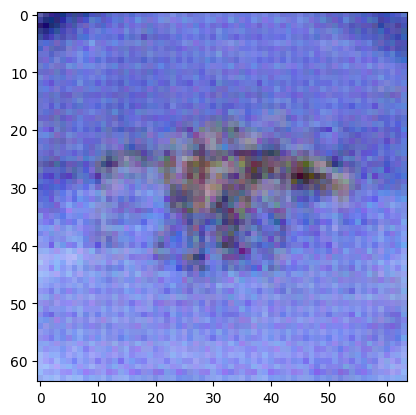

 Epoch 81 
 Completion: 20.250000 percent


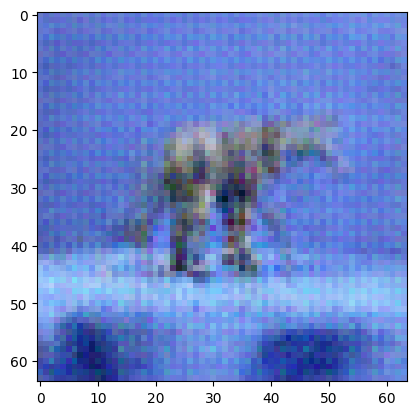

 Epoch 82 
 Completion: 20.500000 percent


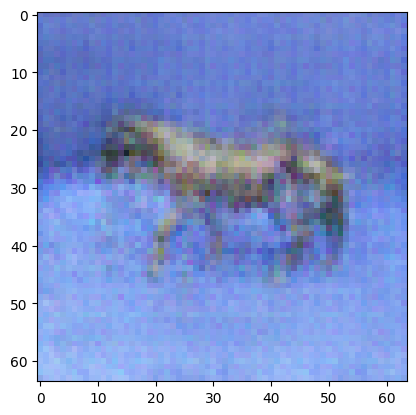

 Epoch 83 
 Completion: 20.750000 percent


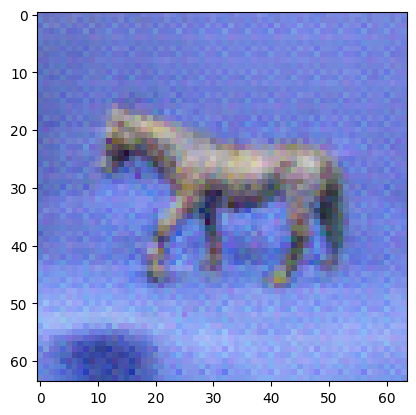

 Epoch 84 
 Completion: 21.000000 percent


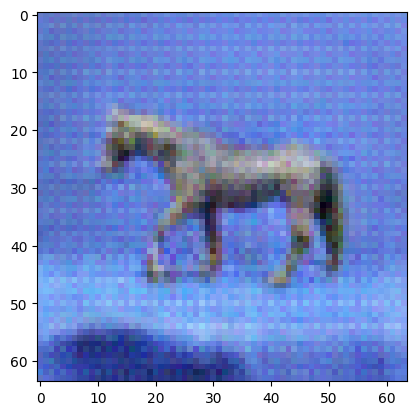

 Epoch 85 
 Completion: 21.250000 percent


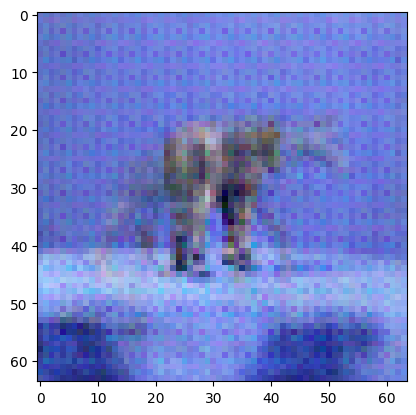

 Epoch 86 
 Completion: 21.500000 percent


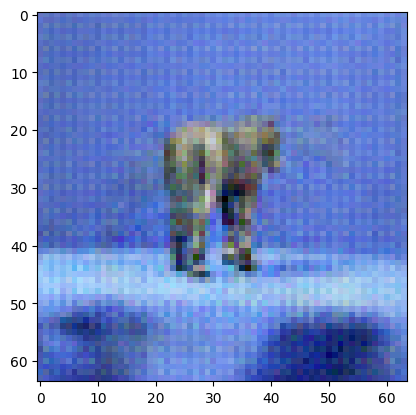

 Epoch 87 
 Completion: 21.750000 percent


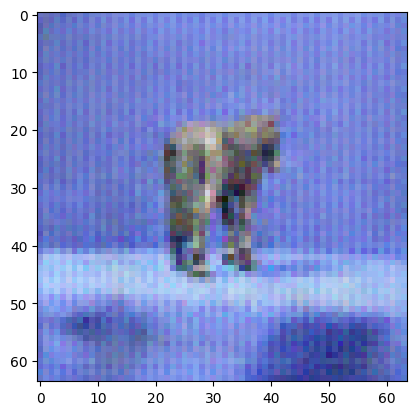

 Epoch 88 
 Completion: 22.000000 percent


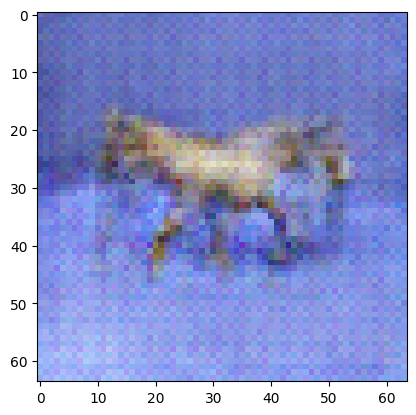

 Epoch 89 
 Completion: 22.250000 percent


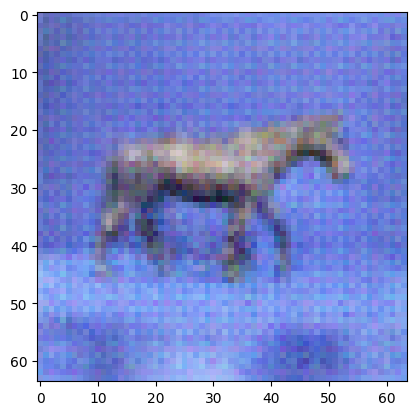

 Epoch 90 
 Completion: 22.500000 percent


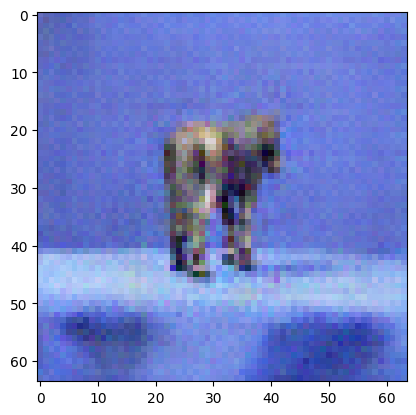

 Epoch 91 
 Completion: 22.750000 percent


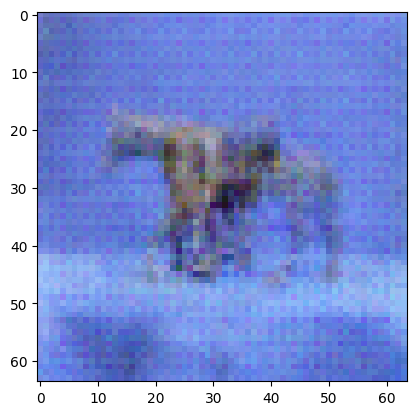

 Epoch 92 
 Completion: 23.000000 percent


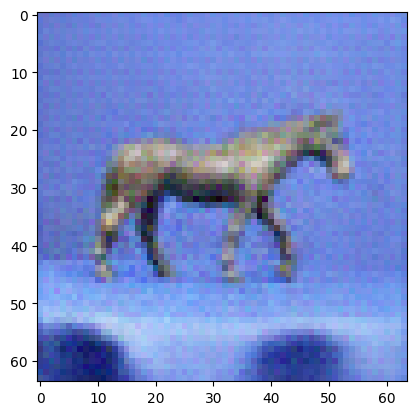

 Epoch 93 
 Completion: 23.250000 percent


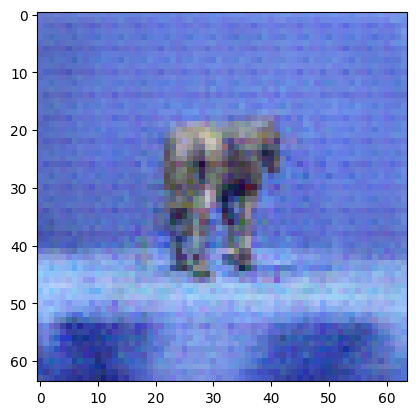

 Epoch 94 
 Completion: 23.500000 percent


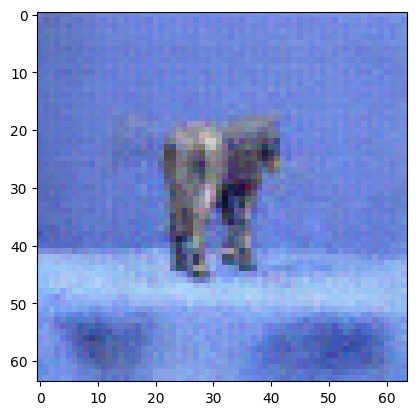

 Epoch 95 
 Completion: 23.750000 percent


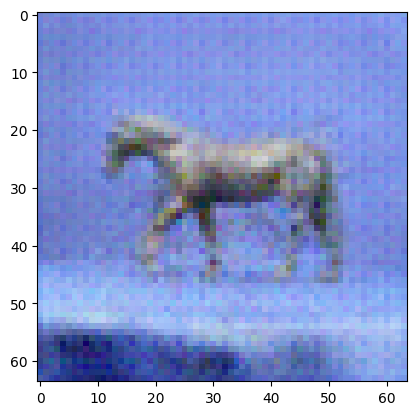

 Epoch 96 
 Completion: 24.000000 percent


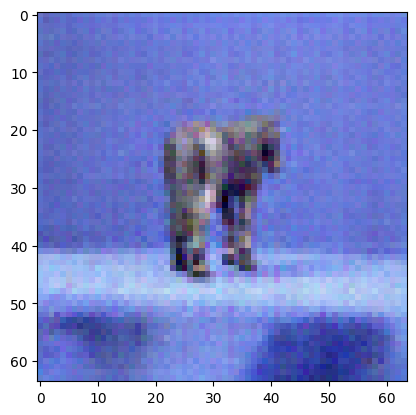

 Epoch 97 
 Completion: 24.250000 percent


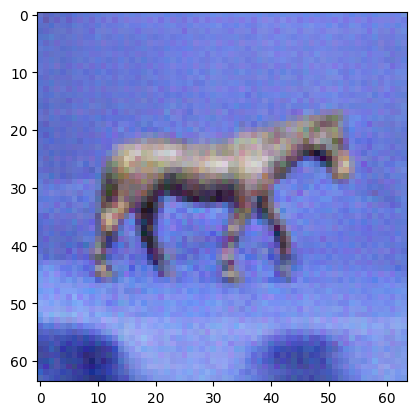

 Epoch 98 
 Completion: 24.500000 percent


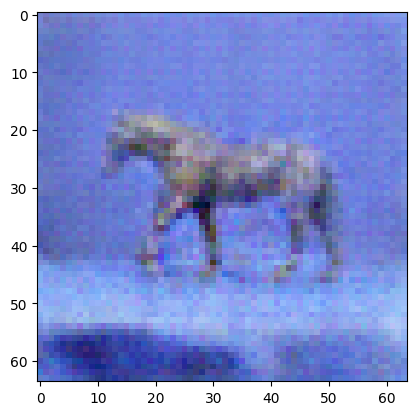

 Epoch 99 
 Completion: 24.750000 percent


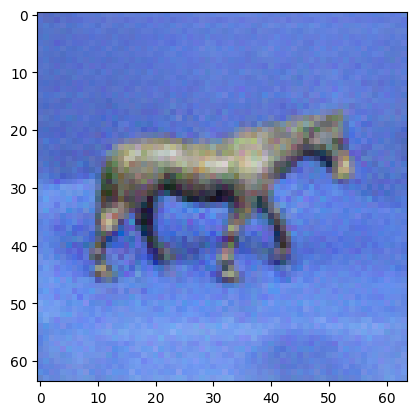

 Epoch 100 
 Completion: 25.000000 percent


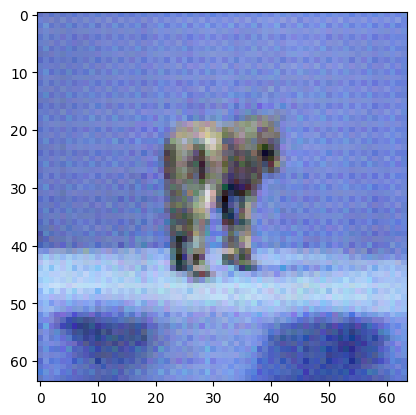

 Epoch 101 
 Completion: 25.250000 percent


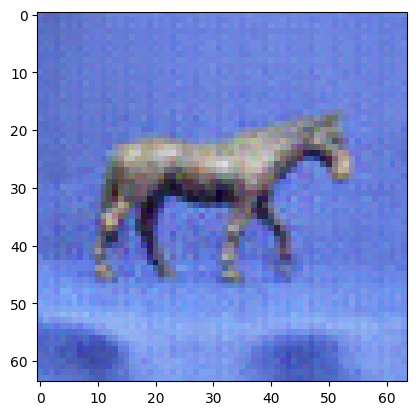

 Epoch 102 
 Completion: 25.500000 percent


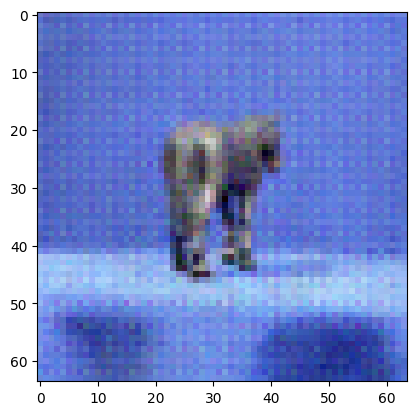

 Epoch 103 
 Completion: 25.750000 percent


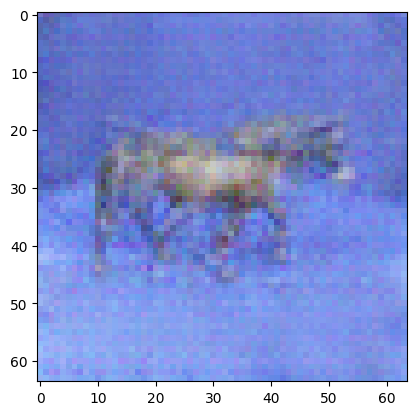

 Epoch 104 
 Completion: 26.000000 percent


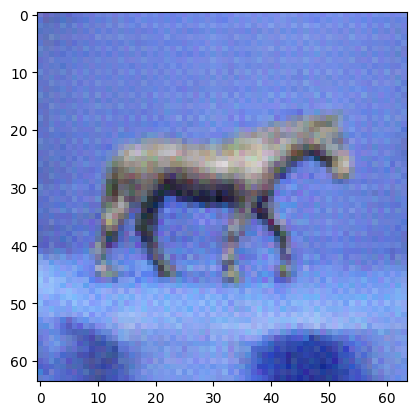

 Epoch 105 
 Completion: 26.250000 percent


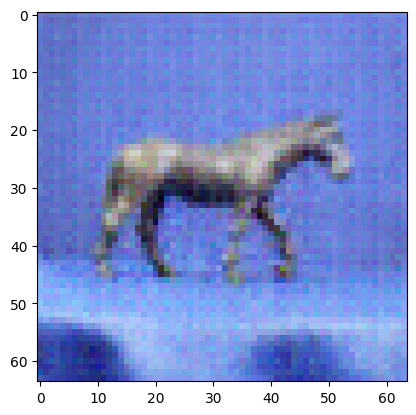

 Epoch 106 
 Completion: 26.500000 percent


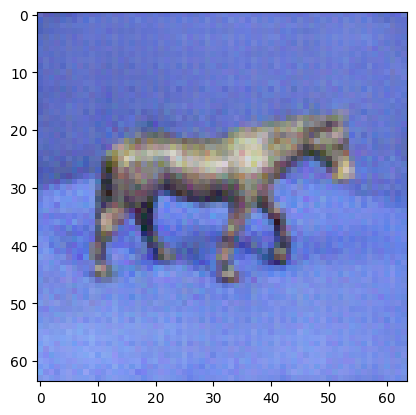

 Epoch 107 
 Completion: 26.750000 percent


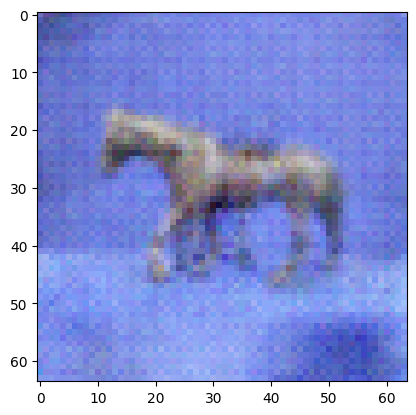

 Epoch 108 
 Completion: 27.000000 percent


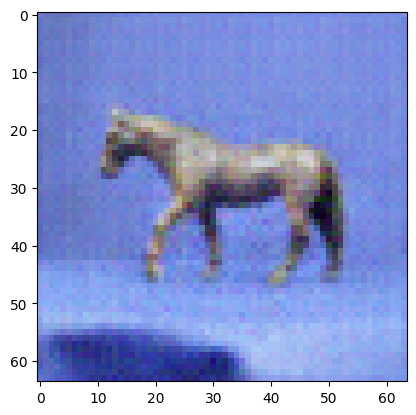

 Epoch 109 
 Completion: 27.250000 percent


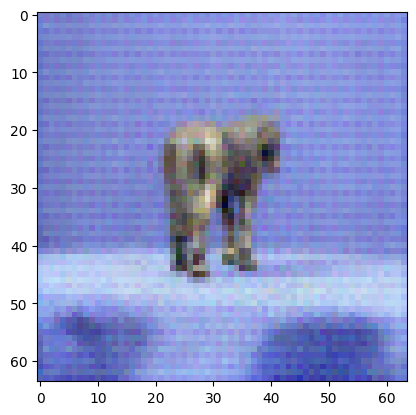

 Epoch 110 
 Completion: 27.500000 percent


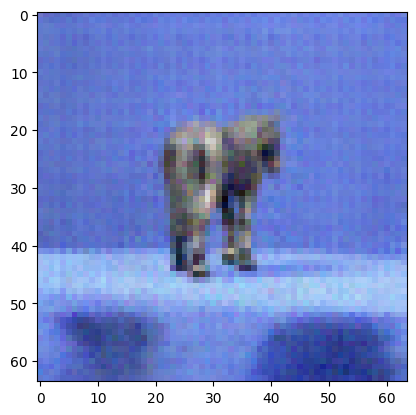

 Epoch 111 
 Completion: 27.750000 percent


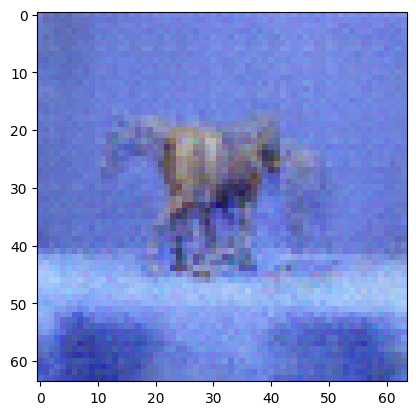

 Epoch 112 
 Completion: 28.000000 percent


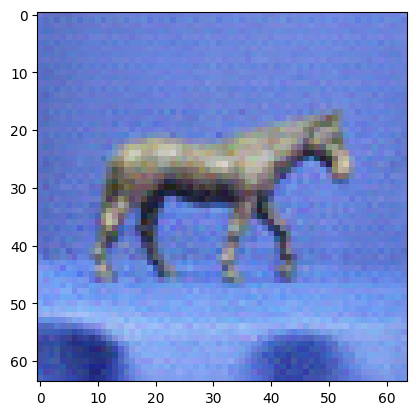

 Epoch 113 
 Completion: 28.250000 percent


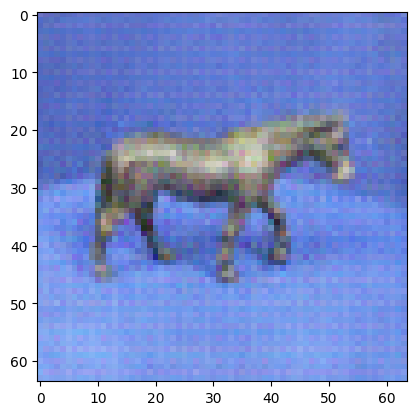

 Epoch 114 
 Completion: 28.500000 percent


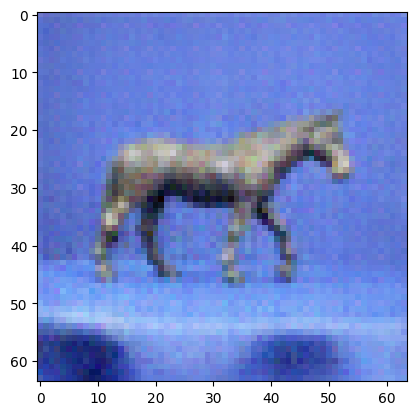

 Epoch 115 
 Completion: 28.750000 percent


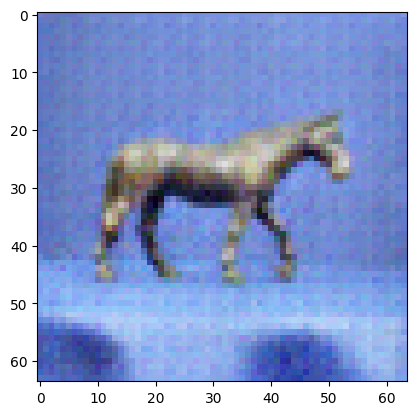

 Epoch 116 
 Completion: 29.000000 percent


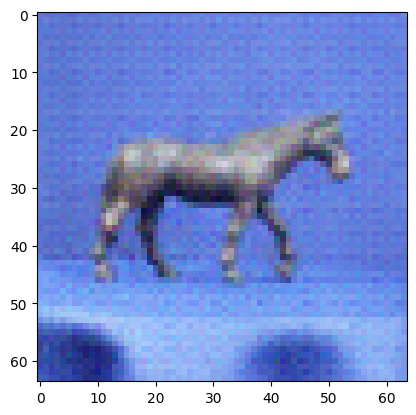

 Epoch 117 
 Completion: 29.250000 percent


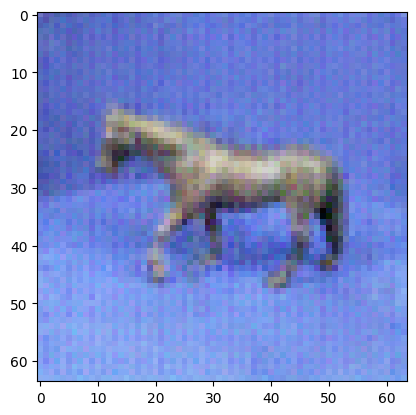

 Epoch 118 
 Completion: 29.500000 percent


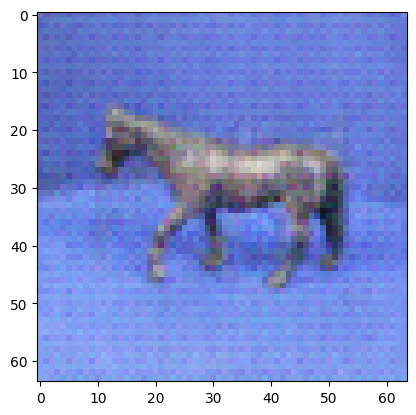

 Epoch 119 
 Completion: 29.750000 percent


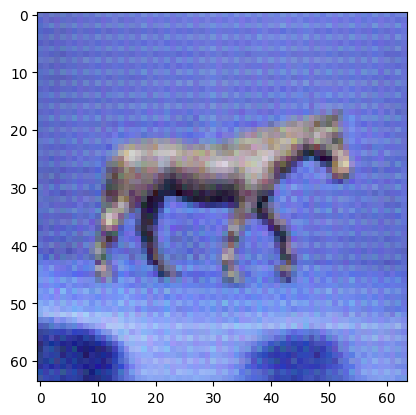

 Epoch 120 
 Completion: 30.000000 percent


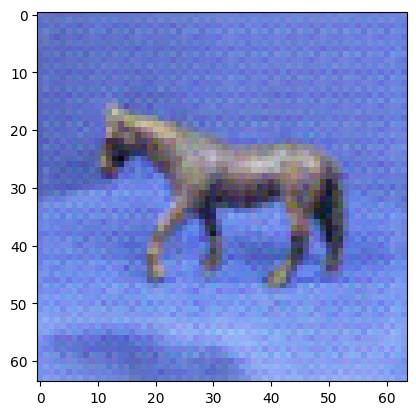

 Epoch 121 
 Completion: 30.250000 percent


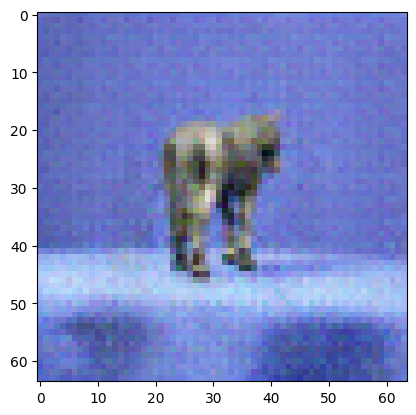

 Epoch 122 
 Completion: 30.500000 percent


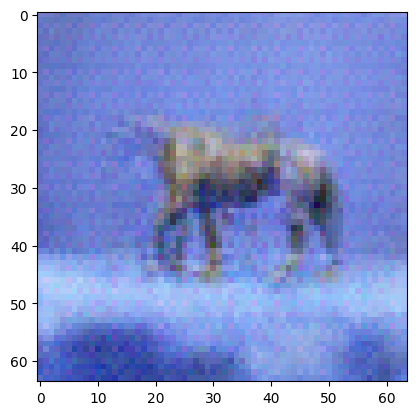

 Epoch 123 
 Completion: 30.750000 percent


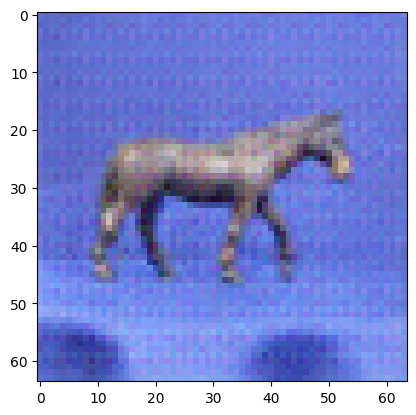

 Epoch 124 
 Completion: 31.000000 percent


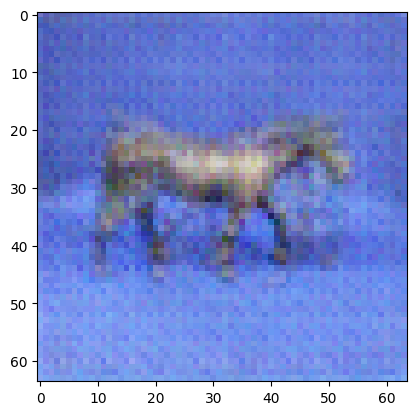

 Epoch 125 
 Completion: 31.250000 percent


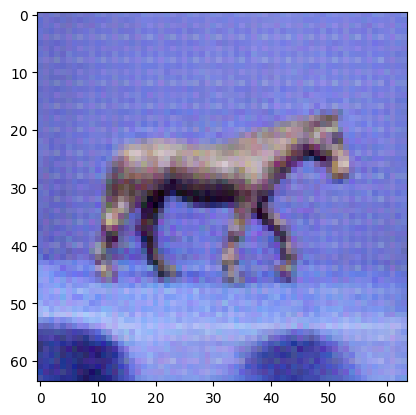

 Epoch 126 
 Completion: 31.500000 percent


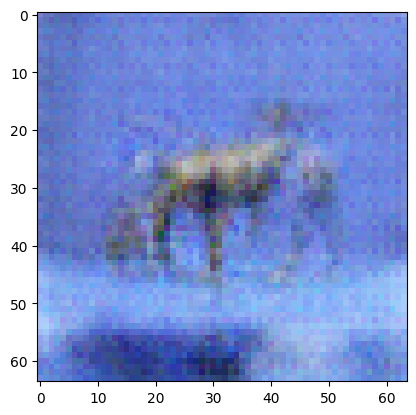

 Epoch 127 
 Completion: 31.750000 percent


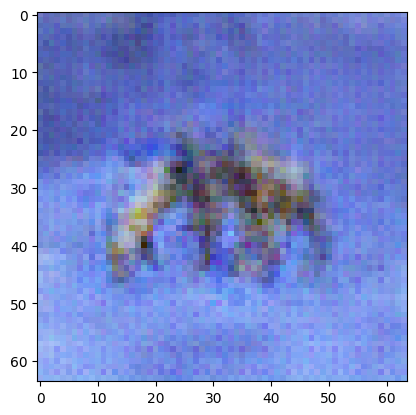

 Epoch 128 
 Completion: 32.000000 percent


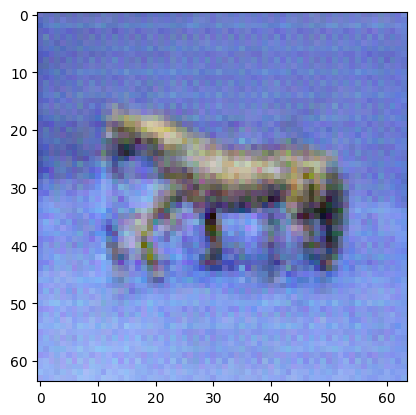

 Epoch 129 
 Completion: 32.250000 percent


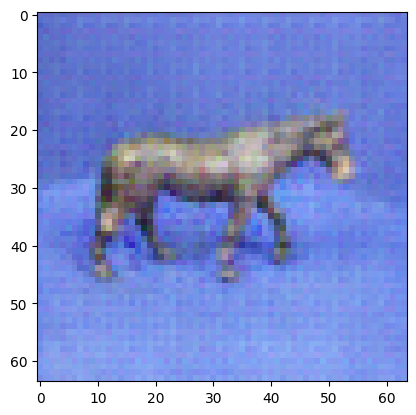

 Epoch 130 
 Completion: 32.500000 percent


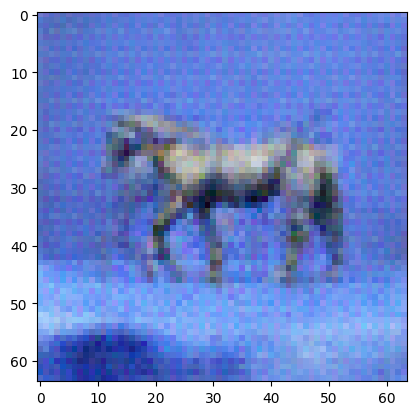

 Epoch 131 
 Completion: 32.750000 percent


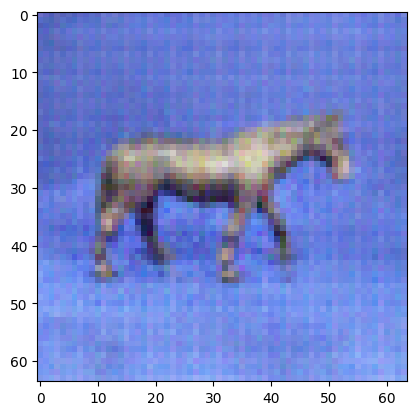

 Epoch 132 
 Completion: 33.000000 percent


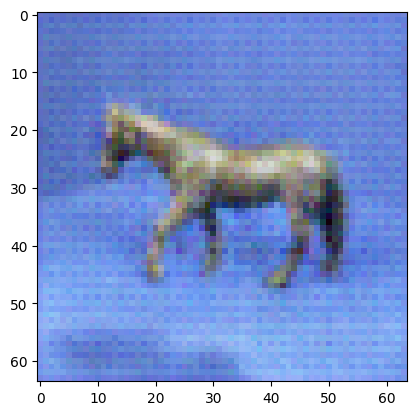

 Epoch 133 
 Completion: 33.250000 percent


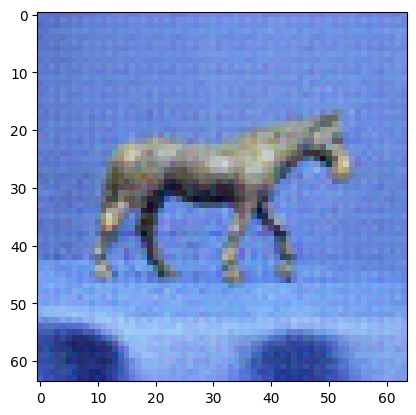

 Epoch 134 
 Completion: 33.500000 percent


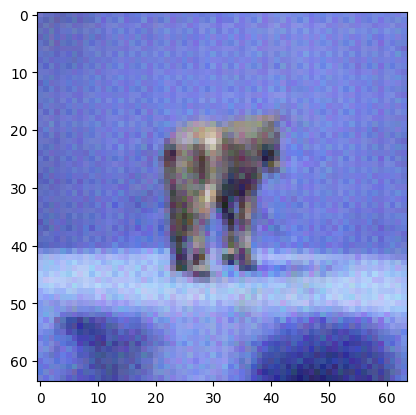

 Epoch 135 
 Completion: 33.750000 percent


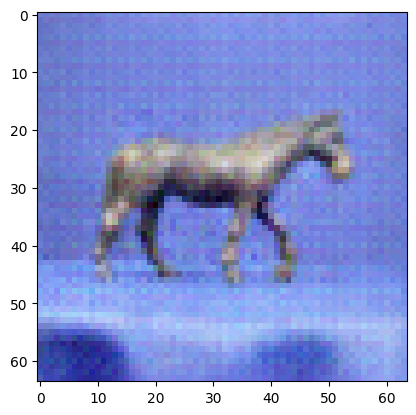

 Epoch 136 
 Completion: 34.000000 percent


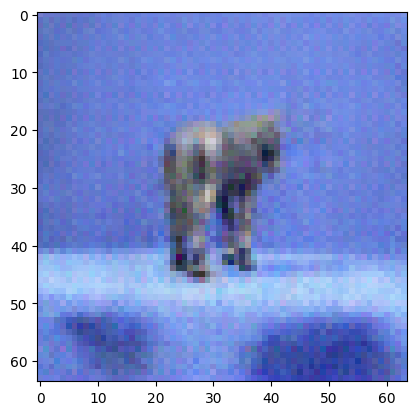

 Epoch 137 
 Completion: 34.250000 percent


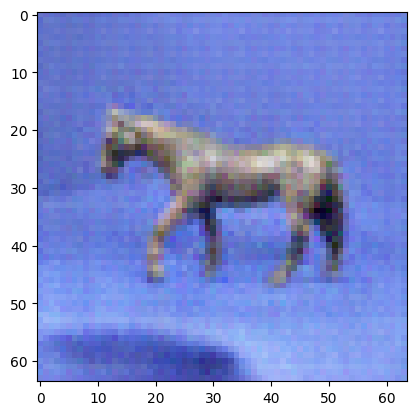

 Epoch 138 
 Completion: 34.500000 percent


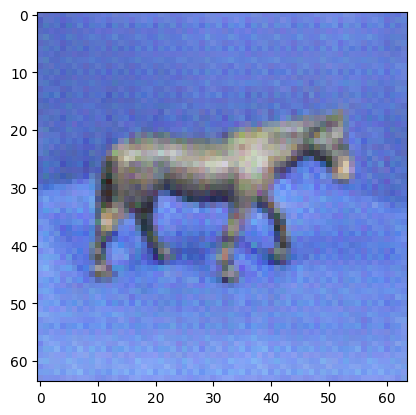

 Epoch 139 
 Completion: 34.750000 percent


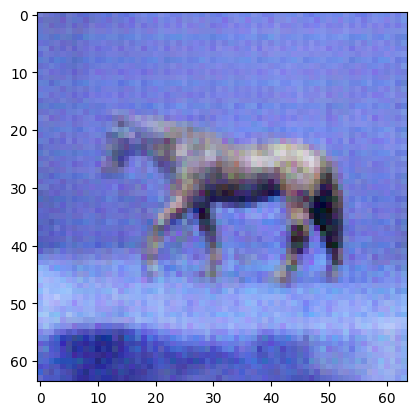

 Epoch 140 
 Completion: 35.000000 percent


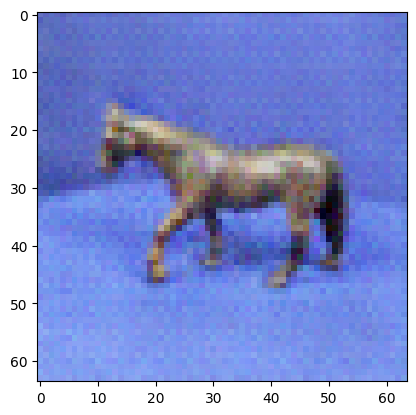

 Epoch 141 
 Completion: 35.250000 percent


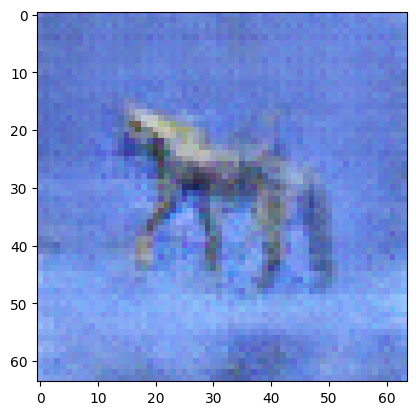

 Epoch 142 
 Completion: 35.500000 percent


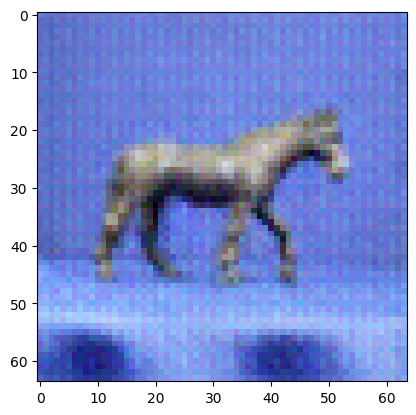

 Epoch 143 
 Completion: 35.750000 percent


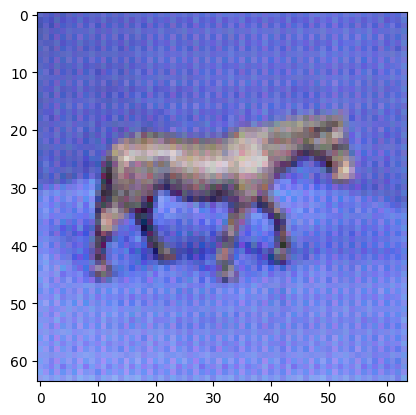

 Epoch 144 
 Completion: 36.000000 percent


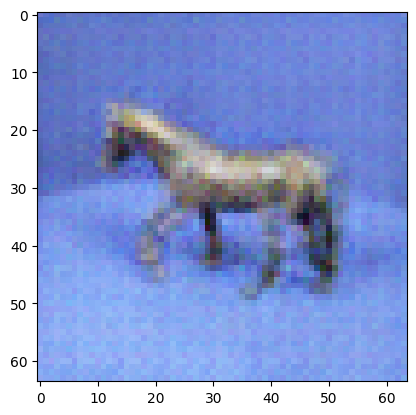

 Epoch 145 
 Completion: 36.250000 percent


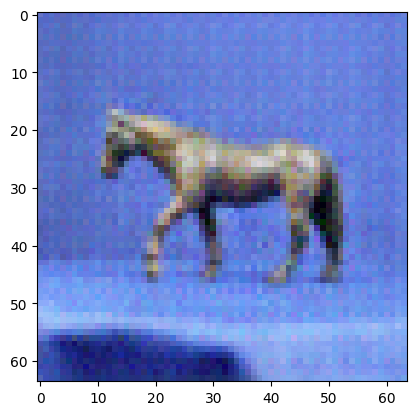

 Epoch 146 
 Completion: 36.500000 percent


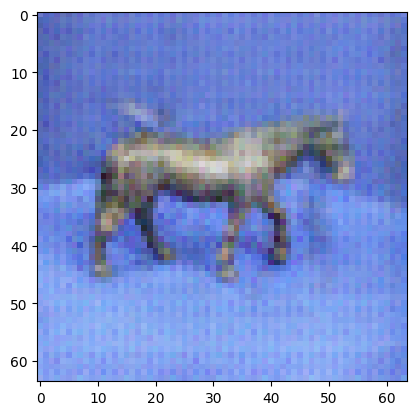

 Epoch 147 
 Completion: 36.750000 percent


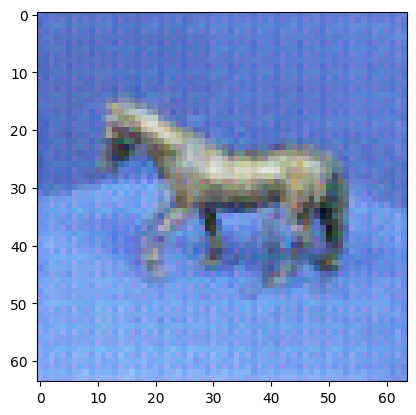

 Epoch 148 
 Completion: 37.000000 percent


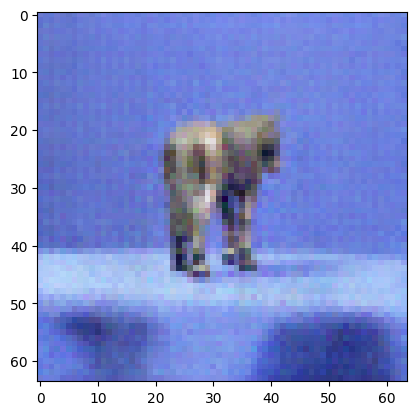

 Epoch 149 
 Completion: 37.250000 percent


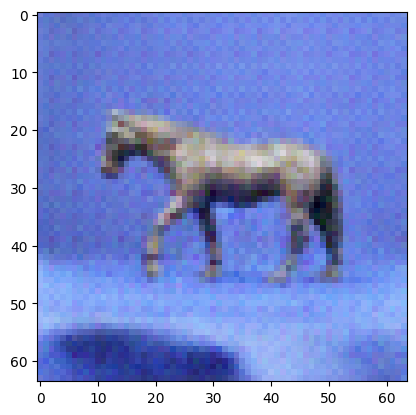

 Epoch 150 
 Completion: 37.500000 percent


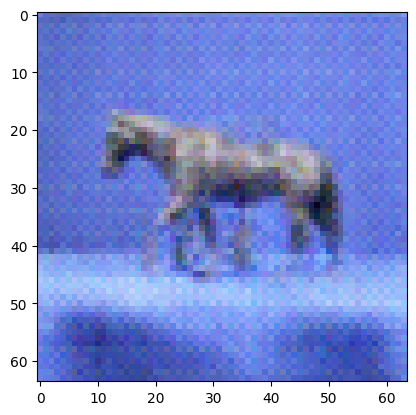

 Epoch 151 
 Completion: 37.750000 percent


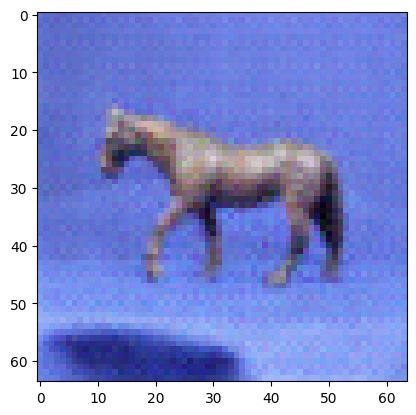

 Epoch 152 
 Completion: 38.000000 percent


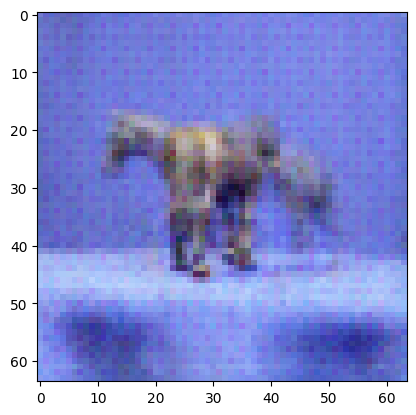

 Epoch 153 
 Completion: 38.250000 percent


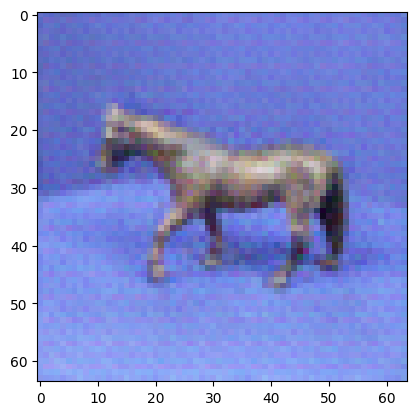

 Epoch 154 
 Completion: 38.500000 percent


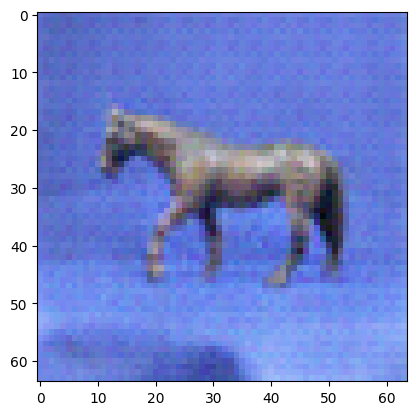

 Epoch 155 
 Completion: 38.750000 percent


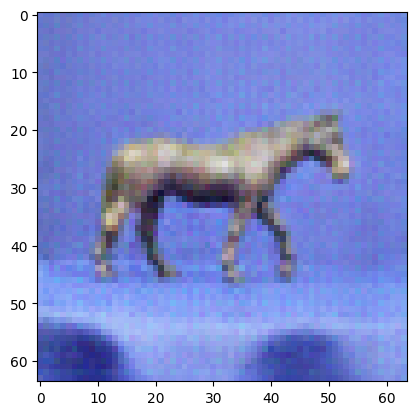

 Epoch 156 
 Completion: 39.000000 percent


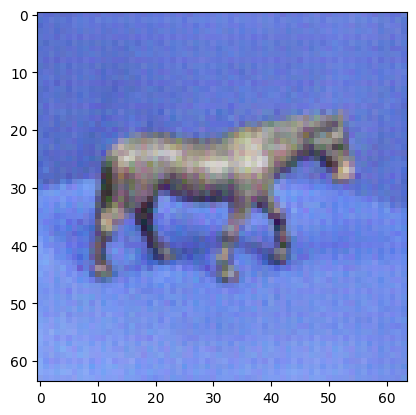

 Epoch 157 
 Completion: 39.250000 percent


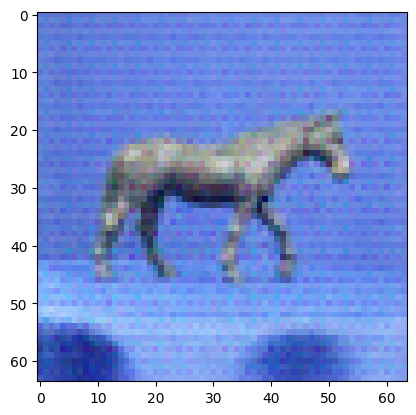

 Epoch 158 
 Completion: 39.500000 percent


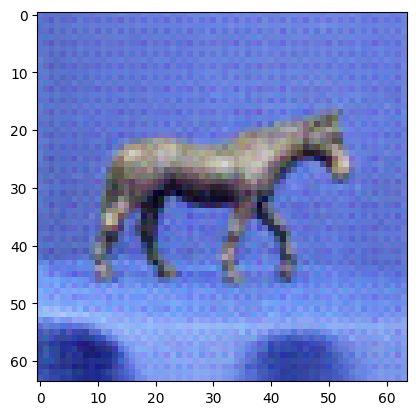

 Epoch 159 
 Completion: 39.750000 percent


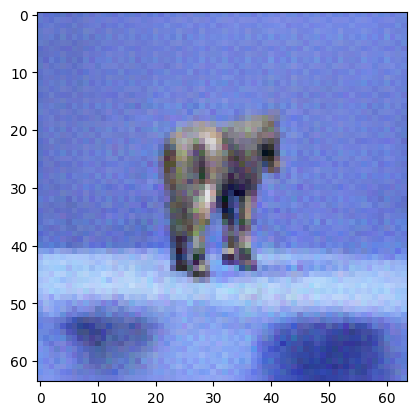

 Epoch 160 
 Completion: 40.000000 percent


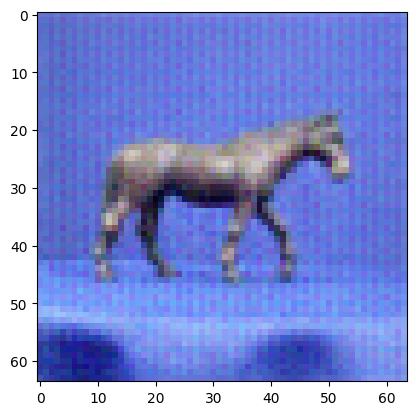

 Epoch 161 
 Completion: 40.250000 percent


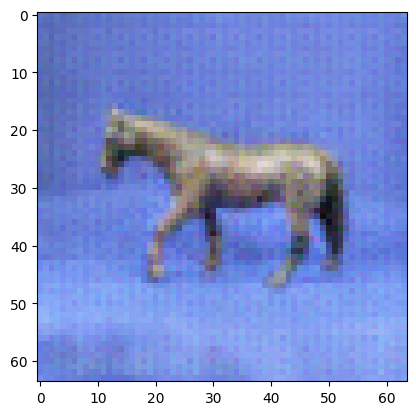

 Epoch 162 
 Completion: 40.500000 percent


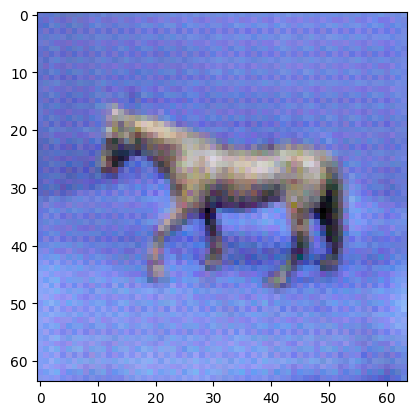

 Epoch 163 
 Completion: 40.750000 percent


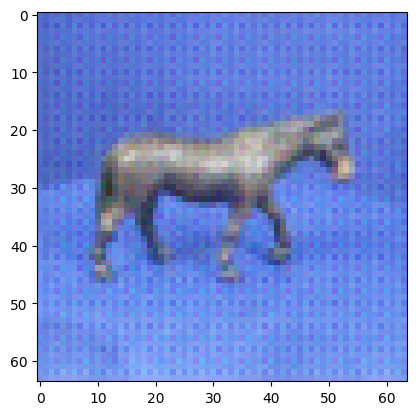

 Epoch 164 
 Completion: 41.000000 percent


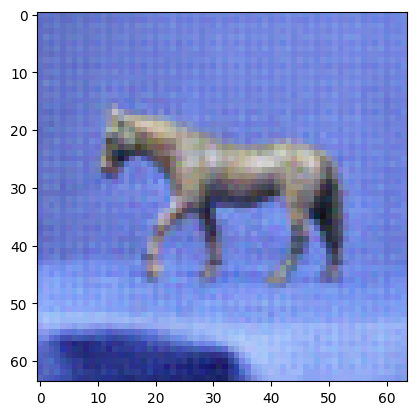

 Epoch 165 
 Completion: 41.250000 percent


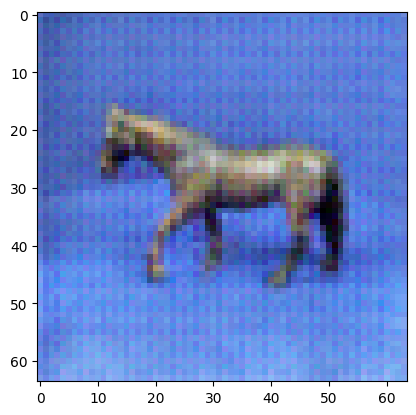

 Epoch 166 
 Completion: 41.500000 percent


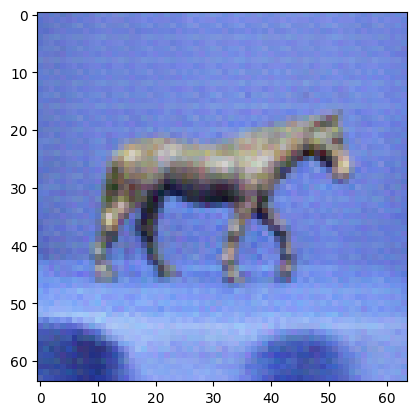

 Epoch 167 
 Completion: 41.750000 percent


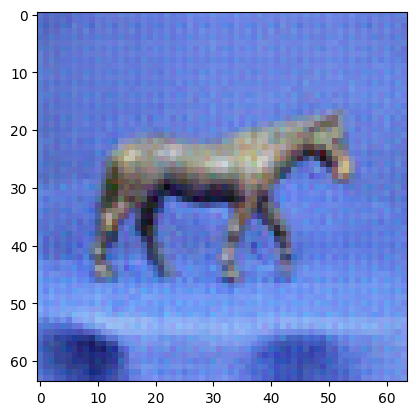

 Epoch 168 
 Completion: 42.000000 percent


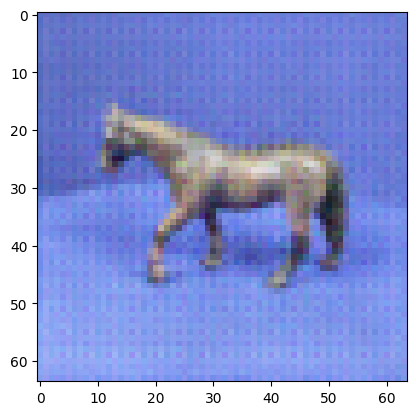

 Epoch 169 
 Completion: 42.250000 percent


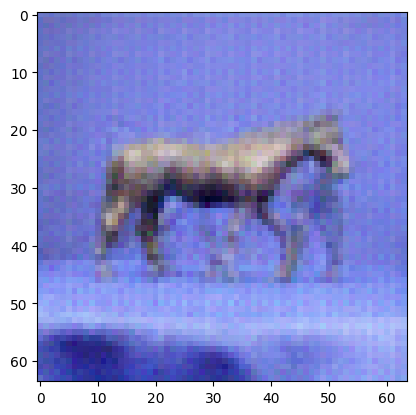

 Epoch 170 
 Completion: 42.500000 percent


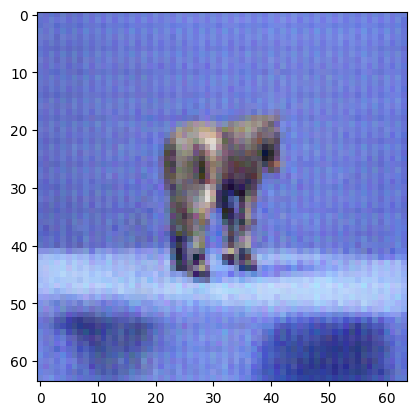

 Epoch 171 
 Completion: 42.750000 percent


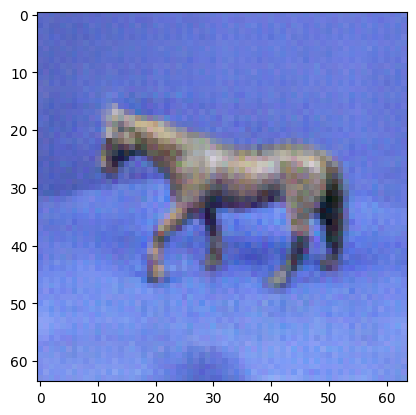

 Epoch 172 
 Completion: 43.000000 percent


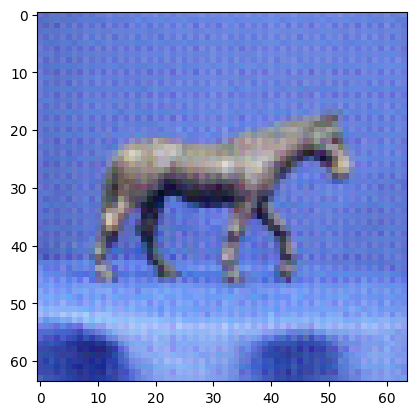

 Epoch 173 
 Completion: 43.250000 percent


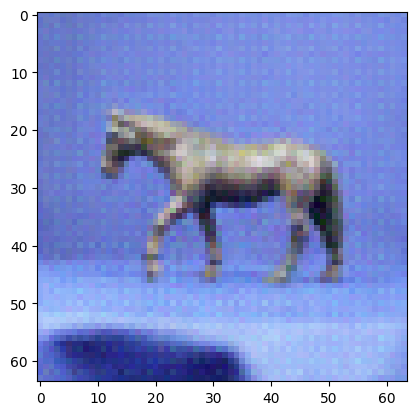

 Epoch 174 
 Completion: 43.500000 percent


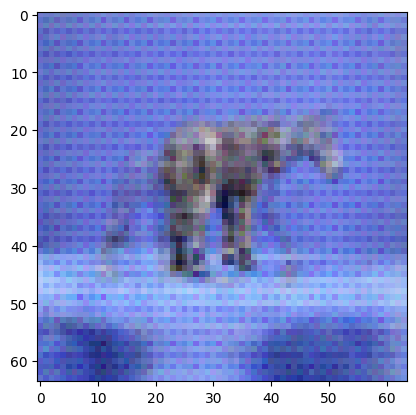

 Epoch 175 
 Completion: 43.750000 percent


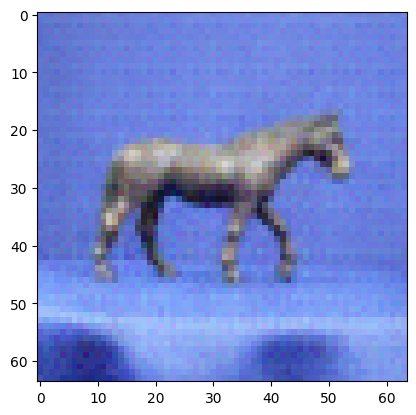

 Epoch 176 
 Completion: 44.000000 percent


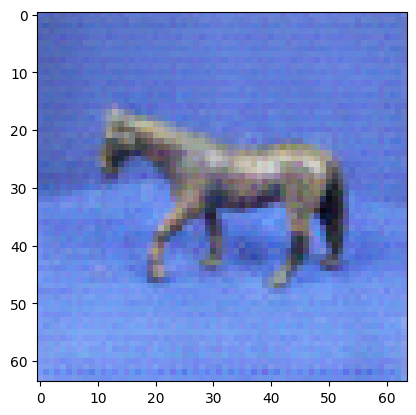

 Epoch 177 
 Completion: 44.250000 percent


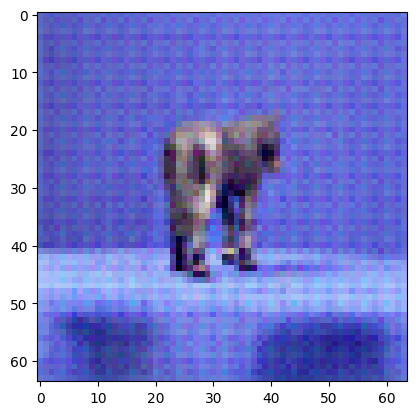

 Epoch 178 
 Completion: 44.500000 percent


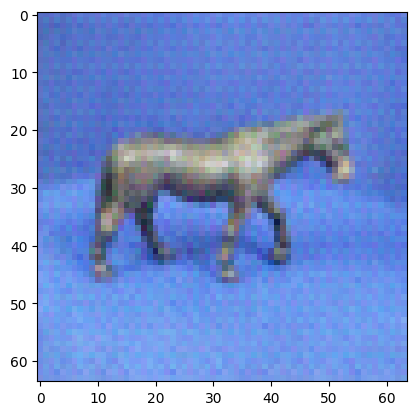

 Epoch 179 
 Completion: 44.750000 percent


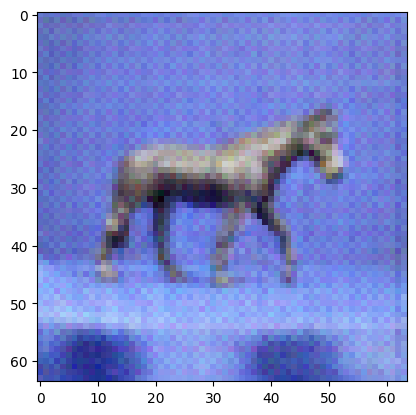

 Epoch 180 
 Completion: 45.000000 percent


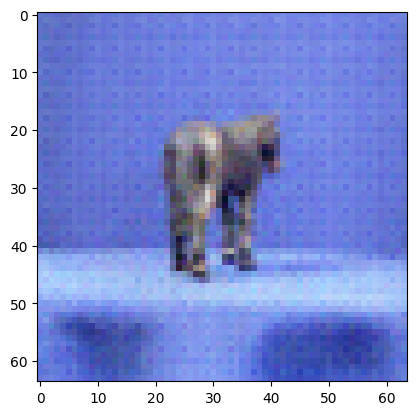

 Epoch 181 
 Completion: 45.250000 percent


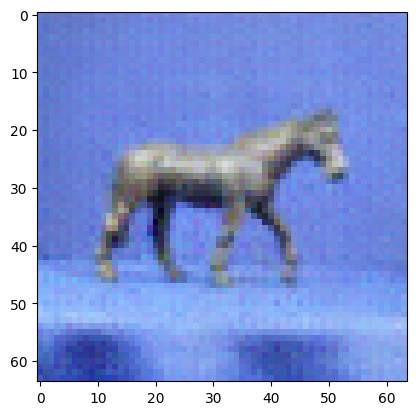

 Epoch 182 
 Completion: 45.500000 percent


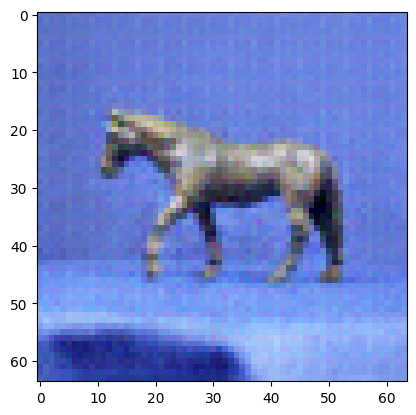

 Epoch 183 
 Completion: 45.750000 percent


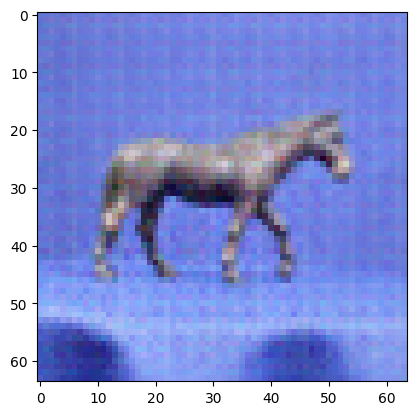

 Epoch 184 
 Completion: 46.000000 percent


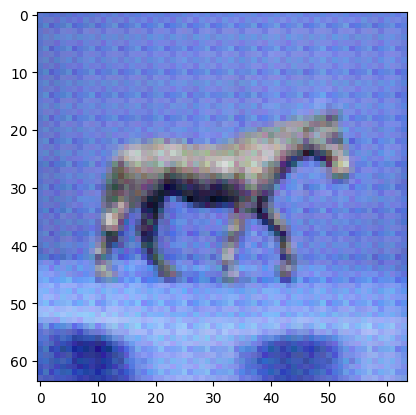

 Epoch 185 
 Completion: 46.250000 percent


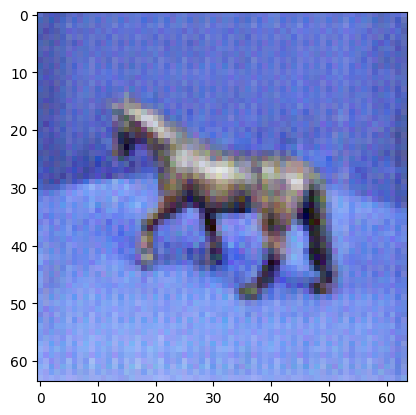

 Epoch 186 
 Completion: 46.500000 percent


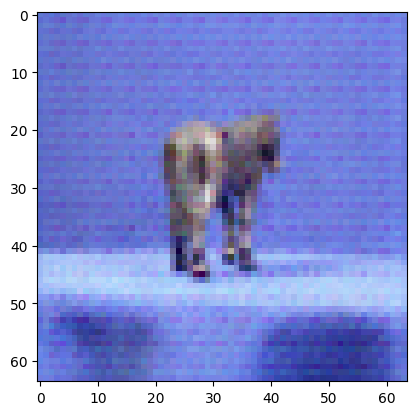

 Epoch 187 
 Completion: 46.750000 percent


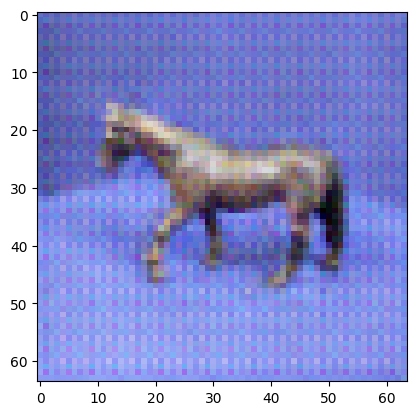

 Epoch 188 
 Completion: 47.000000 percent


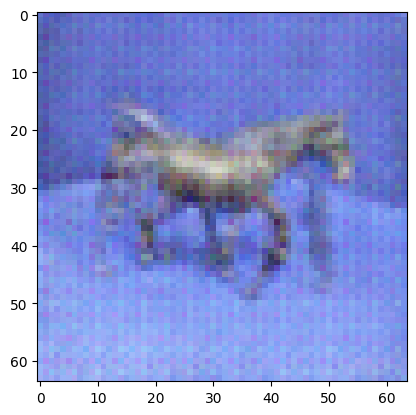

 Epoch 189 
 Completion: 47.250000 percent


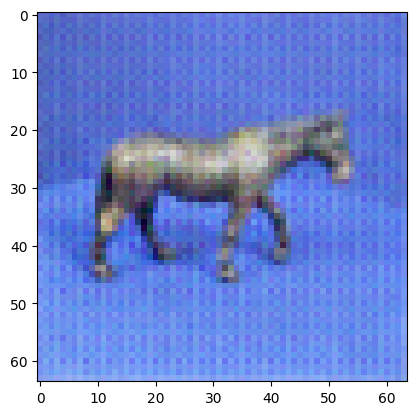

 Epoch 190 
 Completion: 47.500000 percent


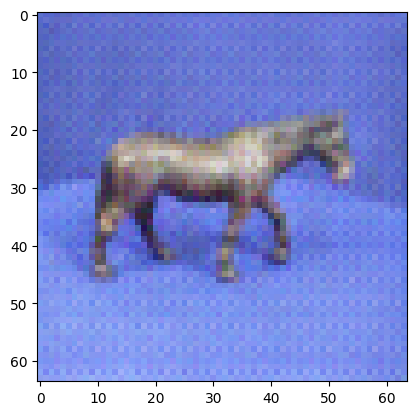

 Epoch 191 
 Completion: 47.750000 percent


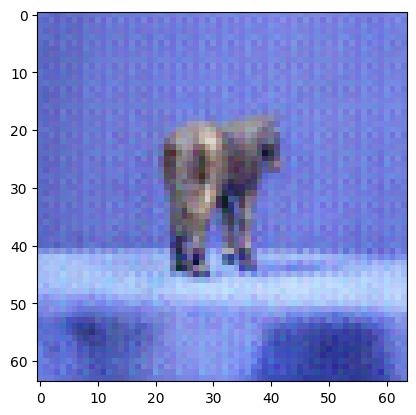

 Epoch 192 
 Completion: 48.000000 percent


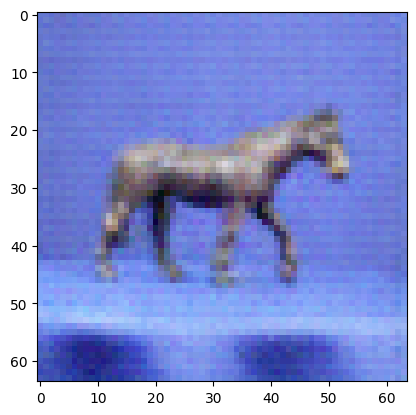

 Epoch 193 
 Completion: 48.250000 percent


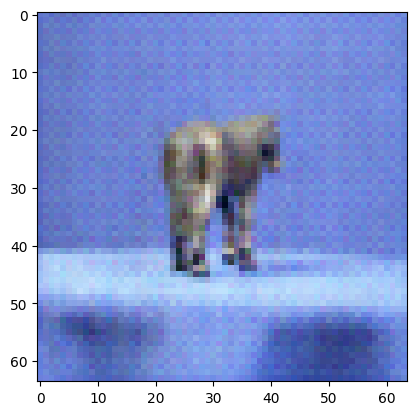

 Epoch 194 
 Completion: 48.500000 percent


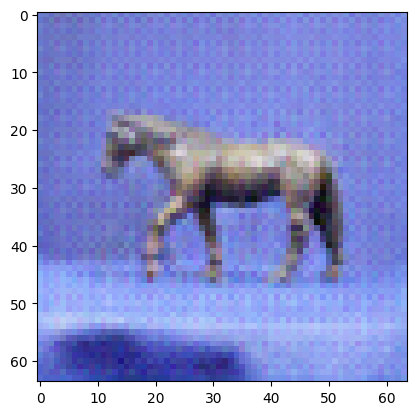

 Epoch 195 
 Completion: 48.750000 percent


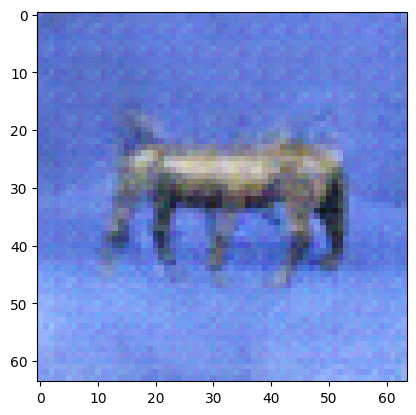

 Epoch 196 
 Completion: 49.000000 percent


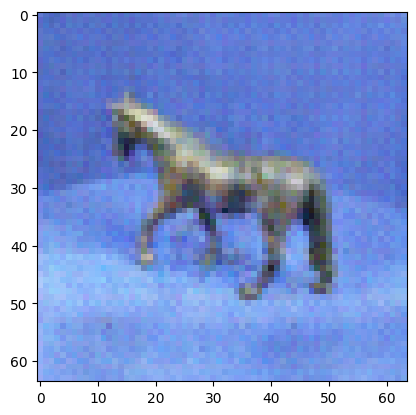

 Epoch 197 
 Completion: 49.250000 percent


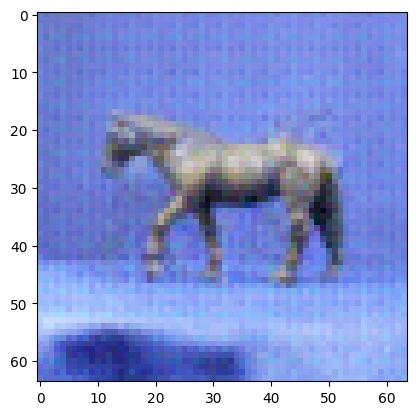

 Epoch 198 
 Completion: 49.500000 percent


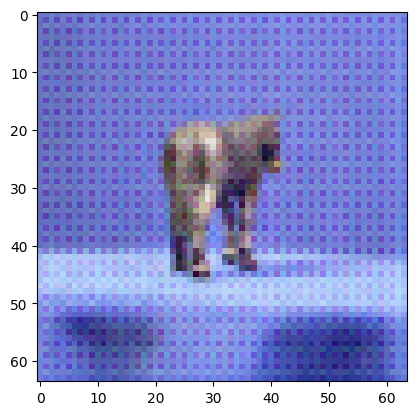

 Epoch 199 
 Completion: 49.750000 percent


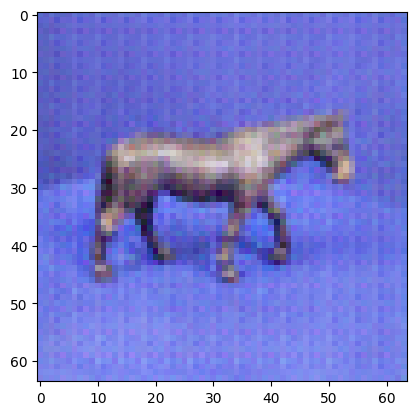

 Epoch 200 
 Completion: 50.000000 percent


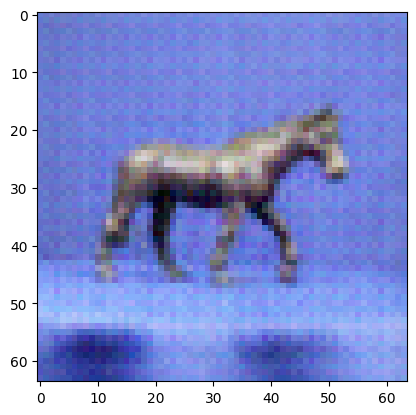

 Epoch 201 
 Completion: 50.250000 percent


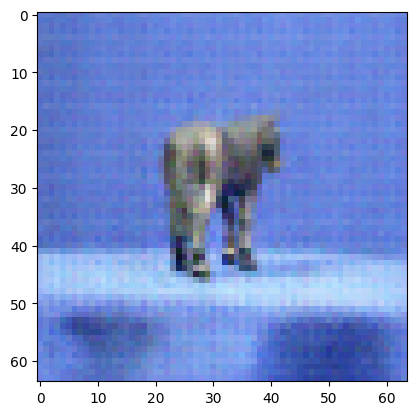

 Epoch 202 
 Completion: 50.500000 percent


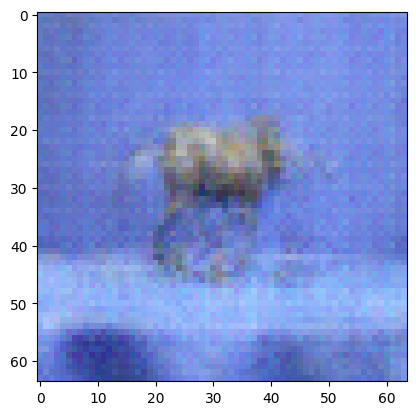

 Epoch 203 
 Completion: 50.750000 percent


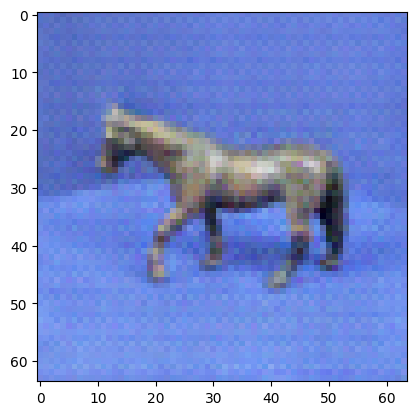

 Epoch 204 
 Completion: 51.000000 percent


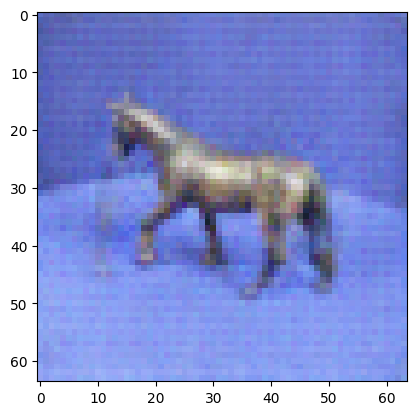

 Epoch 205 
 Completion: 51.250000 percent


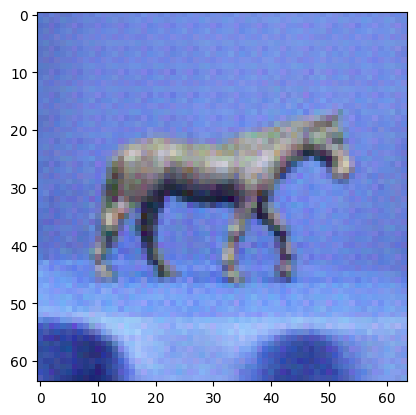

 Epoch 206 
 Completion: 51.500000 percent


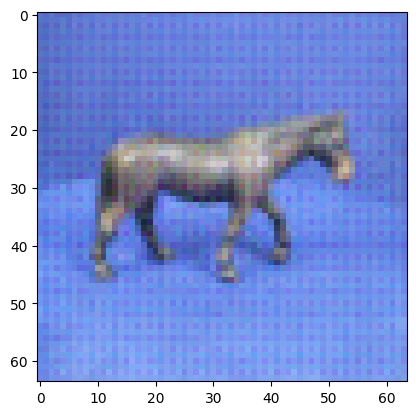

 Epoch 207 
 Completion: 51.750000 percent


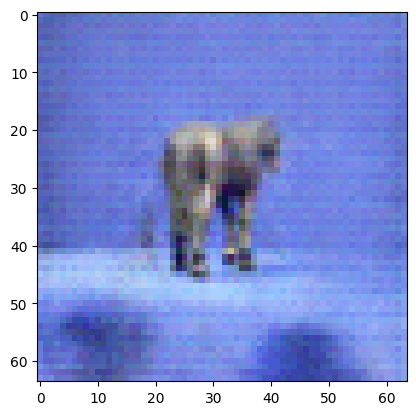

 Epoch 208 
 Completion: 52.000000 percent


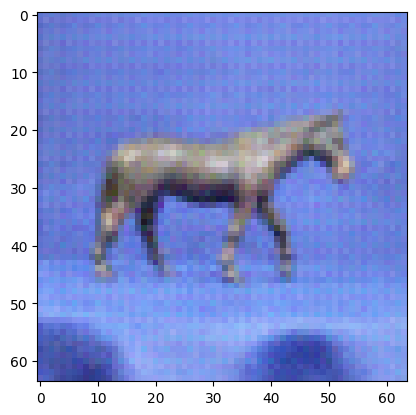

 Epoch 209 
 Completion: 52.250000 percent


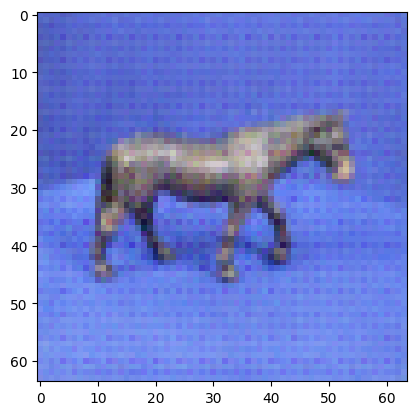

 Epoch 210 
 Completion: 52.500000 percent


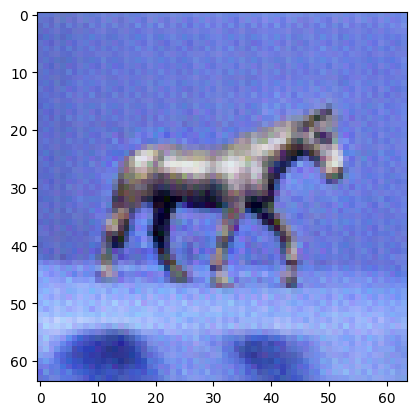

 Epoch 211 
 Completion: 52.750000 percent


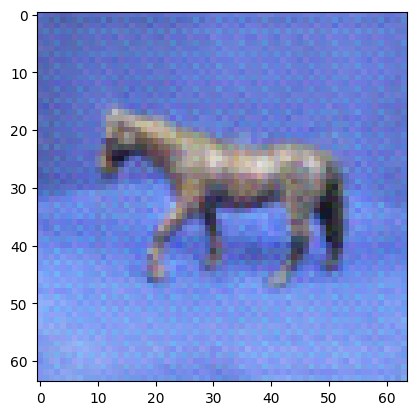

 Epoch 212 
 Completion: 53.000000 percent


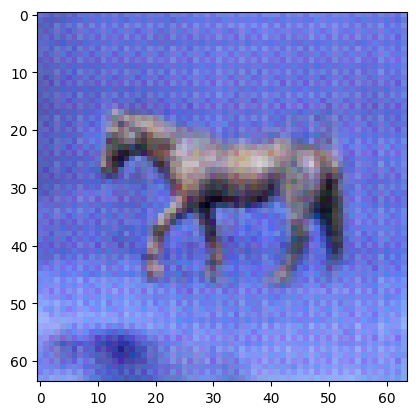

 Epoch 213 
 Completion: 53.250000 percent


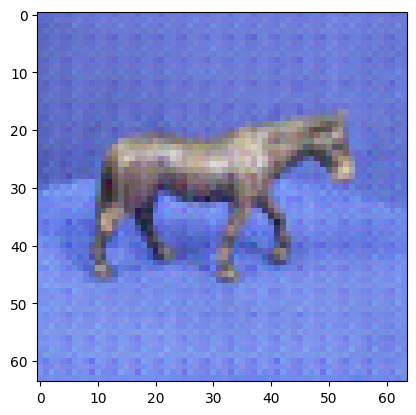

 Epoch 214 
 Completion: 53.500000 percent


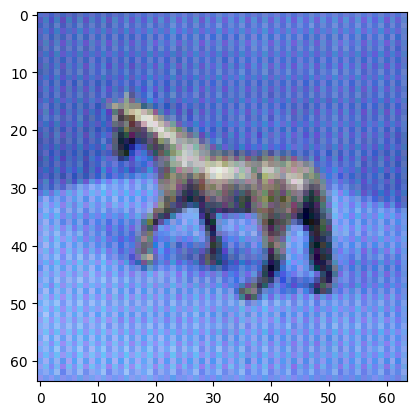

 Epoch 215 
 Completion: 53.750000 percent


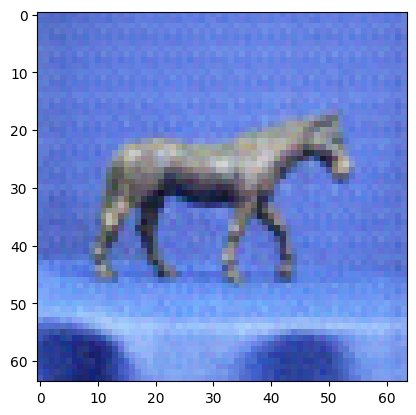

 Epoch 216 
 Completion: 54.000000 percent


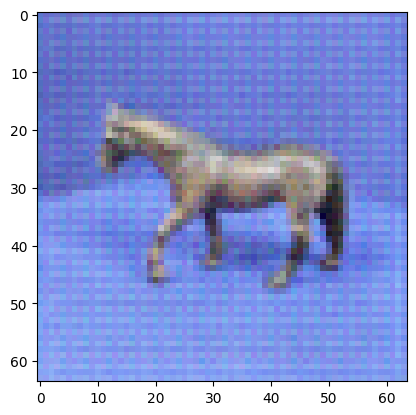

 Epoch 217 
 Completion: 54.250000 percent


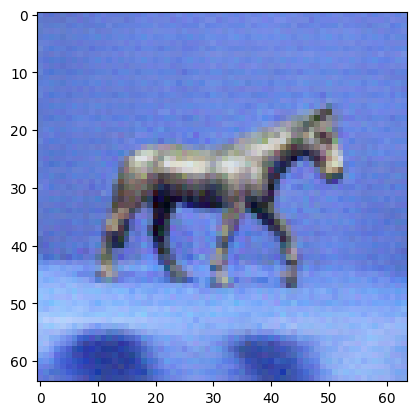

 Epoch 218 
 Completion: 54.500000 percent


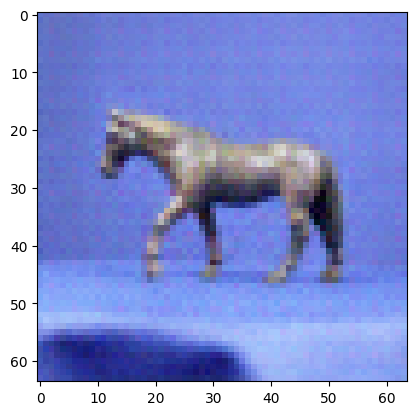

 Epoch 219 
 Completion: 54.750000 percent


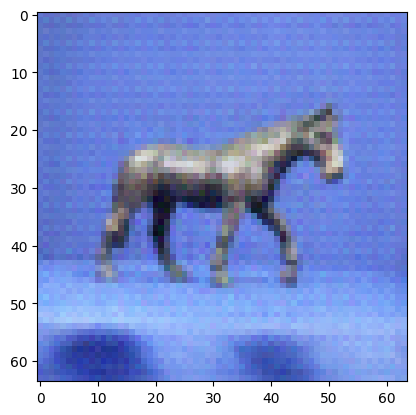

 Epoch 220 
 Completion: 55.000000 percent


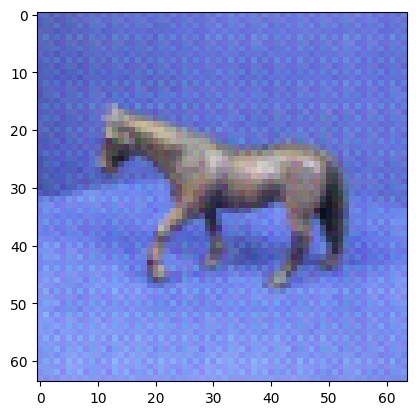

 Epoch 221 
 Completion: 55.250000 percent


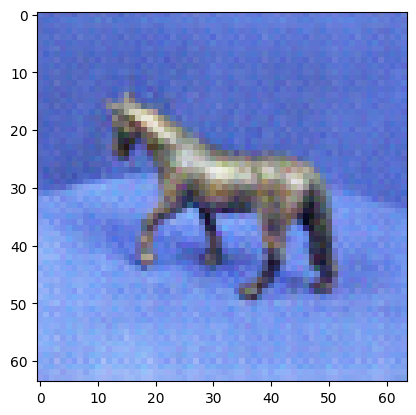

 Epoch 222 
 Completion: 55.500000 percent


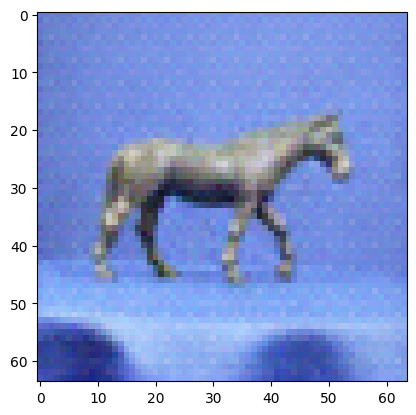

 Epoch 223 
 Completion: 55.750000 percent


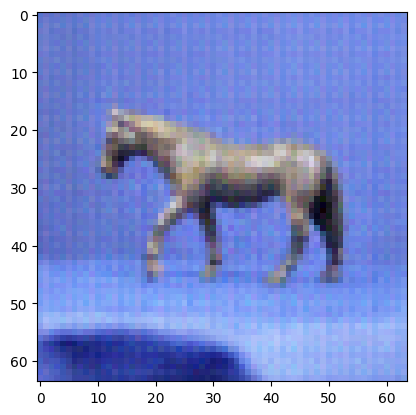

 Epoch 224 
 Completion: 56.000000 percent


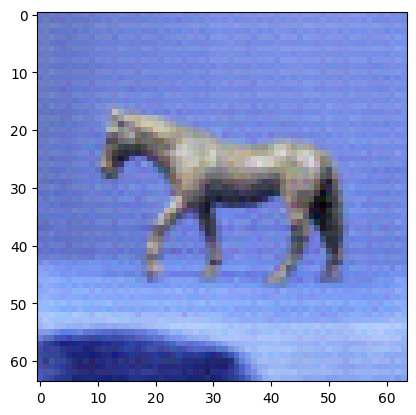

 Epoch 225 
 Completion: 56.250000 percent


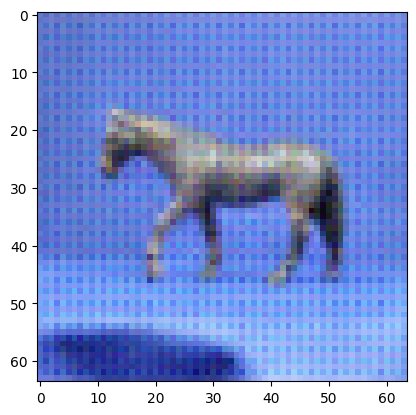

 Epoch 226 
 Completion: 56.500000 percent


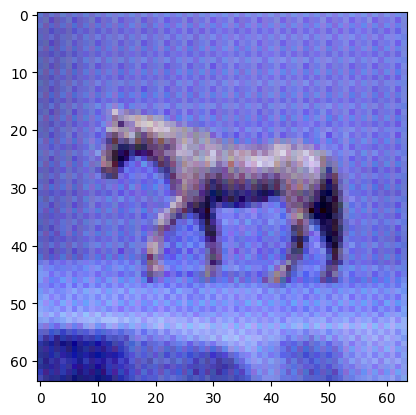

 Epoch 227 
 Completion: 56.750000 percent


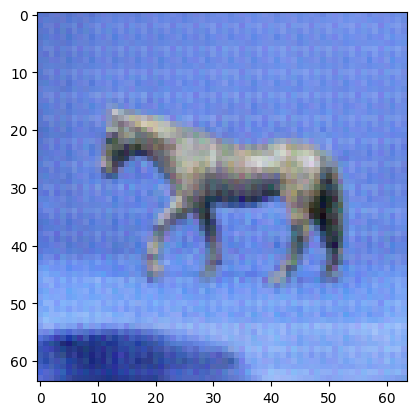

 Epoch 228 
 Completion: 57.000000 percent


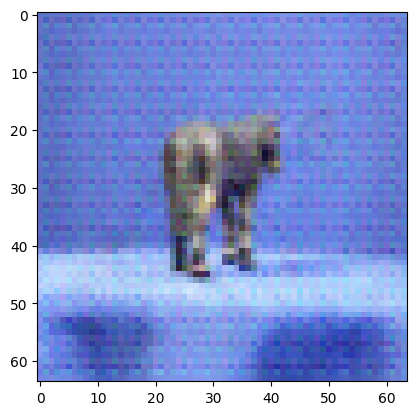

 Epoch 229 
 Completion: 57.250000 percent


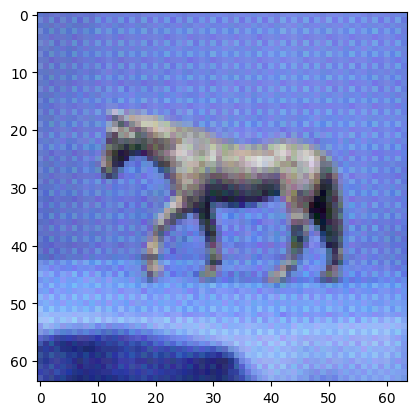

 Epoch 230 
 Completion: 57.500000 percent


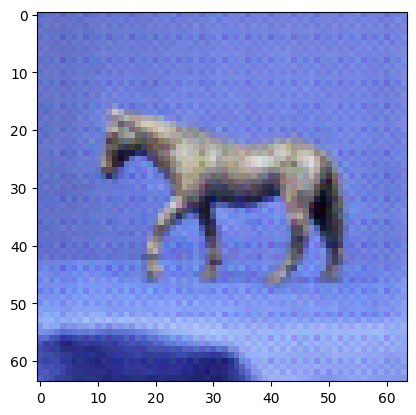

 Epoch 231 
 Completion: 57.750000 percent


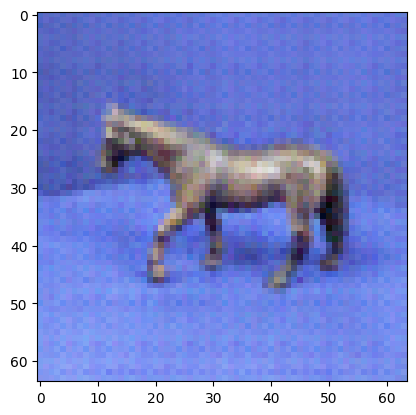

 Epoch 232 
 Completion: 58.000000 percent


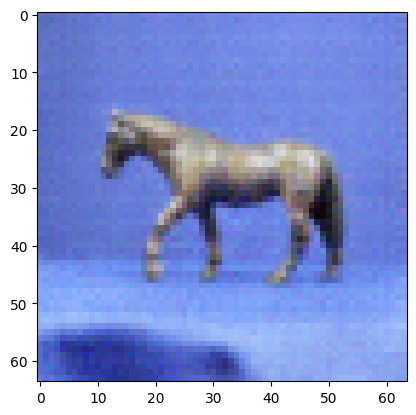

 Epoch 233 
 Completion: 58.250000 percent


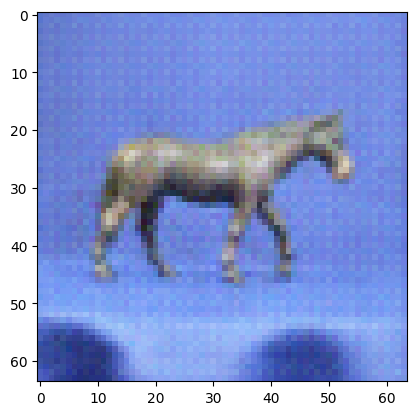

 Epoch 234 
 Completion: 58.500000 percent


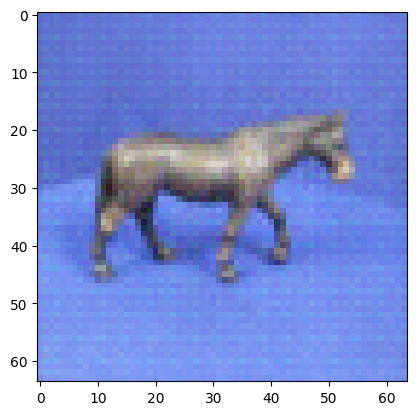

 Epoch 235 
 Completion: 58.750000 percent


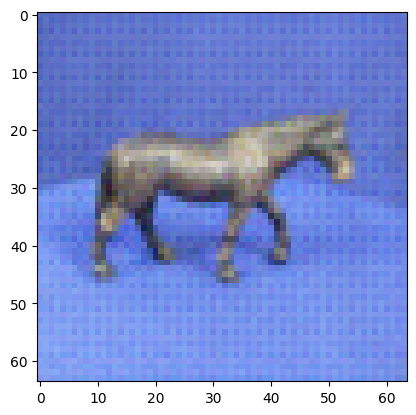

 Epoch 236 
 Completion: 59.000000 percent


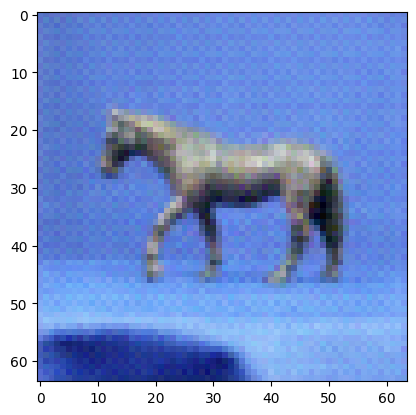

 Epoch 237 
 Completion: 59.250000 percent


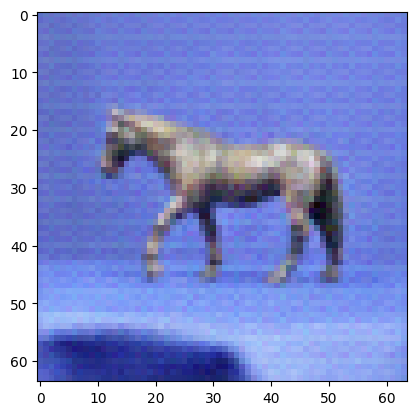

 Epoch 238 
 Completion: 59.500000 percent


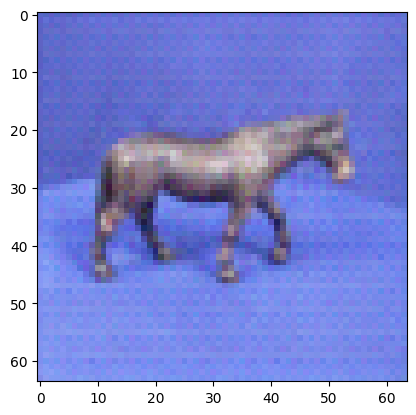

 Epoch 239 
 Completion: 59.750000 percent


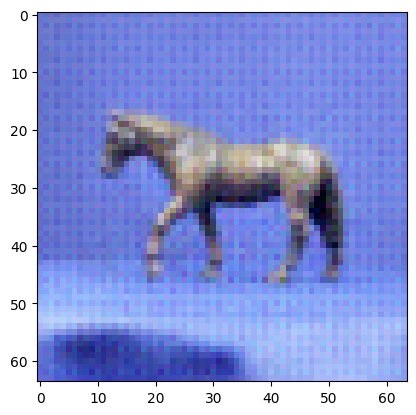

 Epoch 240 
 Completion: 60.000000 percent


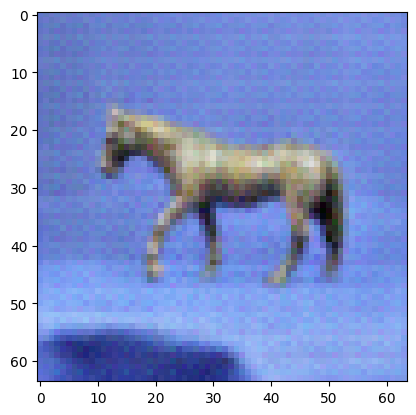

 Epoch 241 
 Completion: 60.250000 percent


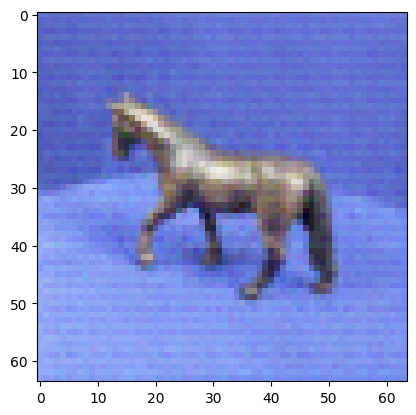

 Epoch 242 
 Completion: 60.500000 percent


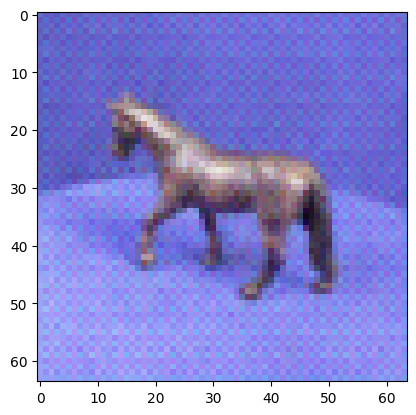

 Epoch 243 
 Completion: 60.750000 percent


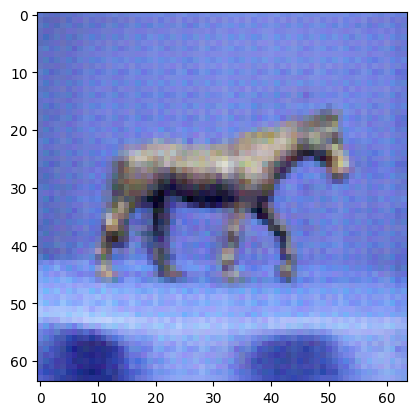

 Epoch 244 
 Completion: 61.000000 percent


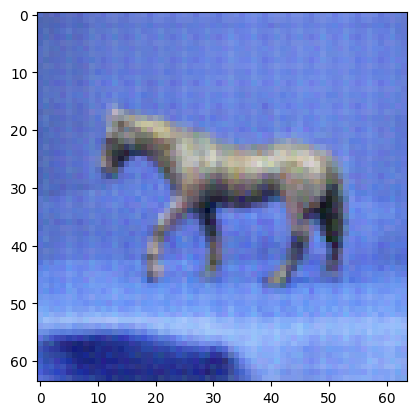

 Epoch 245 
 Completion: 61.250000 percent


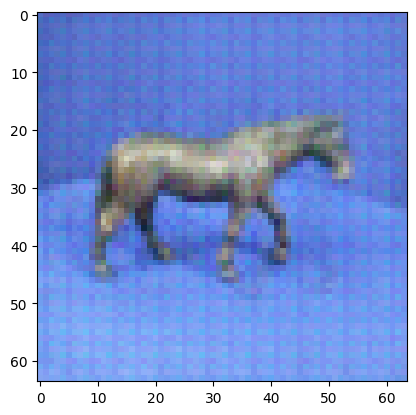

 Epoch 246 
 Completion: 61.500000 percent


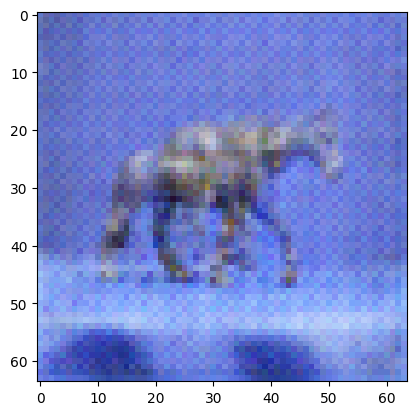

 Epoch 247 
 Completion: 61.750000 percent


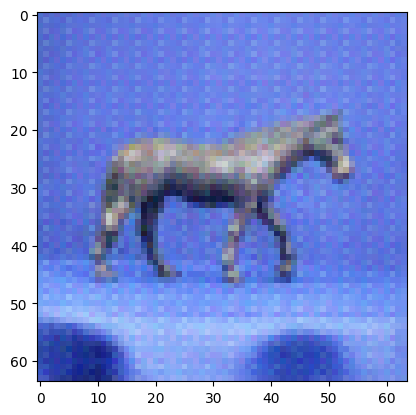

 Epoch 248 
 Completion: 62.000000 percent


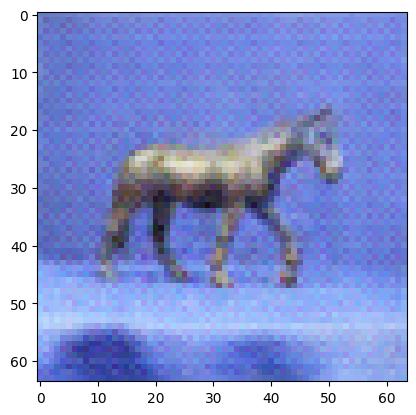

 Epoch 249 
 Completion: 62.250000 percent


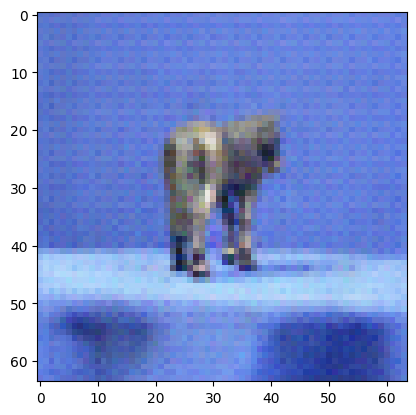

 Epoch 250 
 Completion: 62.500000 percent


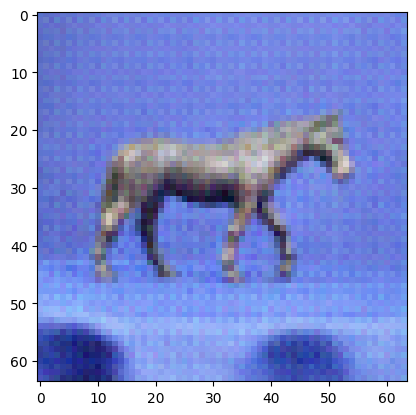

 Epoch 251 
 Completion: 62.750000 percent


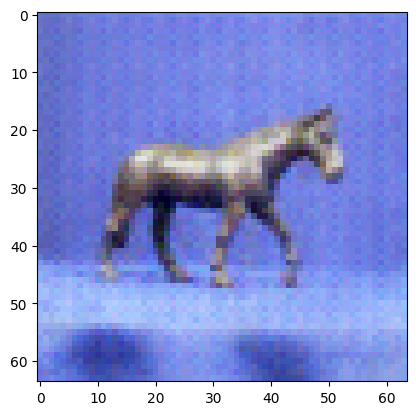

 Epoch 252 
 Completion: 63.000000 percent


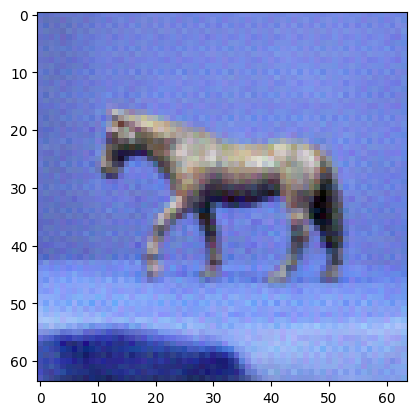

 Epoch 253 
 Completion: 63.250000 percent


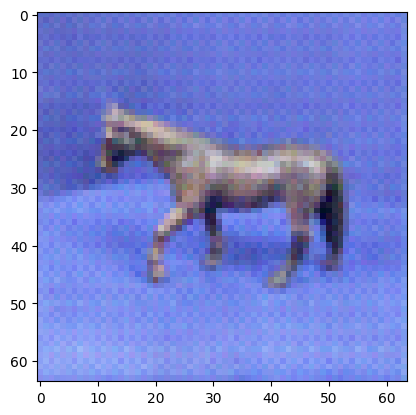

 Epoch 254 
 Completion: 63.500000 percent


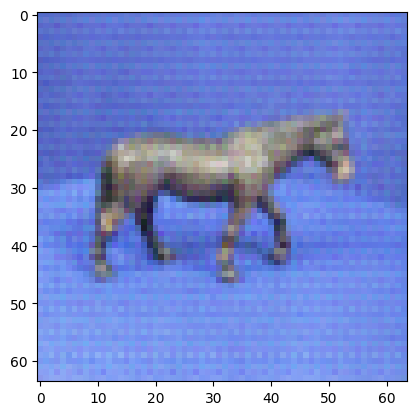

 Epoch 255 
 Completion: 63.750000 percent


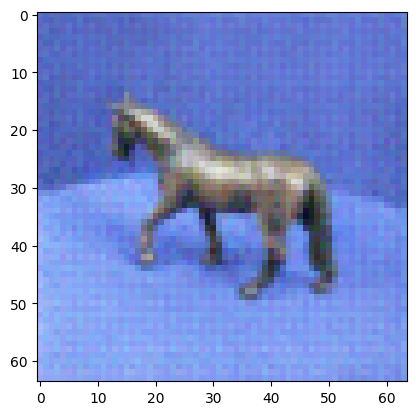

 Epoch 256 
 Completion: 64.000000 percent


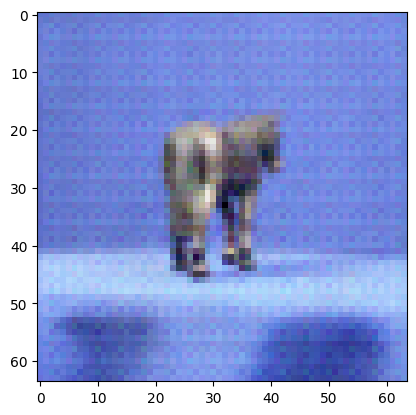

 Epoch 257 
 Completion: 64.250000 percent


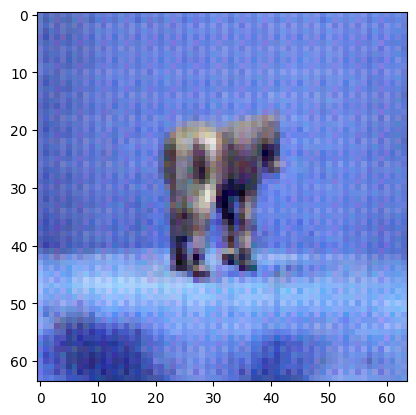

 Epoch 258 
 Completion: 64.500000 percent


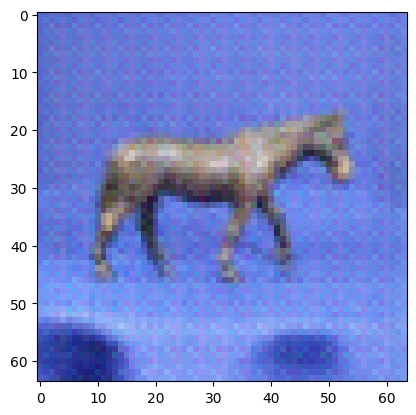

 Epoch 259 
 Completion: 64.750000 percent


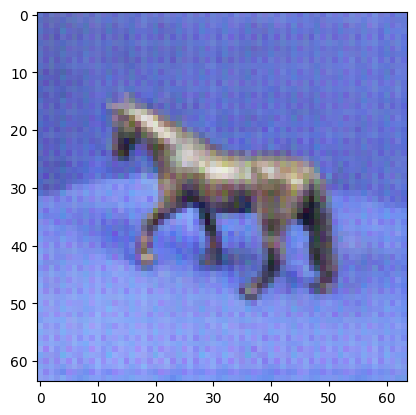

 Epoch 260 
 Completion: 65.000000 percent


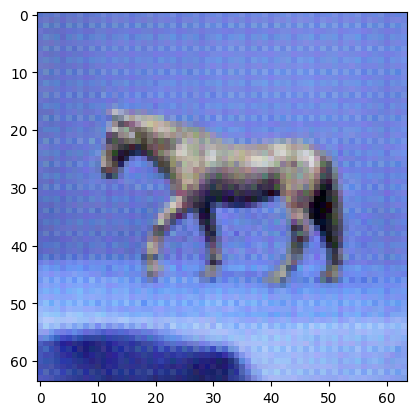

 Epoch 261 
 Completion: 65.250000 percent


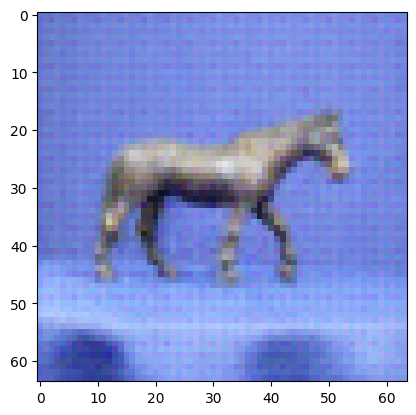

 Epoch 262 
 Completion: 65.500000 percent


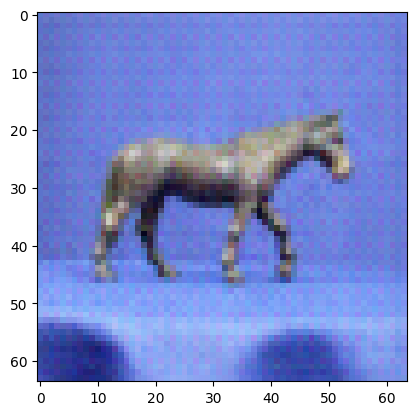

 Epoch 263 
 Completion: 65.750000 percent


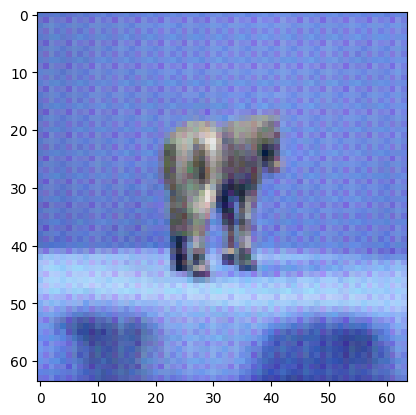

 Epoch 264 
 Completion: 66.000000 percent


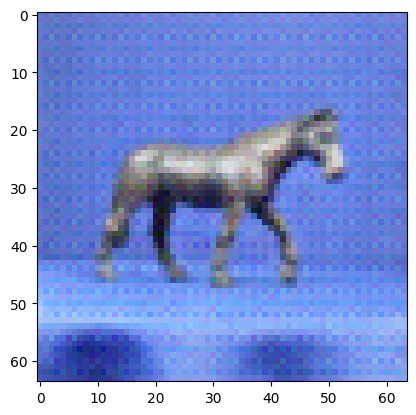

 Epoch 265 
 Completion: 66.250000 percent


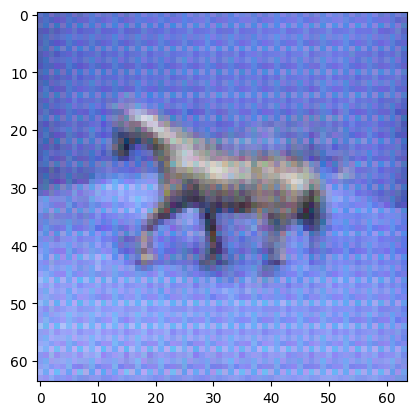

 Epoch 266 
 Completion: 66.500000 percent


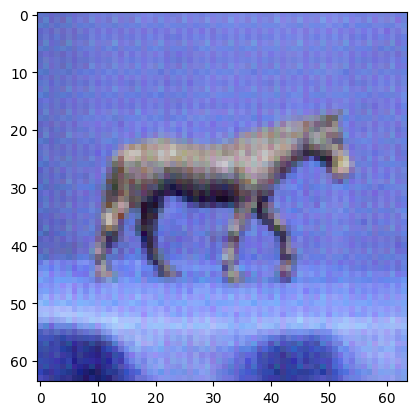

 Epoch 267 
 Completion: 66.750000 percent


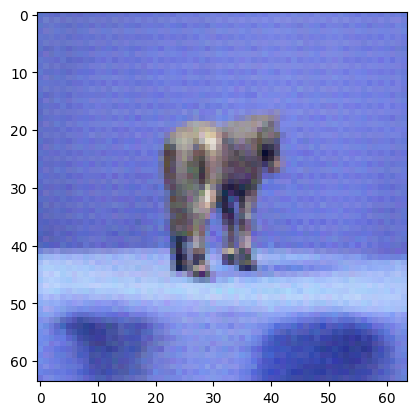

 Epoch 268 
 Completion: 67.000000 percent


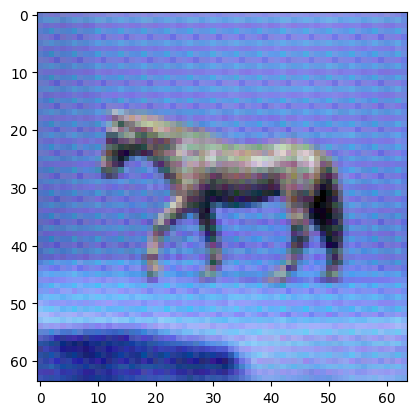

 Epoch 269 
 Completion: 67.250000 percent


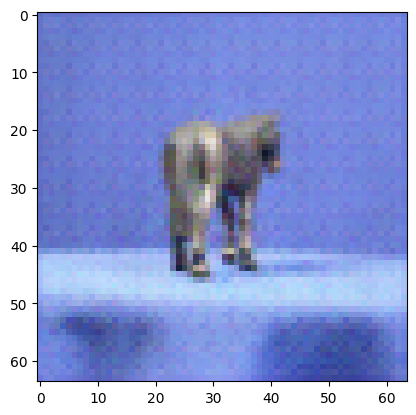

 Epoch 270 
 Completion: 67.500000 percent


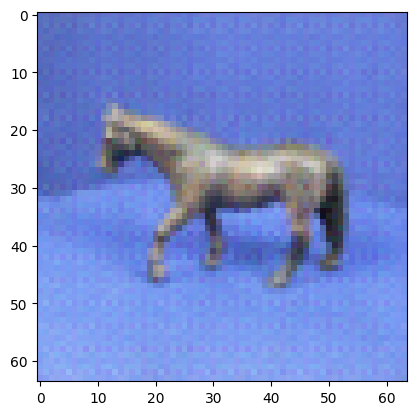

 Epoch 271 
 Completion: 67.750000 percent


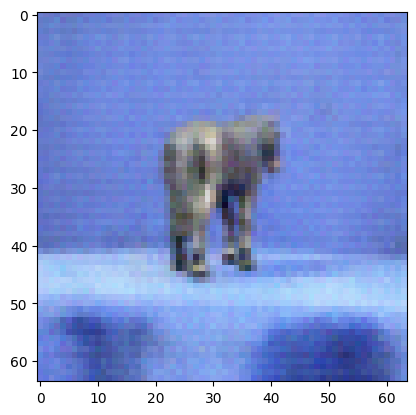

 Epoch 272 
 Completion: 68.000000 percent


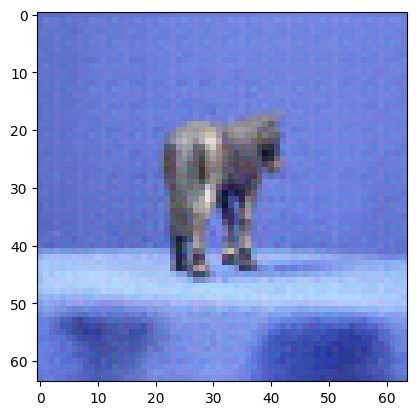

 Epoch 273 
 Completion: 68.250000 percent


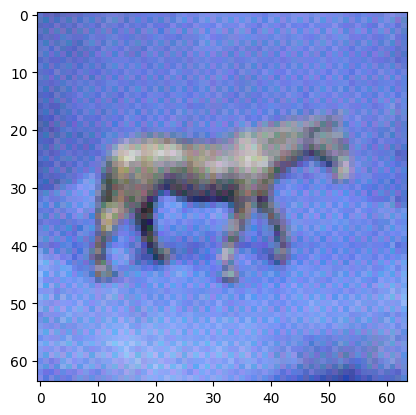

 Epoch 274 
 Completion: 68.500000 percent


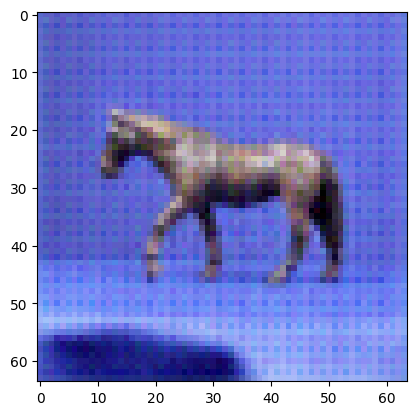

 Epoch 275 
 Completion: 68.750000 percent


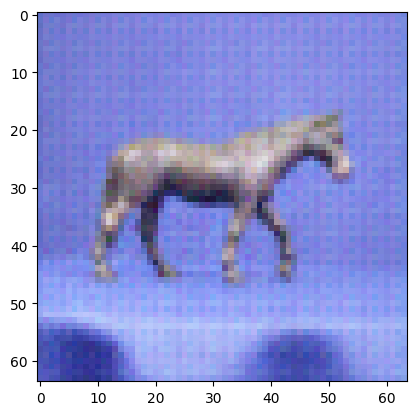

 Epoch 276 
 Completion: 69.000000 percent


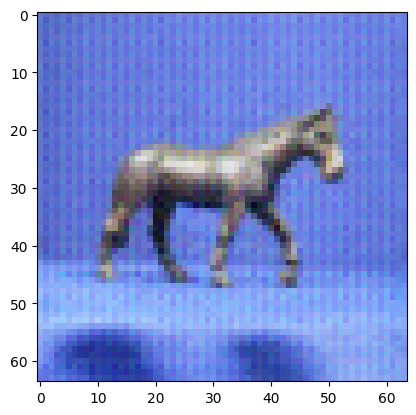

 Epoch 277 
 Completion: 69.250000 percent


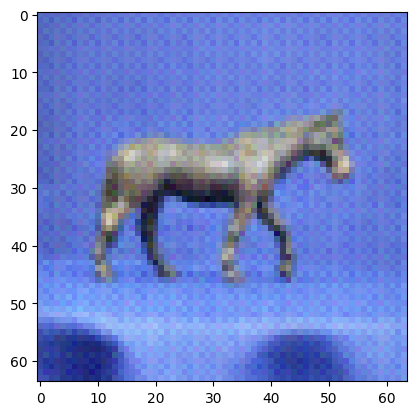

 Epoch 278 
 Completion: 69.500000 percent


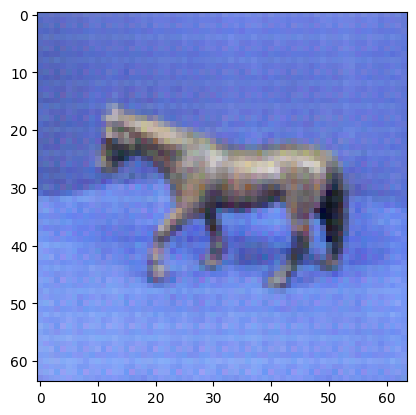

 Epoch 279 
 Completion: 69.750000 percent


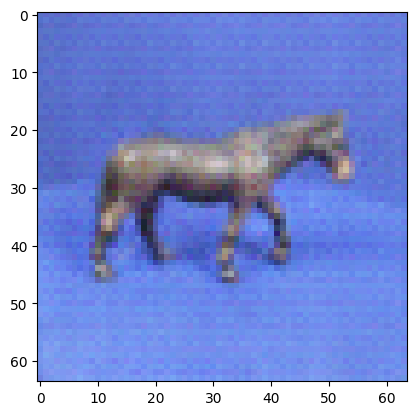

 Epoch 280 
 Completion: 70.000000 percent


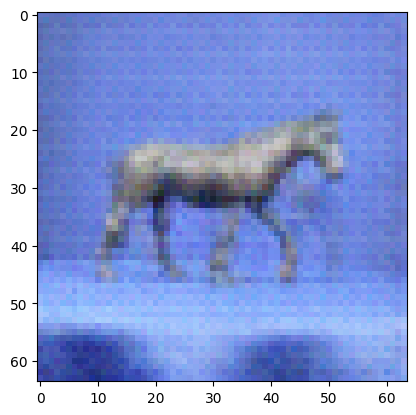

 Epoch 281 
 Completion: 70.250000 percent


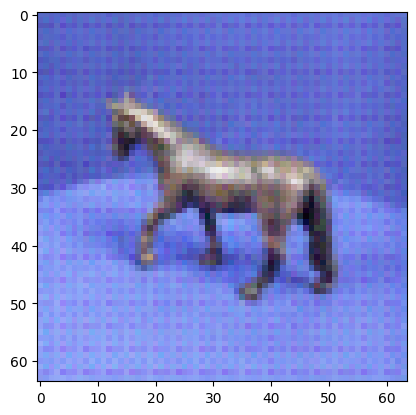

 Epoch 282 
 Completion: 70.500000 percent


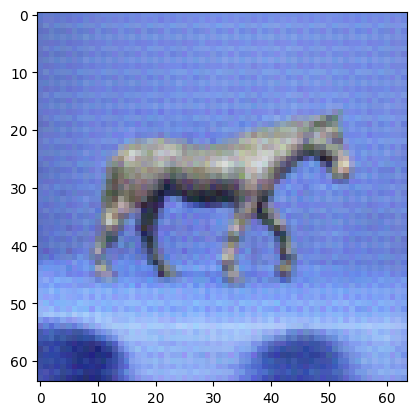

 Epoch 283 
 Completion: 70.750000 percent


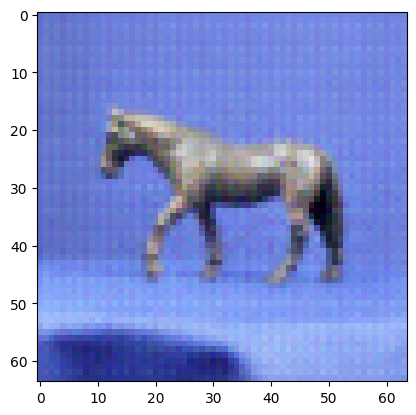

 Epoch 284 
 Completion: 71.000000 percent


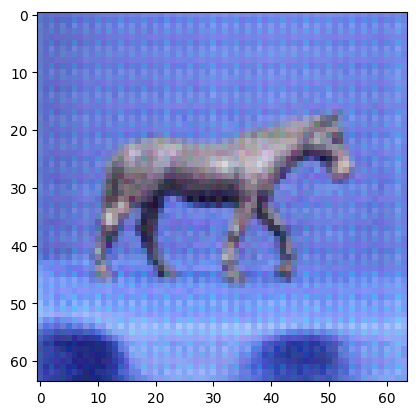

 Epoch 285 
 Completion: 71.250000 percent


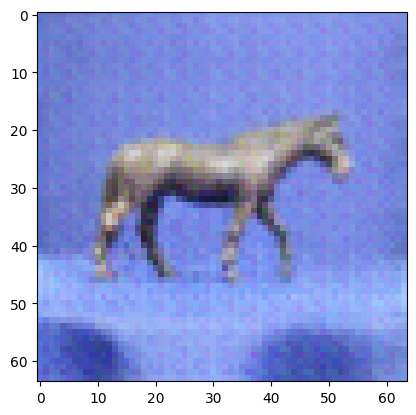

 Epoch 286 
 Completion: 71.500000 percent


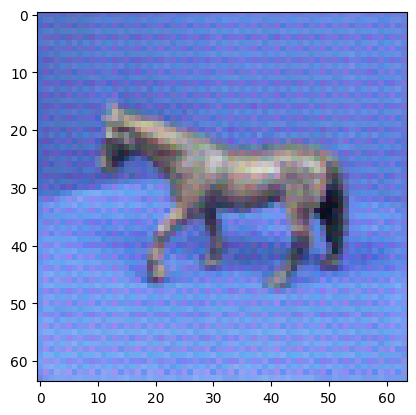

 Epoch 287 
 Completion: 71.750000 percent


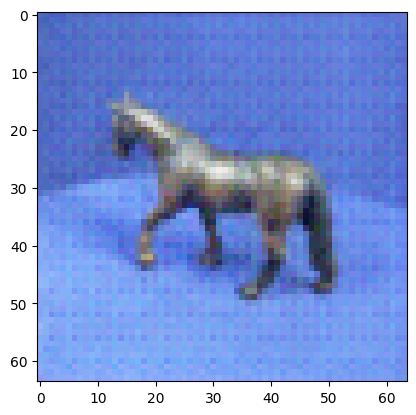

 Epoch 288 
 Completion: 72.000000 percent


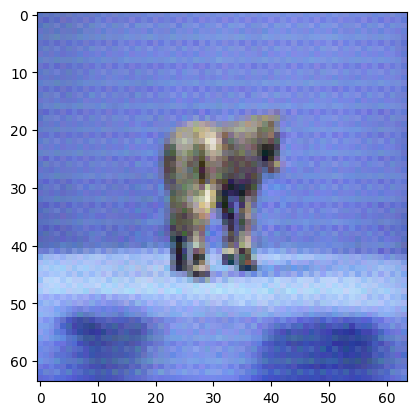

 Epoch 289 
 Completion: 72.250000 percent


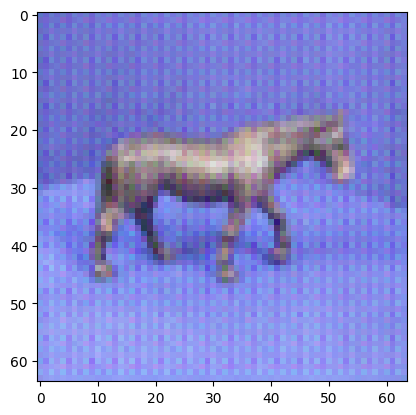

 Epoch 290 
 Completion: 72.500000 percent


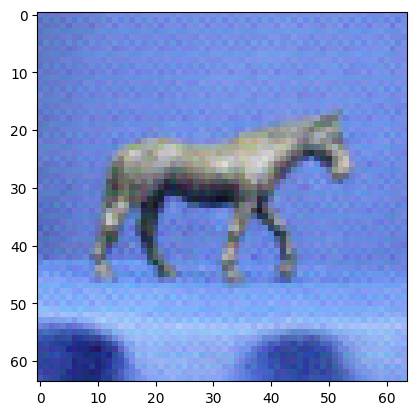

 Epoch 291 
 Completion: 72.750000 percent


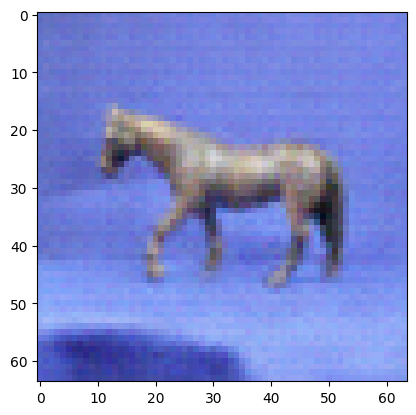

 Epoch 292 
 Completion: 73.000000 percent


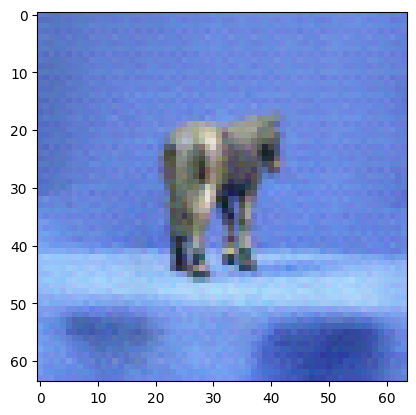

 Epoch 293 
 Completion: 73.250000 percent


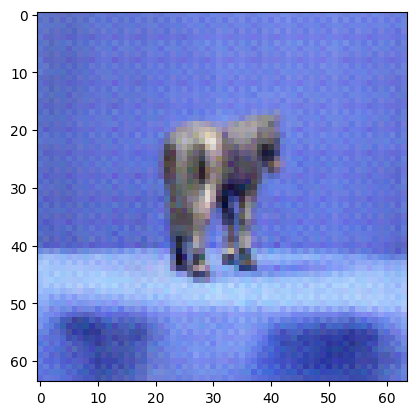

 Epoch 294 
 Completion: 73.500000 percent


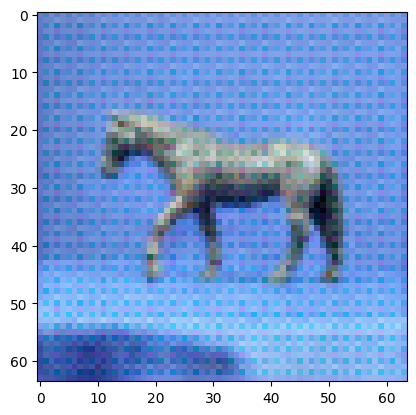

 Epoch 295 
 Completion: 73.750000 percent


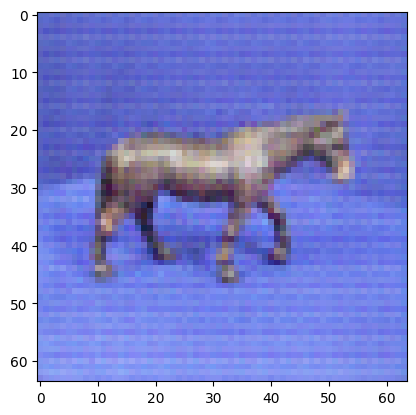

 Epoch 296 
 Completion: 74.000000 percent


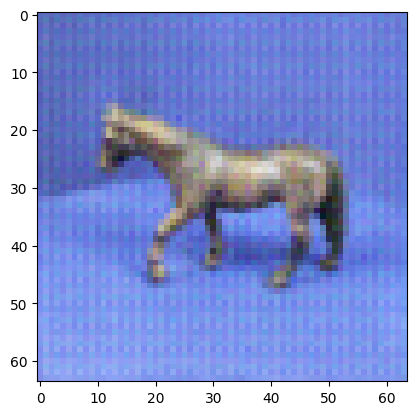

 Epoch 297 
 Completion: 74.250000 percent


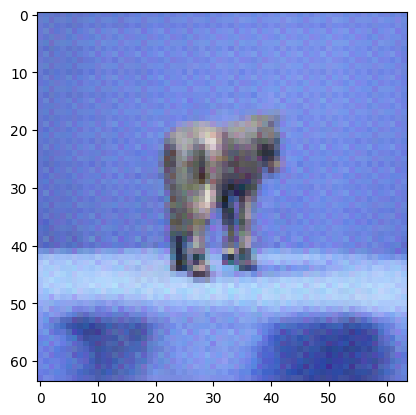

 Epoch 298 
 Completion: 74.500000 percent


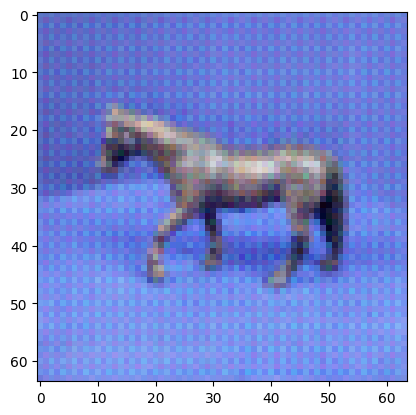

 Epoch 299 
 Completion: 74.750000 percent


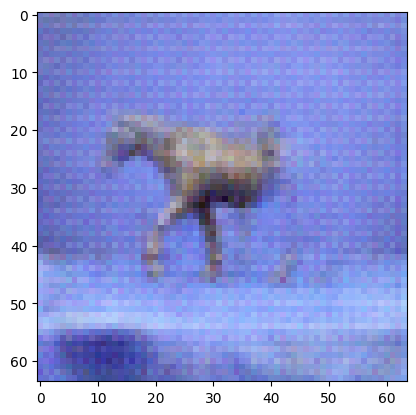

 Epoch 300 
 Completion: 75.000000 percent


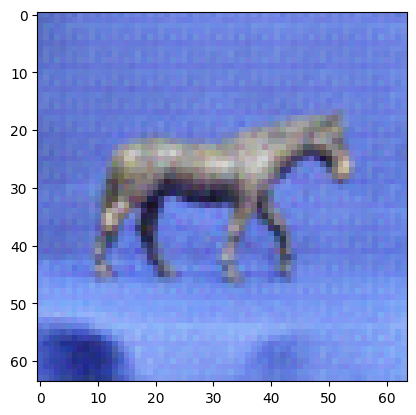

 Epoch 301 
 Completion: 75.250000 percent


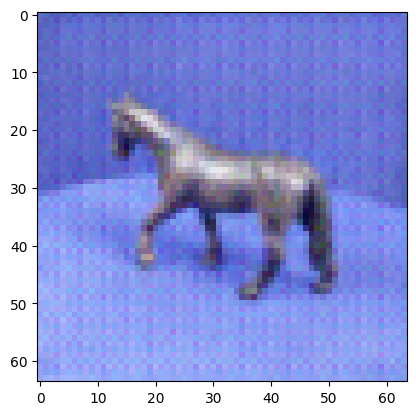

 Epoch 302 
 Completion: 75.500000 percent


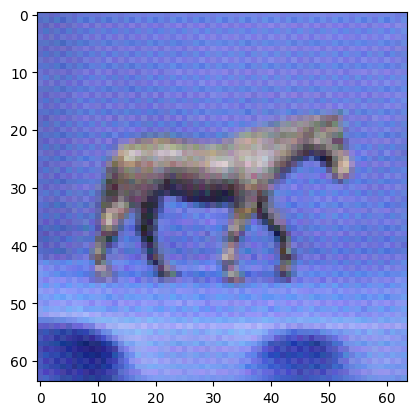

 Epoch 303 
 Completion: 75.750000 percent


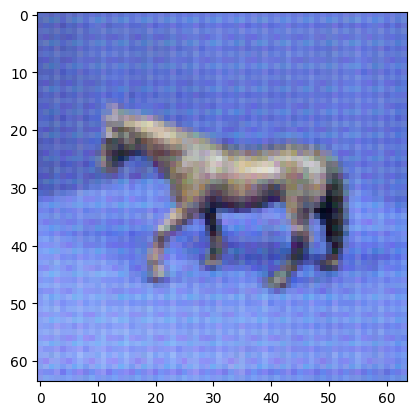

 Epoch 304 
 Completion: 76.000000 percent


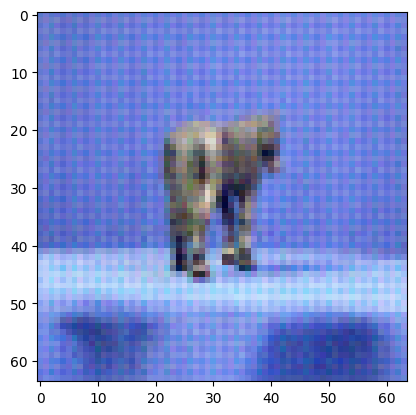

 Epoch 305 
 Completion: 76.250000 percent


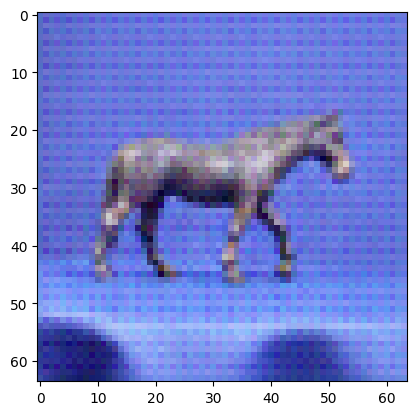

 Epoch 306 
 Completion: 76.500000 percent


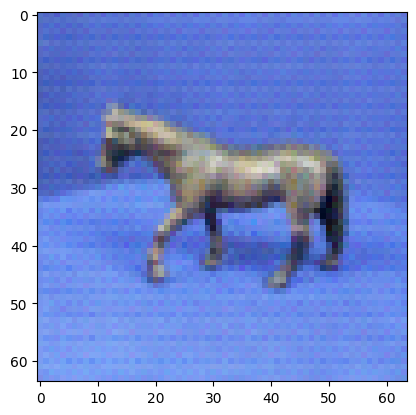

 Epoch 307 
 Completion: 76.750000 percent


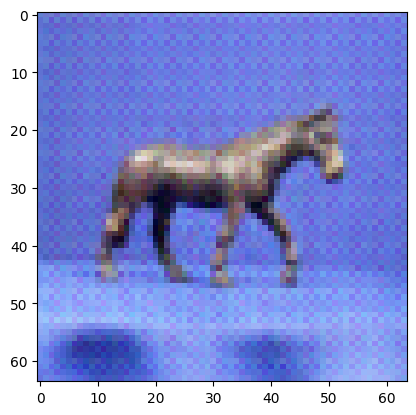

 Epoch 308 
 Completion: 77.000000 percent


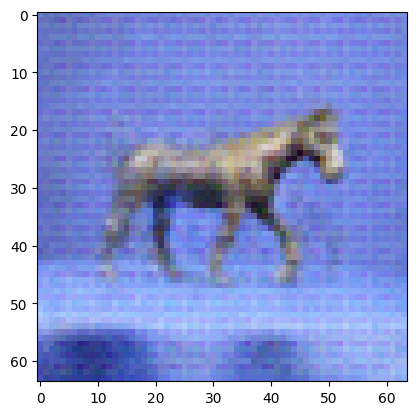

 Epoch 309 
 Completion: 77.250000 percent


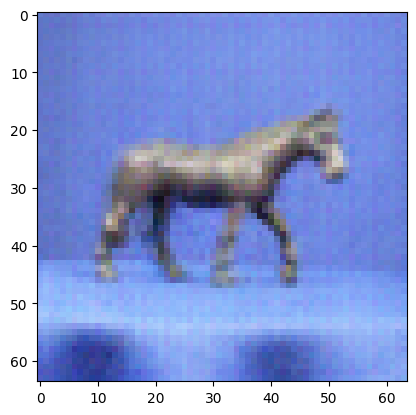

 Epoch 310 
 Completion: 77.500000 percent


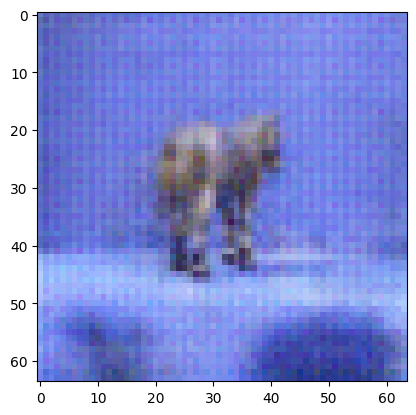

 Epoch 311 
 Completion: 77.750000 percent


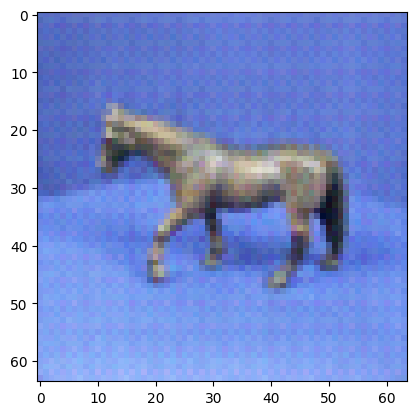

 Epoch 312 
 Completion: 78.000000 percent


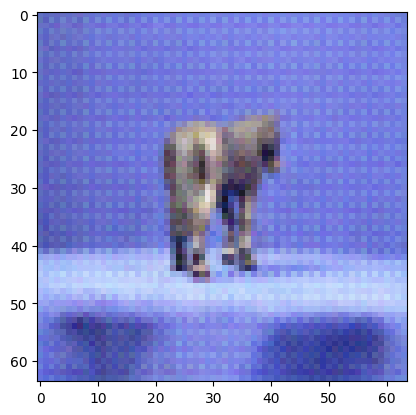

 Epoch 313 
 Completion: 78.250000 percent


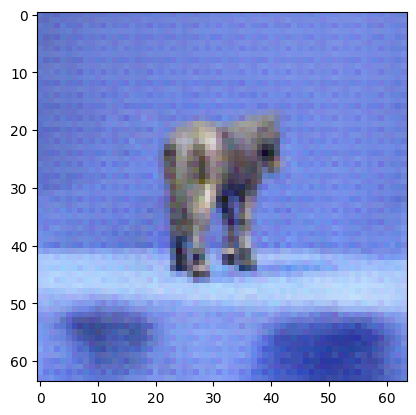

 Epoch 314 
 Completion: 78.500000 percent


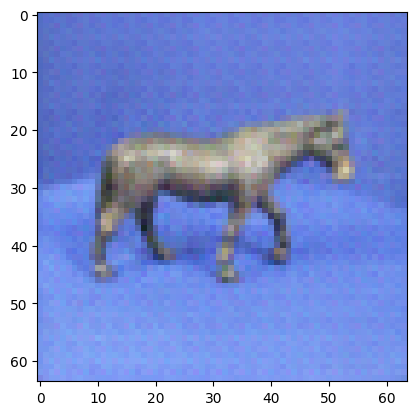

 Epoch 315 
 Completion: 78.750000 percent


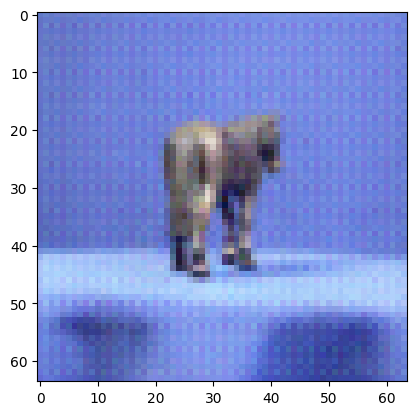

 Epoch 316 
 Completion: 79.000000 percent


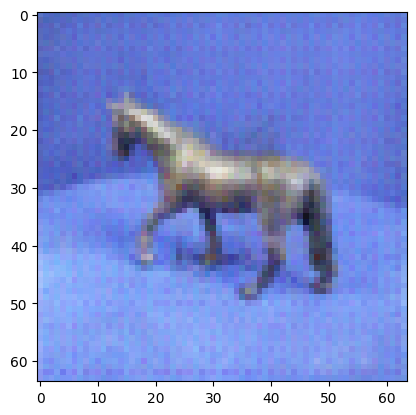

 Epoch 317 
 Completion: 79.250000 percent


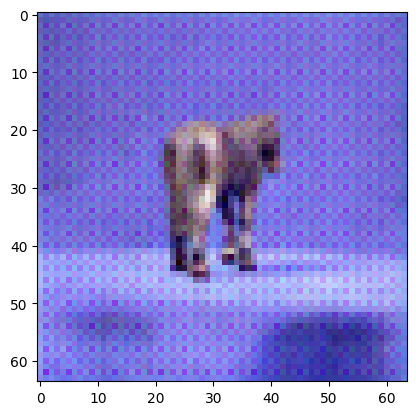

 Epoch 318 
 Completion: 79.500000 percent


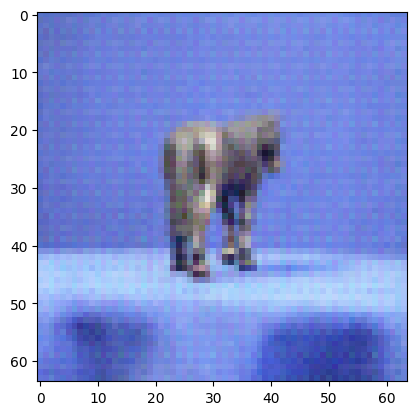

 Epoch 319 
 Completion: 79.750000 percent


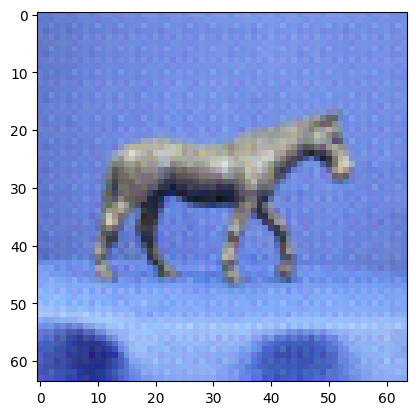

 Epoch 320 
 Completion: 80.000000 percent


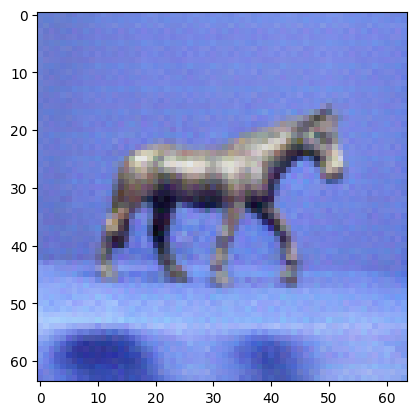

 Epoch 321 
 Completion: 80.250000 percent


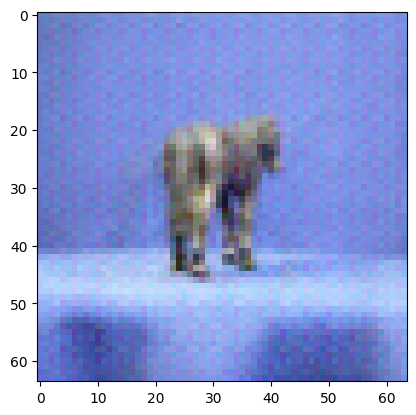

 Epoch 322 
 Completion: 80.500000 percent


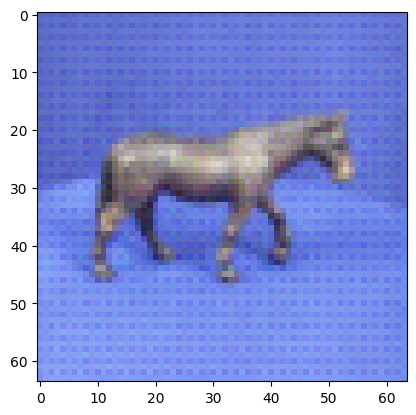

 Epoch 323 
 Completion: 80.750000 percent


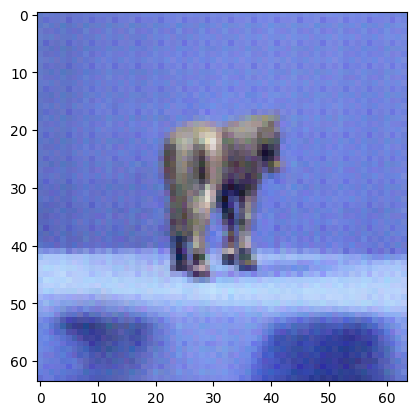

 Epoch 324 
 Completion: 81.000000 percent


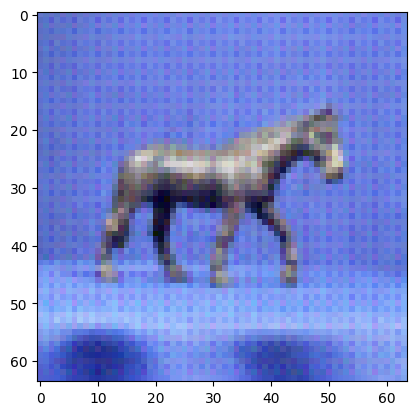

 Epoch 325 
 Completion: 81.250000 percent


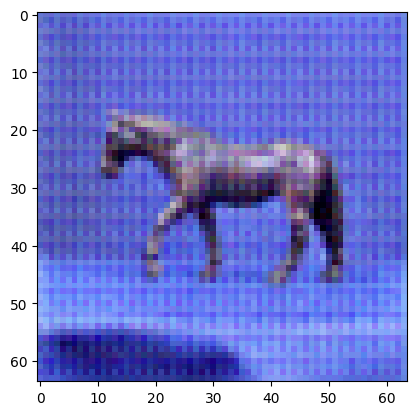

 Epoch 326 
 Completion: 81.500000 percent


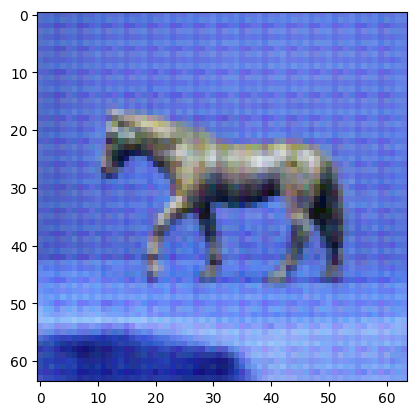

 Epoch 327 
 Completion: 81.750000 percent


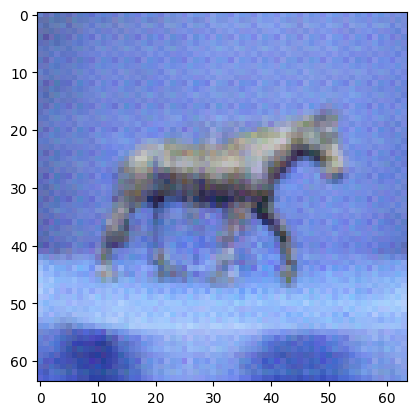

 Epoch 328 
 Completion: 82.000000 percent


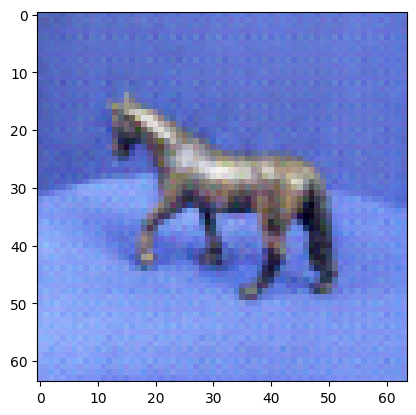

 Epoch 329 
 Completion: 82.250000 percent


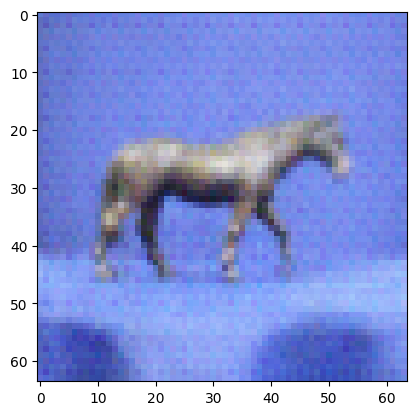

 Epoch 330 
 Completion: 82.500000 percent


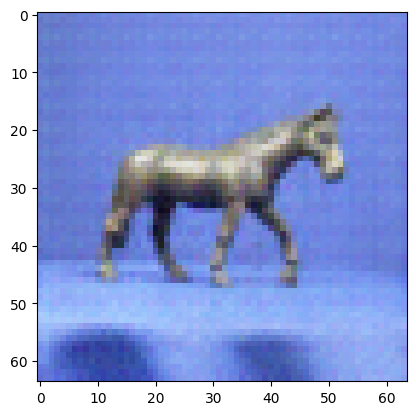

 Epoch 331 
 Completion: 82.750000 percent


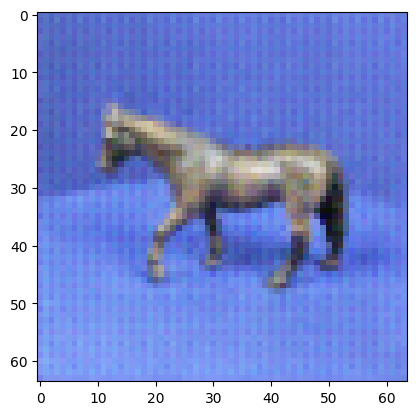

 Epoch 332 
 Completion: 83.000000 percent


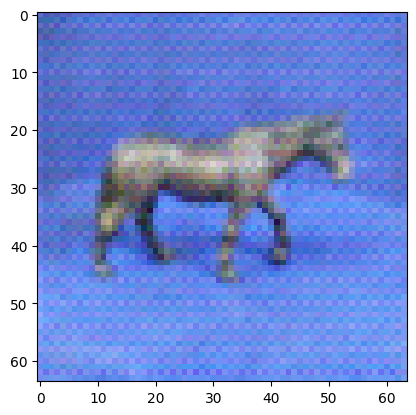

 Epoch 333 
 Completion: 83.250000 percent


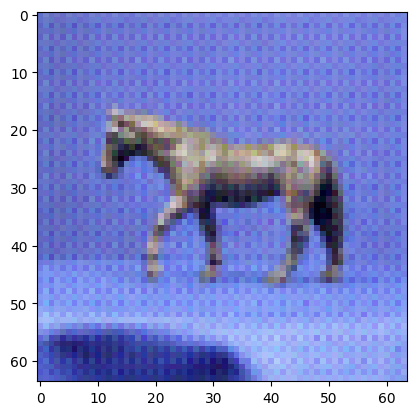

 Epoch 334 
 Completion: 83.500000 percent


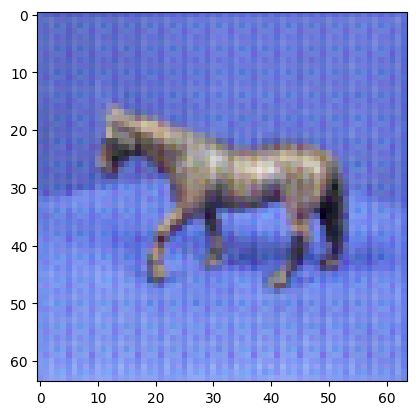

 Epoch 335 
 Completion: 83.750000 percent


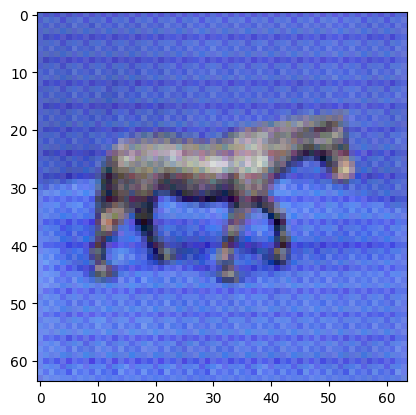

 Epoch 336 
 Completion: 84.000000 percent


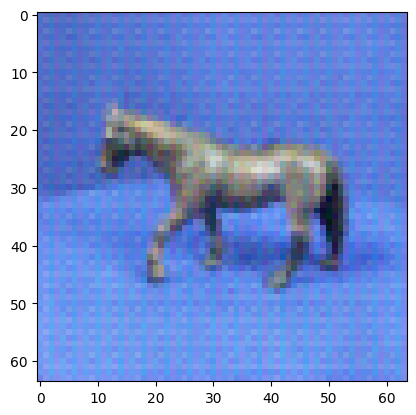

 Epoch 337 
 Completion: 84.250000 percent


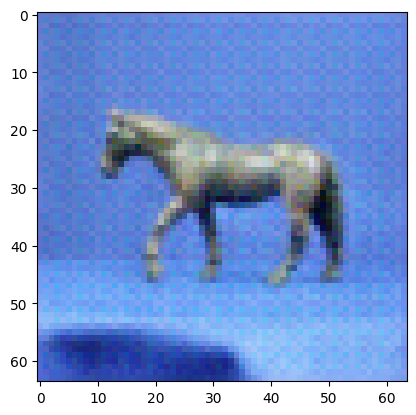

 Epoch 338 
 Completion: 84.500000 percent


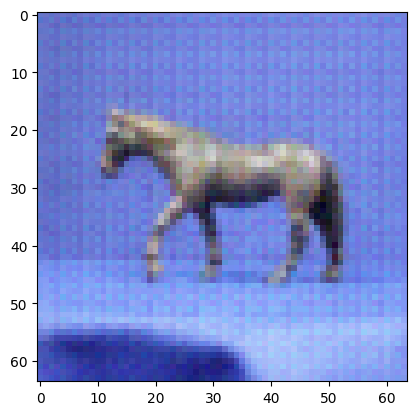

 Epoch 339 
 Completion: 84.750000 percent


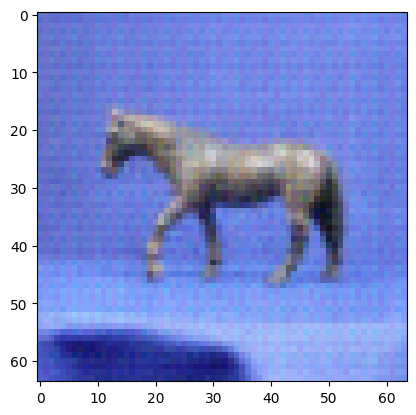

 Epoch 340 
 Completion: 85.000000 percent


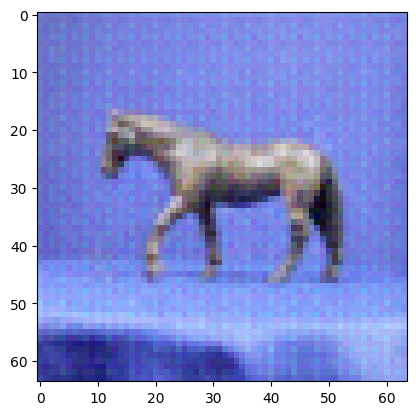

 Epoch 341 
 Completion: 85.250000 percent


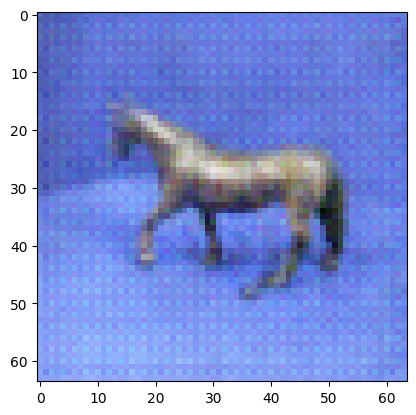

 Epoch 342 
 Completion: 85.500000 percent


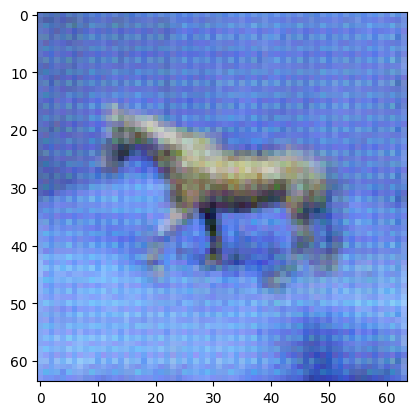

 Epoch 343 
 Completion: 85.750000 percent


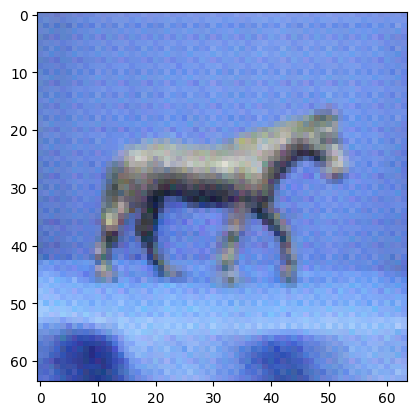

 Epoch 344 
 Completion: 86.000000 percent


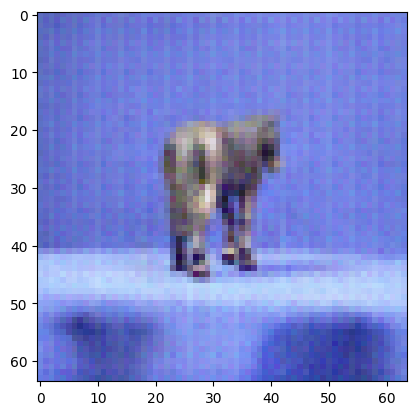

 Epoch 345 
 Completion: 86.250000 percent


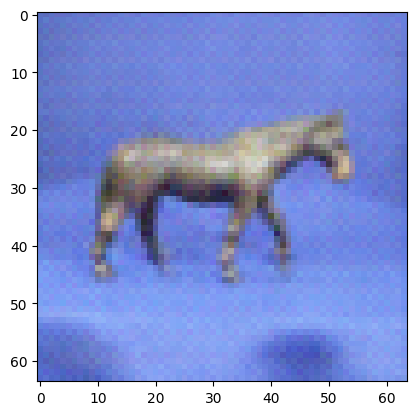

 Epoch 346 
 Completion: 86.500000 percent


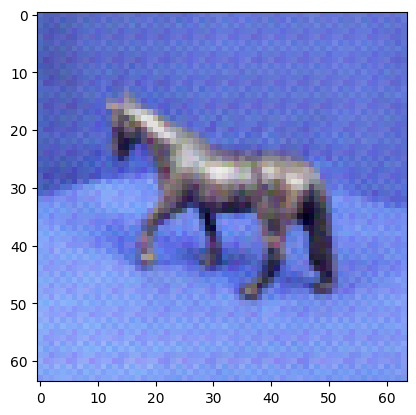

 Epoch 347 
 Completion: 86.750000 percent


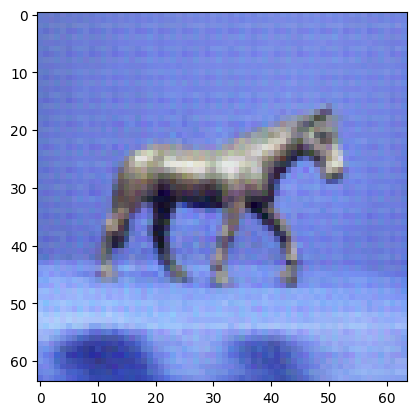

 Epoch 348 
 Completion: 87.000000 percent


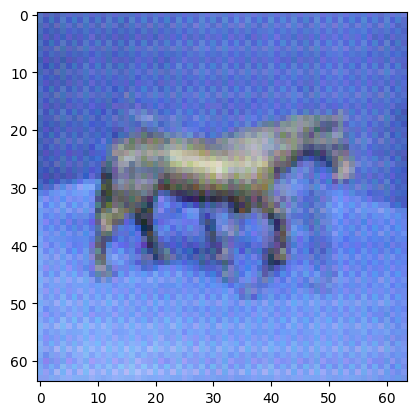

 Epoch 349 
 Completion: 87.250000 percent


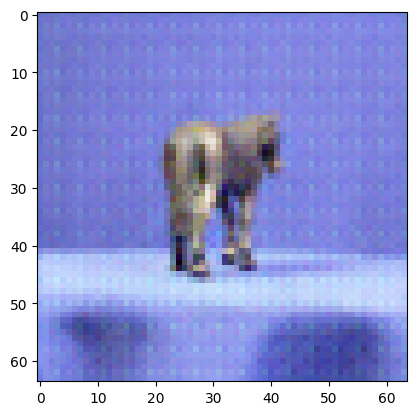

 Epoch 350 
 Completion: 87.500000 percent


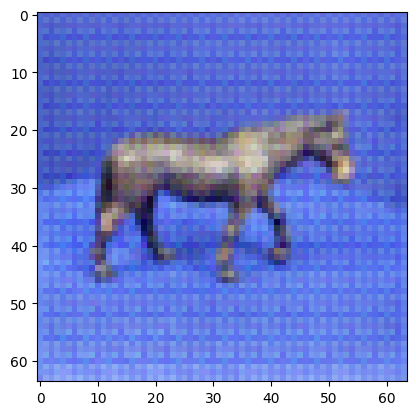

 Epoch 351 
 Completion: 87.750000 percent


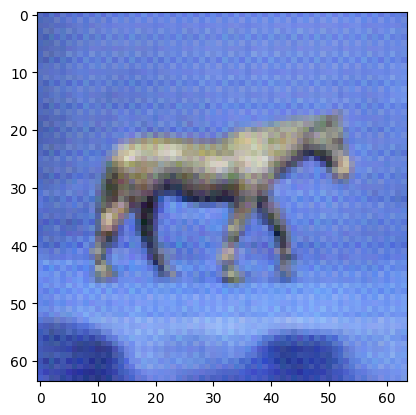

 Epoch 352 
 Completion: 88.000000 percent


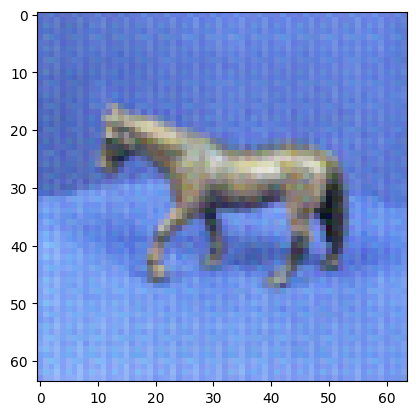

 Epoch 353 
 Completion: 88.250000 percent


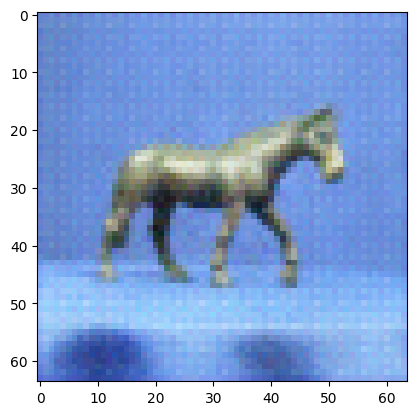

 Epoch 354 
 Completion: 88.500000 percent


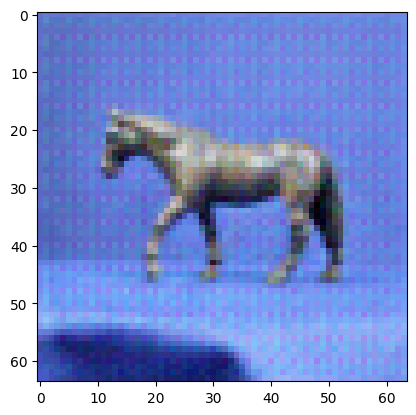

 Epoch 355 
 Completion: 88.750000 percent


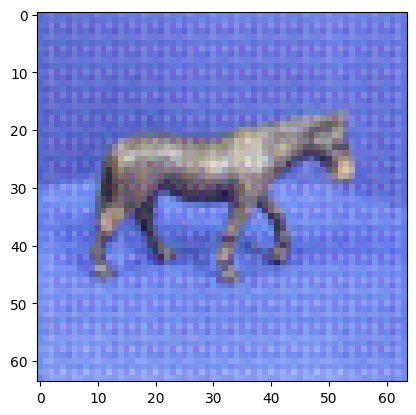

 Epoch 356 
 Completion: 89.000000 percent


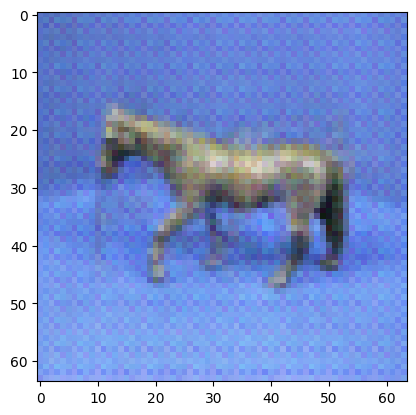

 Epoch 357 
 Completion: 89.250000 percent


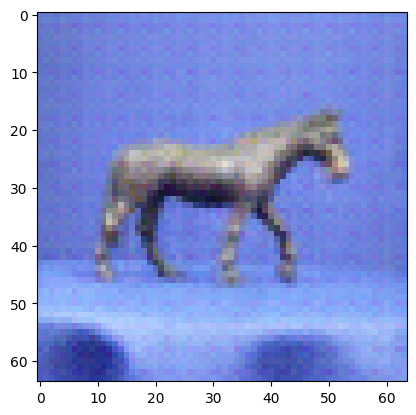

 Epoch 358 
 Completion: 89.500000 percent


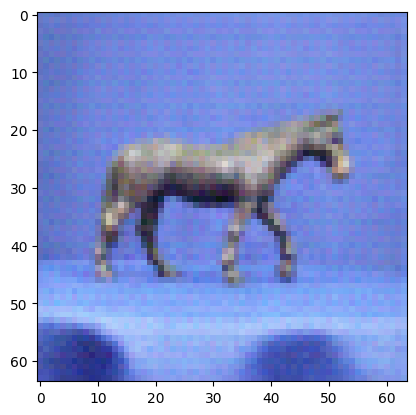

 Epoch 359 
 Completion: 89.750000 percent


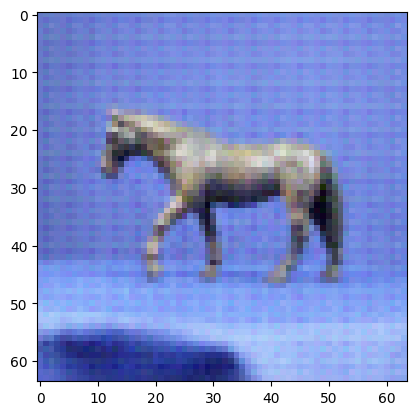

 Epoch 360 
 Completion: 90.000000 percent


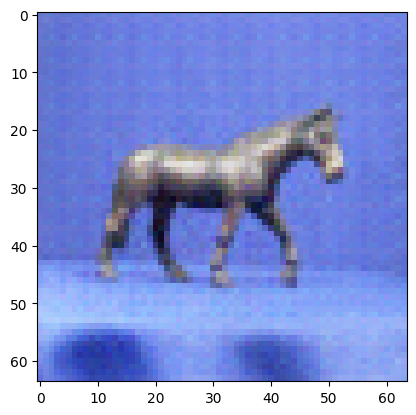

 Epoch 361 
 Completion: 90.250000 percent


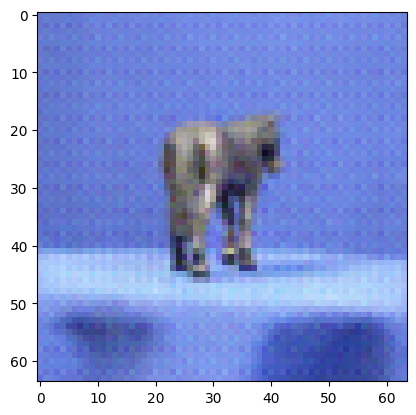

 Epoch 362 
 Completion: 90.500000 percent


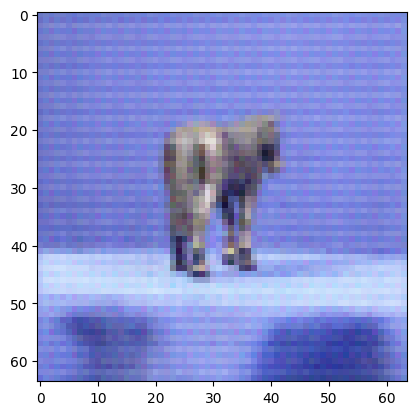

 Epoch 363 
 Completion: 90.750000 percent


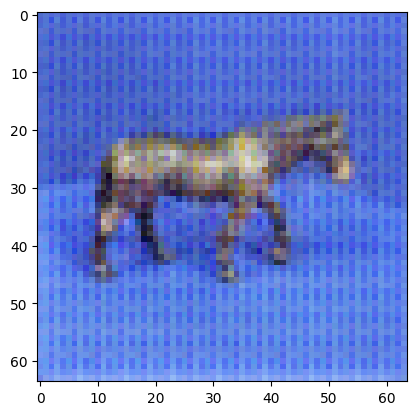

 Epoch 364 
 Completion: 91.000000 percent


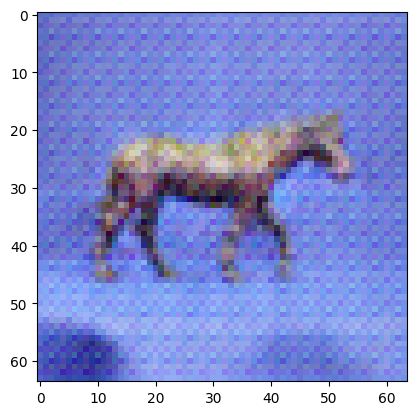

 Epoch 365 
 Completion: 91.250000 percent


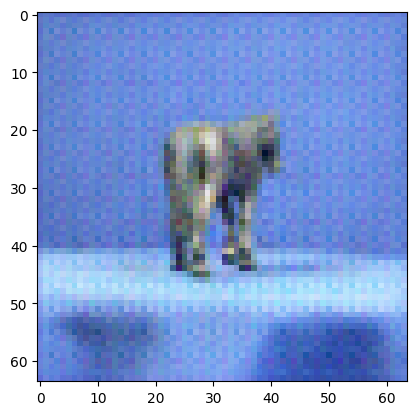

 Epoch 366 
 Completion: 91.500000 percent


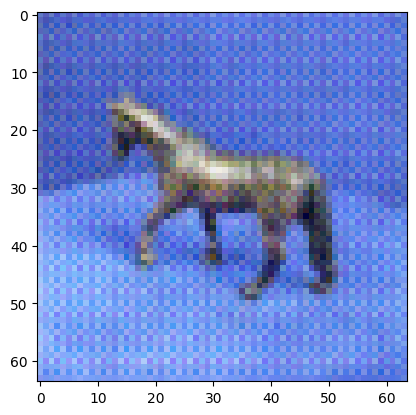

 Epoch 367 
 Completion: 91.750000 percent


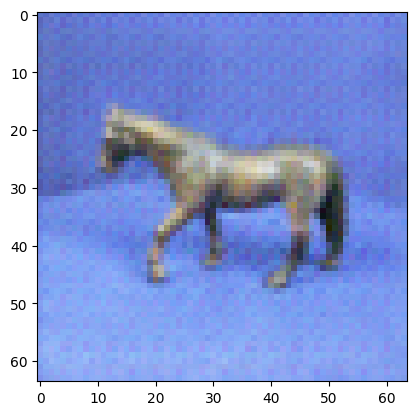

 Epoch 368 
 Completion: 92.000000 percent


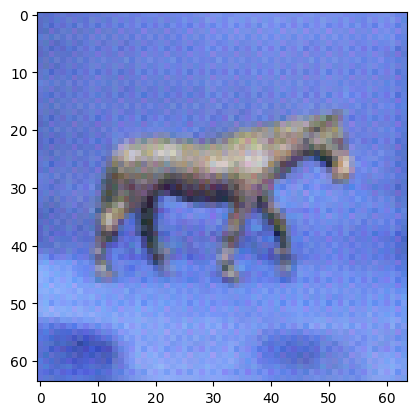

 Epoch 369 
 Completion: 92.250000 percent


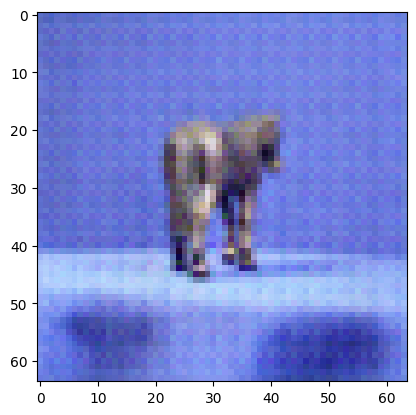

 Epoch 370 
 Completion: 92.500000 percent


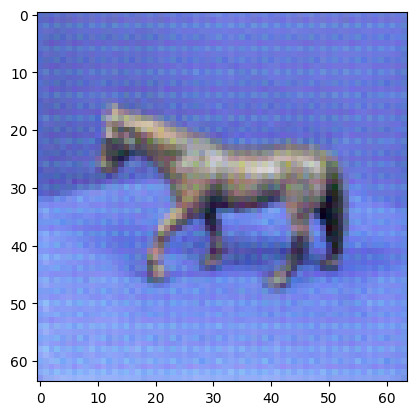

 Epoch 371 
 Completion: 92.750000 percent


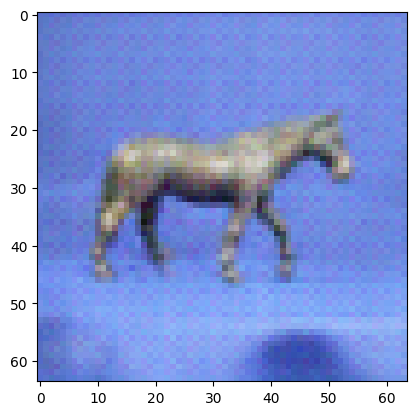

 Epoch 372 
 Completion: 93.000000 percent


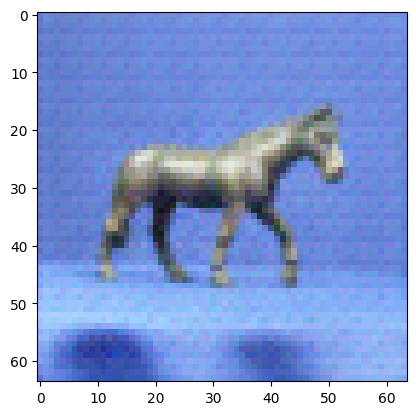

 Epoch 373 
 Completion: 93.250000 percent


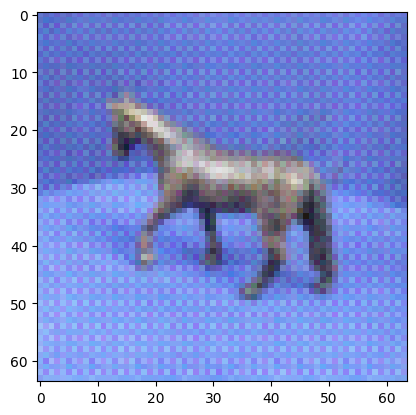

 Epoch 374 
 Completion: 93.500000 percent


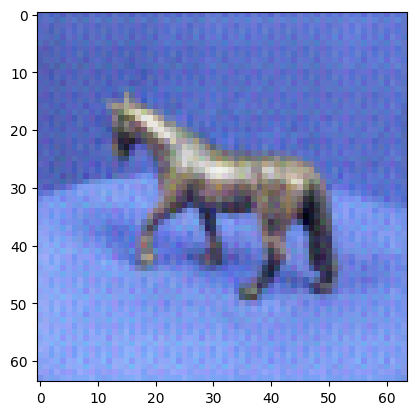

 Epoch 375 
 Completion: 93.750000 percent


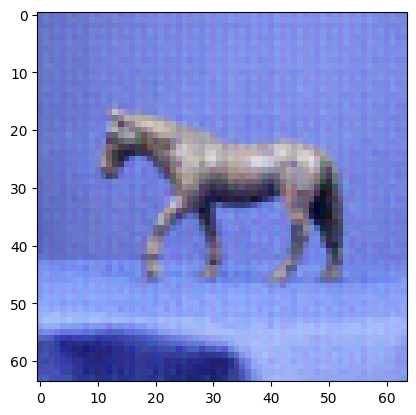

 Epoch 376 
 Completion: 94.000000 percent


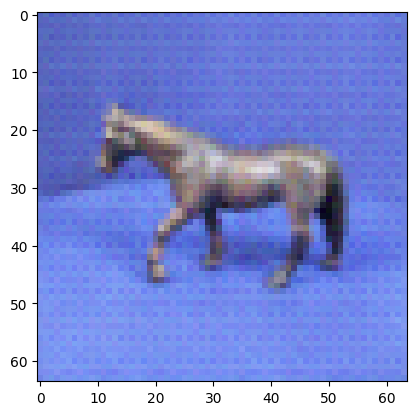

 Epoch 377 
 Completion: 94.250000 percent


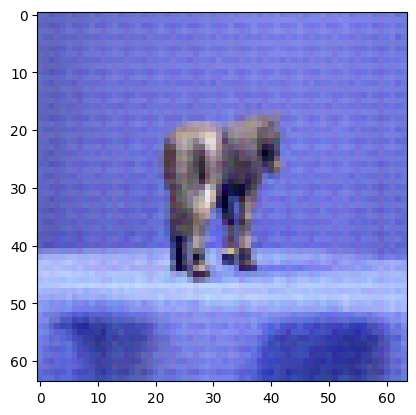

 Epoch 378 
 Completion: 94.500000 percent


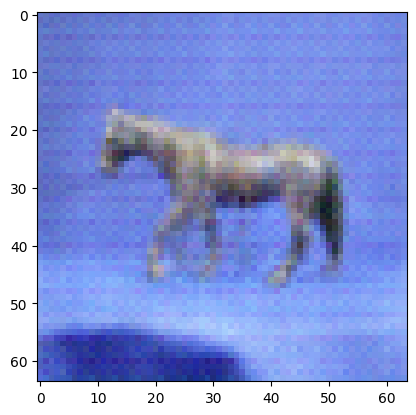

 Epoch 379 
 Completion: 94.750000 percent


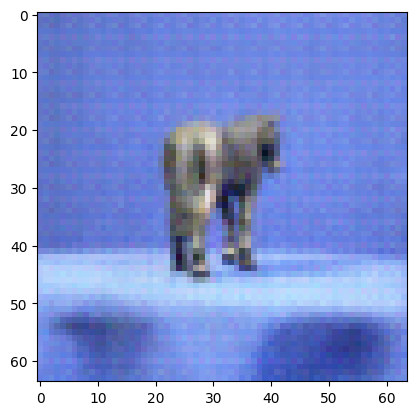

 Epoch 380 
 Completion: 95.000000 percent


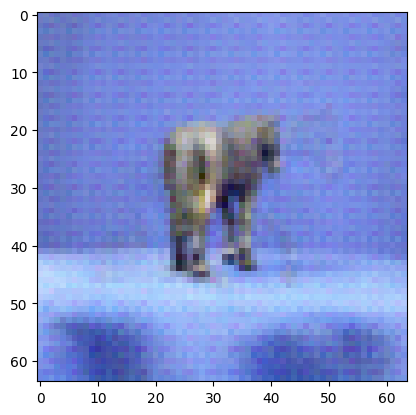

 Epoch 381 
 Completion: 95.250000 percent


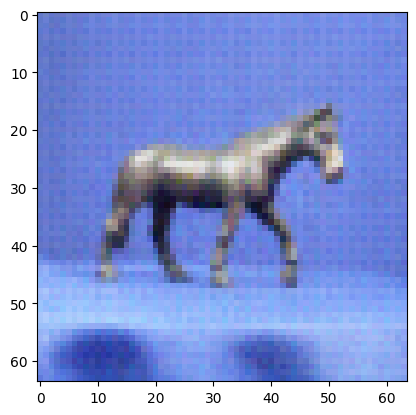

 Epoch 382 
 Completion: 95.500000 percent


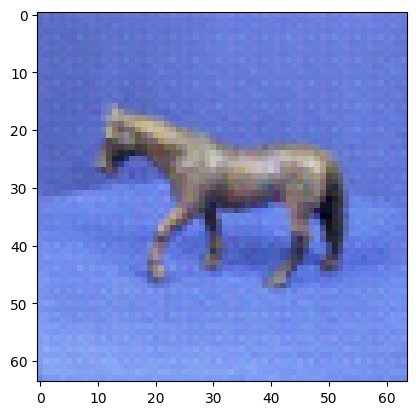

 Epoch 383 
 Completion: 95.750000 percent


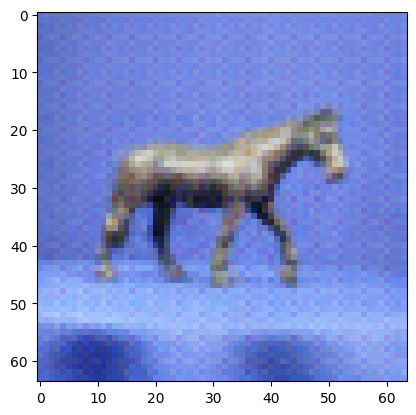

 Epoch 384 
 Completion: 96.000000 percent


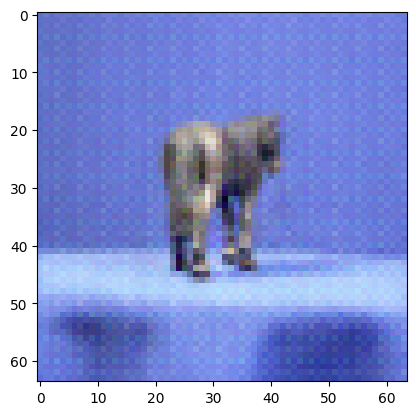

 Epoch 385 
 Completion: 96.250000 percent


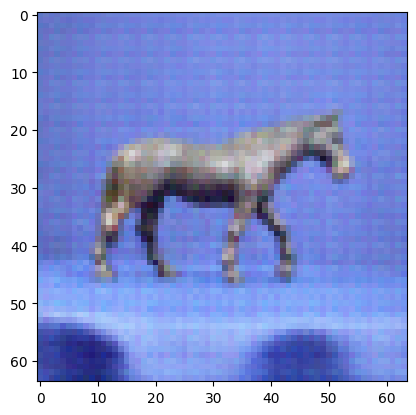

 Epoch 386 
 Completion: 96.500000 percent


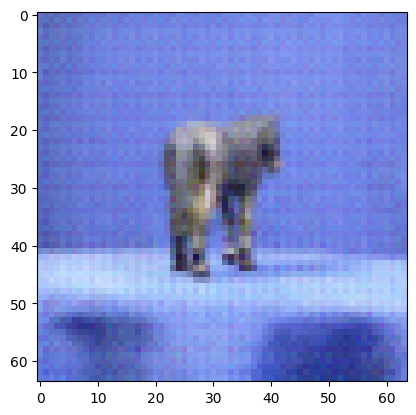

 Epoch 387 
 Completion: 96.750000 percent


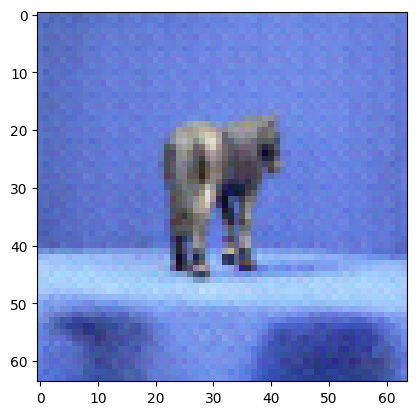

 Epoch 388 
 Completion: 97.000000 percent


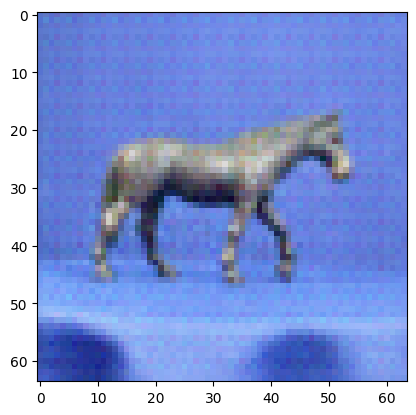

 Epoch 389 
 Completion: 97.250000 percent


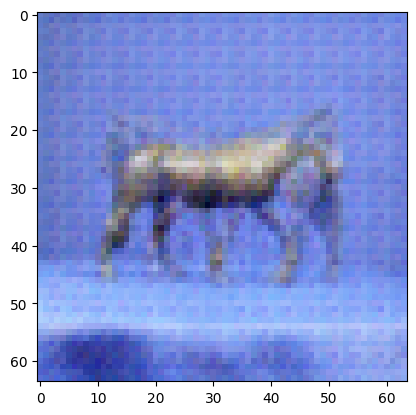

 Epoch 390 
 Completion: 97.500000 percent


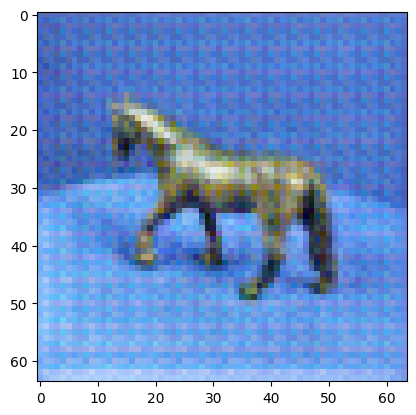

 Epoch 391 
 Completion: 97.750000 percent


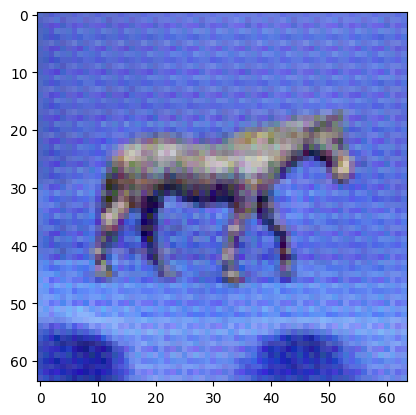

 Epoch 392 
 Completion: 98.000000 percent


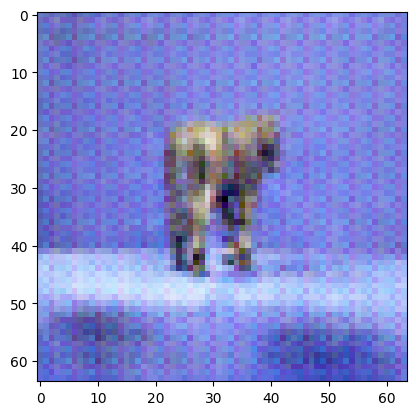

 Epoch 393 
 Completion: 98.250000 percent


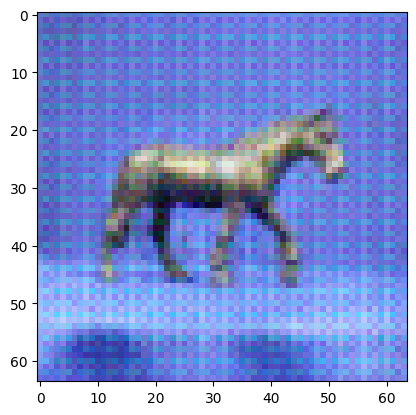

 Epoch 394 
 Completion: 98.500000 percent


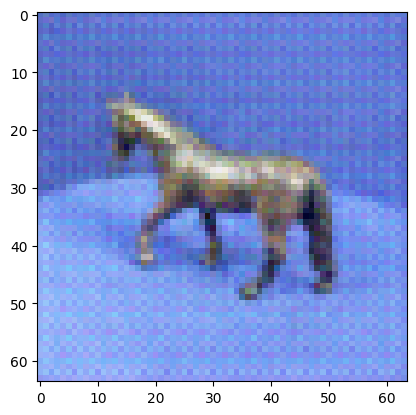

 Epoch 395 
 Completion: 98.750000 percent


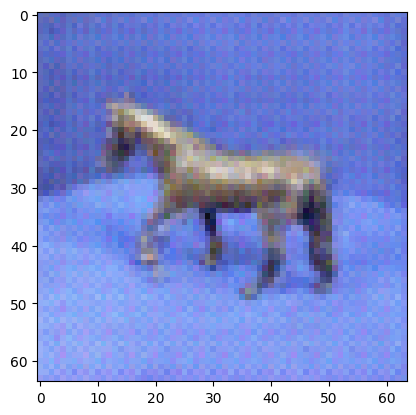

 Epoch 396 
 Completion: 99.000000 percent


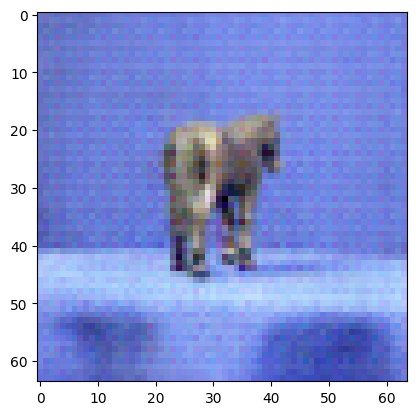

 Epoch 397 
 Completion: 99.250000 percent


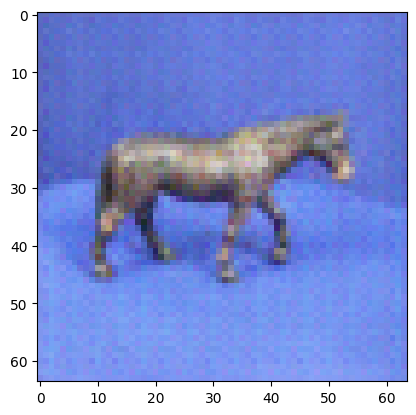

 Epoch 398 
 Completion: 99.500000 percent


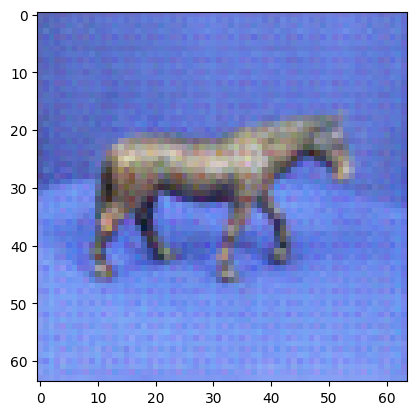

 Epoch 399 
 Completion: 99.750000 percent
Finished Training


In [ ]:
#Training GAN
print("Starting Training Loop...")


n_of_epochs = 400


for e in range(n_of_epochs):
    running_loss_D = 0.0
    for i, data in enumerate(trainloader, 0):

    #################################################################
    ## Update Discriminator: maximize log(D(x)) + log(1 - D(G(z))) ##
    #################################################################

        #Loss on real Images
        inputs, b = data
        myDiscriminator.zero_grad()
        predicted = myDiscriminator(inputs.to(device))
        labels = torch.ones(len(b), 1, 1,1, dtype=torch.float, device=device)# real
        loss_real = BCELoss(predicted, labels.to(device))
        loss_real.backward()

        #Loss on fake Images
        noise = torch.randn(1, 10, 1,1)
        fake_image = myGenerator(noise.to(device))
        predicted = myDiscriminator(fake_image.detach())
        target = torch.zeros(len(b),1, 1, 1, dtype=torch.float, device=device)# fake
        loss_fake = BCELoss(predicted, target)
        loss_fake.backward()
        loss_Discriminator = loss_real + loss_fake
        optimizerD.step()

    ###############################################
    ### Update Generator: maximize log(D(G(z))) ###
    ###############################################

        myGenerator.zero_grad()
        predicted = myDiscriminator(fake_image)
        target = torch.ones(1, 1, 1,1, dtype=torch.float, device=device)# real for the generator
        loss_gen = BCELoss(predicted, target)
        loss_gen.backward()
        optimizerG.step()
        running_loss_D +=  loss_Discriminator.item()

    #################################
    ### Plotting Generated images ###
    #################################
    %matplotlib inline
    noise = torch.randn(1, 10, 1,1)
    z = myGenerator(noise.to(device))
    z = z.cpu().detach().squeeze().permute(1, 2, 0).numpy()
    plt.imshow(z)
    plt.show()
    print(" Epoch %d \n Completion: %f percent" %(e,e/n_of_epochs*100))
    #################################
    ###  Saving Generated images  ###
    #################################
    if e > 200:
      fake_img=myGenerator(noise.to(device))
      save_image(fake_img,f'/content/drive/MyDrive/Newdata/GAN/Fake_Imgs_Horses/FakeIMG_{e}.png')
print('Finished Training')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
